In [ ]:
!pip install meteostat
!pip install geopandas
!pip install sktime
!pip install gstools
!pip install pysal
!pip install joblib

!pip install pysal geopandas matplotlib seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.6/323.6 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.9/23.9 MB 77.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 102.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 85.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.7/36.7 MB 37.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.4/137.4 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.4/47.4 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.2/166.2 kB 10.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 53.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf

In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import scipy
import math
import numpy as np
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import random
#from sktime.classification.distance_based import KNeighborsTimeSeriesClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D,Conv2D, MaxPooling1D,MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam


from datetime import datetime
import pandas as pd
from meteostat import Point, Daily
import geopandas as gpd

##yield_county and soil

In [ ]:
df_soil = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/table_static_data_selected.csv')

In [ ]:
df_soil.columns

Index(['OID_', 'AREA', 'PERIMETER', 'NAME_U', 'NAME_L', 'aws0_5', 'aws5_20',
       'aws20_50', 'aws0_20', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30',
       'nccpi3corn', 'nccpi3soy', 'nccpi3all', 'slope_r', 'elev_r',
       'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Shape_Length', 'Shape_Area'],
      dtype='object')

In [ ]:
df_soil['NAME_U'].unique().shape

(92,)

In [ ]:
df_yield = pd.read_csv('/content/drive/MyDrive/yield_classification/corn2001_2023_yield_data.csv')

In [ ]:
import pandas as pd

# Load the soil and yield datasets
df_soil = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/table_static_data_selected.csv')
df_yield = pd.read_csv('/content/drive/MyDrive/yield_classification/corn2001_2023_yield_data.csv')

# Preview the datasets to check the common columns for merging
print("Soil Data Columns:", df_soil.columns)
print("Yield Data Columns:", df_yield.columns)

# Ensure both datasets have a standardized 'county' column for merging
df_soil['NAME_U'] = df_soil['NAME_U'].str.upper()  # Convert to uppercase to match the formatting of 'County'
df_yield['County'] = df_yield['County'].str.upper()  # Convert to uppercase to match the formatting of 'NAME_U'

# Select only the NCCPI and AWS data along with the county (NAME_U) in df_soil
df_soil_subset = df_soil[['NAME_U', 'nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay']]

# Rename 'NAME_U' to 'County' in df_soil_subset to match df_yield for merging
df_soil_subset.rename(columns={'NAME_U': 'County'}, inplace=True)

# Merge the two datasets on the 'County' column, keeping only matching counties
df_merged = pd.merge(df_yield, df_soil_subset, on='County', how='inner')

# Preview the merged dataset
print(df_merged.head())

# Optionally save the merged DataFrame to a CSV
df_merged.to_csv('/content/drive/MyDrive/yield_classification/merged_yield_soil.csv', index=False)



Soil Data Columns: Index(['OID_', 'AREA', 'PERIMETER', 'NAME_U', 'NAME_L', 'aws0_5', 'aws5_20',
       'aws20_50', 'aws0_20', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30',
       'nccpi3corn', 'nccpi3soy', 'nccpi3all', 'slope_r', 'elev_r',
       'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Shape_Length', 'Shape_Area'],
      dtype='object')
Yield Data Columns: Index(['Unnamed: 0', 'Program', 'Year', 'Period', 'Week Ending', 'Geo Level',
       'State', 'State ANSI', 'Ag District', 'Ag District Code', 'County',
       'County ANSI', 'Zip Code', 'Region', 'watershed_code', 'Watershed',
       'Commodity', 'Data Item', 'Domain', 'Domain Category', 'Value',
       'CV (%)', 'classification'],
      dtype='object')
   Unnamed: 0 Program  Year Period  Week Ending Geo Level    State  \
0           1  SURVEY  2023   YEAR          NaN    COUNTY  INDIANA   
1           2  SURVEY  2023   YEAR          NaN    COUNTY  INDIANA   
2           3  SURVEY  2023   YEAR          NaN    COUNTY  INDIANA   
3  

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Correlation matrix for Year 2016:
             nccpi3corn    aws0_5   aws5_20  aws20_50   tk0_20a   tk0_30a  \
nccpi3corn    1.000000 -0.029444  0.052298  0.111714 -0.153157 -0.153157   
aws0_5       -0.029444  1.000000  0.977060  0.889473  0.159378  0.159378   
aws5_20       0.052298  0.977060  1.000000  0.936576  0.134784  0.134783   
aws20_50      0.111714  0.889473  0.936576  1.000000  0.181440  0.181440   
tk0_20a      -0.153157  0.159378  0.134784  0.181440  1.000000  1.000000   
tk0_30a      -0.153157  0.159378  0.134783  0.181440  1.000000  1.000000   
soc0_20      -0.056244  0.724337  0.745959  0.787841  0.110126  0.110126   
soc0_30      -0.061283  0.729586  0.752203  0.797754  0.107477  0.107477   
slope_r      -0.499796  0.011340 -0.113639 -0.227102  0.049064  0.049064   
elev_r       -0.126580  0.052130  0.035536 -0.057748  0.070214  0.070214   
W_avg_sand   -0.234485 -0.456917 -0.445450 -0.307951  0.065128  0.065128   
W_avg_silt    0.381988  0.072005  0.075506 -0.025356 

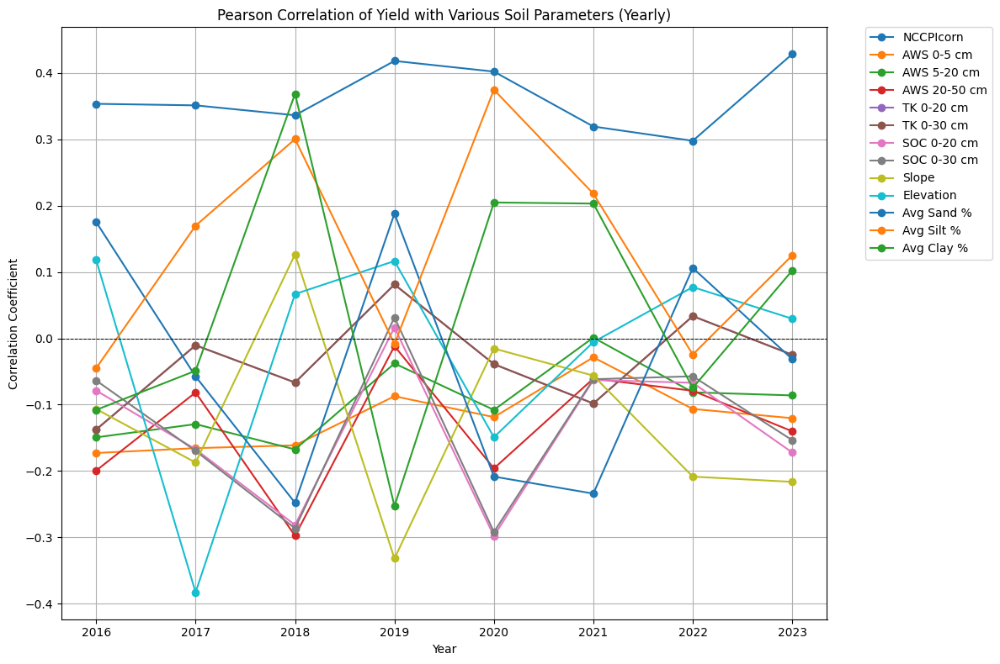

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the merged dataset
df_merged = pd.read_csv('/content/drive/MyDrive/yield_classification/merged_yield_soil.csv')

# Ensure that numeric columns are correctly set
df_merged['nccpi3corn'] = pd.to_numeric(df_merged['nccpi3corn'], errors='coerce')
df_merged['aws0_5'] = pd.to_numeric(df_merged['aws0_5'], errors='coerce')
df_merged['aws5_20'] = pd.to_numeric(df_merged['aws5_20'], errors='coerce')
df_merged['aws20_50'] = pd.to_numeric(df_merged['aws20_50'], errors='coerce')
df_merged['tk0_20a'] = pd.to_numeric(df_merged['tk0_20a'], errors='coerce')
df_merged['tk0_30a'] = pd.to_numeric(df_merged['tk0_30a'], errors='coerce')
df_merged['soc0_20'] = pd.to_numeric(df_merged['soc0_20'], errors='coerce')
df_merged['soc0_30'] = pd.to_numeric(df_merged['soc0_30'], errors='coerce')
df_merged['slope_r'] = pd.to_numeric(df_merged['slope_r'], errors='coerce')
df_merged['elev_r'] = pd.to_numeric(df_merged['elev_r'], errors='coerce')
df_merged['W_avg_sand'] = pd.to_numeric(df_merged['W_avg_sand'], errors='coerce')
df_merged['W_avg_silt'] = pd.to_numeric(df_merged['W_avg_silt'], errors='coerce')
df_merged['W_avg_clay'] = pd.to_numeric(df_merged['W_avg_clay'], errors='coerce')
df_merged['Value'] = pd.to_numeric(df_merged['Value'], errors='coerce')  # Assuming 'Value' is the yield column
df_merged['Year'] = pd.to_numeric(df_merged['Year'], errors='coerce')

# Drop rows with missing data in any of the columns
df_merged.dropna(subset=['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Value'], inplace=True)

# Group data by year and calculate correlations
correlation_summary = []
for year, group in df_merged.groupby('Year'):
    # Compute Pearson correlation matrix for each year
    corr_matrix = group[['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Value']].corr()

    # Store correlations between yield and each variable
    correlation_summary.append({
        'Year': year,
        'nccpi3corn_corr': corr_matrix.loc['Value', 'nccpi3corn'],
        'aws0_5_corr': corr_matrix.loc['Value', 'aws0_5'],
        'aws5_20_corr': corr_matrix.loc['Value', 'aws5_20'],
        'aws20_50_corr': corr_matrix.loc['Value', 'aws20_50'],
        'tk0_20a_corr': corr_matrix.loc['Value', 'tk0_20a'],
        'tk0_30a_corr': corr_matrix.loc['Value', 'tk0_30a'],
        'soc0_20_corr': corr_matrix.loc['Value', 'soc0_20'],
        'soc0_30_corr': corr_matrix.loc['Value', 'soc0_30'],
        'slope_r_corr': corr_matrix.loc['Value', 'slope_r'],
        'elev_r_corr': corr_matrix.loc['Value', 'elev_r'],
        'W_avg_sand_corr': corr_matrix.loc['Value', 'W_avg_sand'],
        'W_avg_silt_corr': corr_matrix.loc['Value', 'W_avg_silt'],
        'W_avg_clay_corr': corr_matrix.loc['Value', 'W_avg_clay'],
    })

    # Print the correlation matrix for the current year
    print(f"Correlation matrix for Year {year}:\n", corr_matrix)
    print("\n")

# Convert the correlation summary into a DataFrame
correlation_df = pd.DataFrame(correlation_summary)

# Plot correlations for each variable over the years
plt.figure(figsize=(12, 8))
plt.plot(correlation_df['Year'], correlation_df['nccpi3corn_corr'], marker='o', label='NCCPIcorn')
plt.plot(correlation_df['Year'], correlation_df['aws0_5_corr'], marker='o', label='AWS 0-5 cm')
plt.plot(correlation_df['Year'], correlation_df['aws5_20_corr'], marker='o', label='AWS 5-20 cm')
plt.plot(correlation_df['Year'], correlation_df['aws20_50_corr'], marker='o', label='AWS 20-50 cm')
plt.plot(correlation_df['Year'], correlation_df['tk0_20a_corr'], marker='o', label='TK 0-20 cm')
plt.plot(correlation_df['Year'], correlation_df['tk0_30a_corr'], marker='o', label='TK 0-30 cm')
plt.plot(correlation_df['Year'], correlation_df['soc0_20_corr'], marker='o', label='SOC 0-20 cm')
plt.plot(correlation_df['Year'], correlation_df['soc0_30_corr'], marker='o', label='SOC 0-30 cm')
plt.plot(correlation_df['Year'], correlation_df['slope_r_corr'], marker='o', label='Slope')
plt.plot(correlation_df['Year'], correlation_df['elev_r_corr'], marker='o', label='Elevation')
plt.plot(correlation_df['Year'], correlation_df['W_avg_sand_corr'], marker='o', label='Avg Sand %')
plt.plot(correlation_df['Year'], correlation_df['W_avg_silt_corr'], marker='o', label='Avg Silt %')
plt.plot(correlation_df['Year'], correlation_df['W_avg_clay_corr'], marker='o', label='Avg Clay %')

plt.title('Pearson Correlation of Yield with Various Soil Parameters (Yearly)')
plt.xlabel('Year')
plt.ylabel('Correlation Coefficient')
plt.axhline(0, color='black', linestyle='--', linewidth=0.7)
plt.grid(True)
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.tight_layout()
plt.show()

# Save the correlation results to a CSV file
#correlation_df.to_csv('/content/drive/MyDrive/yield_classification/yield_soil_correlation.csv', index=False)


Correlation Matrix:
             nccpi3corn    aws0_5   aws5_20  aws20_50   tk0_20a   tk0_30a  \
nccpi3corn    1.000000 -0.010665  0.073736  0.133341 -0.166658 -0.166658   
aws0_5       -0.010665  1.000000  0.975552  0.883244  0.156230  0.156230   
aws5_20       0.073736  0.975552  1.000000  0.932960  0.129277  0.129277   
aws20_50      0.133341  0.883244  0.932960  1.000000  0.156629  0.156629   
tk0_20a      -0.166658  0.156230  0.129277  0.156629  1.000000  1.000000   
tk0_30a      -0.166658  0.156230  0.129277  0.156629  1.000000  1.000000   
soc0_20      -0.041674  0.724509  0.748703  0.792609  0.103616  0.103616   
soc0_30      -0.045817  0.729937  0.755437  0.803418  0.099244  0.099244   
slope_r      -0.510636  0.011789 -0.112015 -0.219195  0.028877  0.028877   
elev_r       -0.124646  0.049711  0.040584 -0.058679  0.121097  0.121097   
W_avg_sand   -0.235334 -0.463321 -0.449985 -0.302945  0.068761  0.068761   
W_avg_silt    0.370445  0.062821  0.063269 -0.039113 -0.133049 -0.1

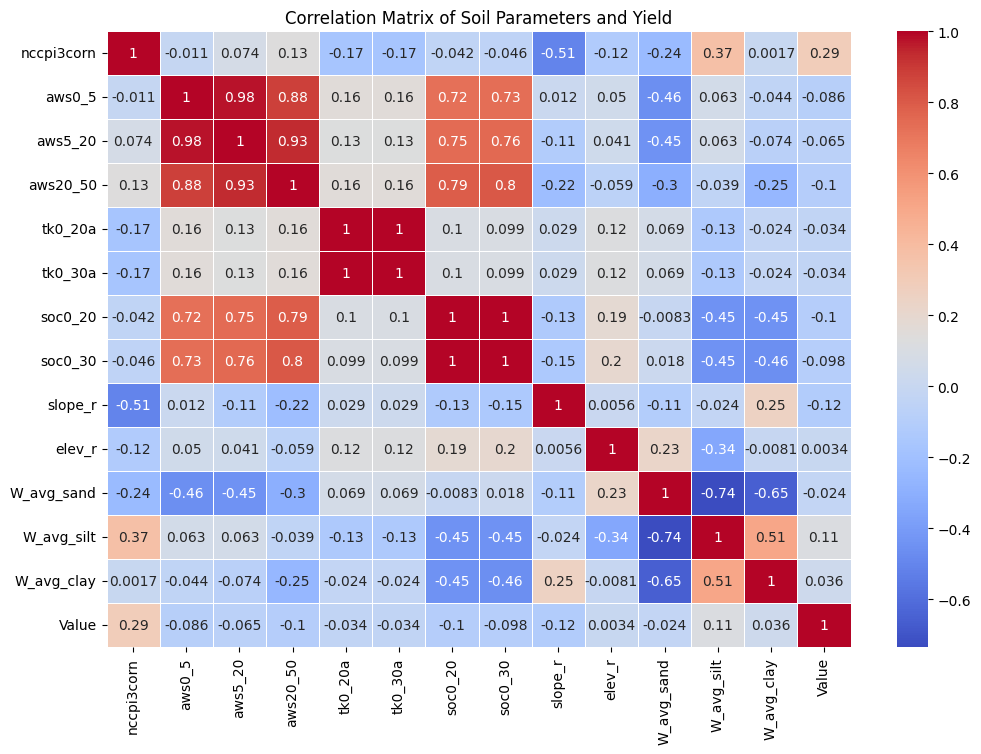

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the merged dataset
df_merged = pd.read_csv('/content/drive/MyDrive/yield_classification/merged_yield_soil.csv')

# Ensure that numeric columns are correctly set
df_merged['nccpi3corn'] = pd.to_numeric(df_merged['nccpi3corn'], errors='coerce')
df_merged['aws0_5'] = pd.to_numeric(df_merged['aws0_5'], errors='coerce')
df_merged['aws5_20'] = pd.to_numeric(df_merged['aws5_20'], errors='coerce')
df_merged['aws20_50'] = pd.to_numeric(df_merged['aws20_50'], errors='coerce')
df_merged['tk0_20a'] = pd.to_numeric(df_merged['tk0_20a'], errors='coerce')
df_merged['tk0_30a'] = pd.to_numeric(df_merged['tk0_30a'], errors='coerce')
df_merged['soc0_20'] = pd.to_numeric(df_merged['soc0_20'], errors='coerce')
df_merged['soc0_30'] = pd.to_numeric(df_merged['soc0_30'], errors='coerce')
df_merged['slope_r'] = pd.to_numeric(df_merged['slope_r'], errors='coerce')
df_merged['elev_r'] = pd.to_numeric(df_merged['elev_r'], errors='coerce')
df_merged['W_avg_sand'] = pd.to_numeric(df_merged['W_avg_sand'], errors='coerce')
df_merged['W_avg_silt'] = pd.to_numeric(df_merged['W_avg_silt'], errors='coerce')
df_merged['W_avg_clay'] = pd.to_numeric(df_merged['W_avg_clay'], errors='coerce')
df_merged['Value'] = pd.to_numeric(df_merged['Value'], errors='coerce')  # Assuming 'Value' is the yield column

# Drop rows with missing data
df_cleaned = df_merged.dropna(subset=['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Value'])

# Generate the correlation matrix
corr_matrix = df_cleaned[['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Value']].corr()

# Print the correlation matrix
print("Correlation Matrix:\n", corr_matrix)

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Soil Parameters and Yield')
plt.show()


       Feature  Mutual Information
11  W_avg_silt            0.125869
7      soc0_30            0.081487
6      soc0_20            0.076589
0   nccpi3corn            0.074332
12  W_avg_clay            0.067980
8      slope_r            0.055331
9       elev_r            0.034072
2      aws5_20            0.032787
1       aws0_5            0.023010
3     aws20_50            0.022543
5      tk0_30a            0.010133
10  W_avg_sand            0.009598
4      tk0_20a            0.008658


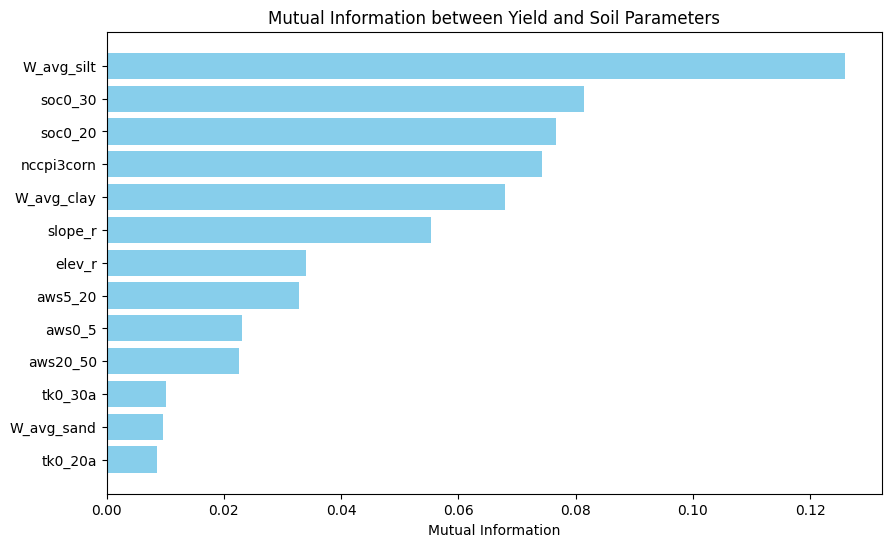

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_selection import mutual_info_regression

# Load the merged dataset
df_merged = pd.read_csv('/content/drive/MyDrive/yield_classification/merged_yield_soil.csv')

# Ensure that numeric columns are correctly set
df_merged['nccpi3corn'] = pd.to_numeric(df_merged['nccpi3corn'], errors='coerce')
df_merged['aws0_5'] = pd.to_numeric(df_merged['aws0_5'], errors='coerce')
df_merged['aws5_20'] = pd.to_numeric(df_merged['aws5_20'], errors='coerce')
df_merged['aws20_50'] = pd.to_numeric(df_merged['aws20_50'], errors='coerce')
df_merged['tk0_20a'] = pd.to_numeric(df_merged['tk0_20a'], errors='coerce')
df_merged['tk0_30a'] = pd.to_numeric(df_merged['tk0_30a'], errors='coerce')
df_merged['soc0_20'] = pd.to_numeric(df_merged['soc0_20'], errors='coerce')
df_merged['soc0_30'] = pd.to_numeric(df_merged['soc0_30'], errors='coerce')
df_merged['slope_r'] = pd.to_numeric(df_merged['slope_r'], errors='coerce')
df_merged['elev_r'] = pd.to_numeric(df_merged['elev_r'], errors='coerce')
df_merged['W_avg_sand'] = pd.to_numeric(df_merged['W_avg_sand'], errors='coerce')
df_merged['W_avg_silt'] = pd.to_numeric(df_merged['W_avg_silt'], errors='coerce')
df_merged['W_avg_clay'] = pd.to_numeric(df_merged['W_avg_clay'], errors='coerce')
df_merged['Value'] = pd.to_numeric(df_merged['Value'], errors='coerce')  # Assuming 'Value' is the yield column

# Drop rows with missing data
df_cleaned = df_merged.dropna(subset=['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay', 'Value'])

# Define the features (soil parameters) and the target (yield)
X = df_cleaned[['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay']].values
y = df_cleaned['Value'].values

# Compute the mutual information between the features and the yield
mi = mutual_info_regression(X, y, random_state=42)

# Create a DataFrame for better visualization
mi_df = pd.DataFrame({
    'Feature': ['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay'],
    'Mutual Information': mi
})

# Sort the features by mutual information
mi_df = mi_df.sort_values(by='Mutual Information', ascending=False)

# Print the mutual information results
print(mi_df)

# Plot the mutual information values
plt.figure(figsize=(10, 6))
plt.barh(mi_df['Feature'], mi_df['Mutual Information'], color='skyblue')
plt.xlabel('Mutual Information')
plt.title('Mutual Information between Yield and Soil Parameters')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest mutual information on top
plt.show()


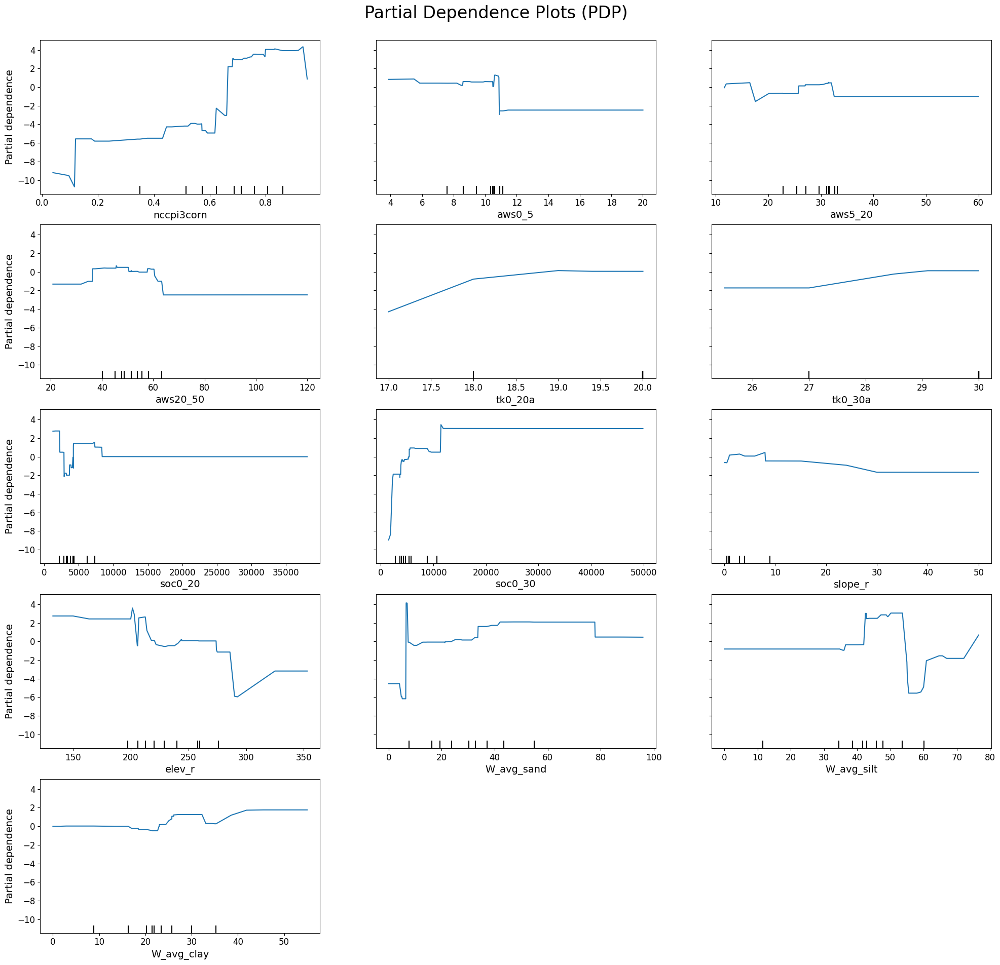

In [ ]:
import pandas as pd
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Assuming df_merged is the merged DataFrame with soil and yield data
X = df_merged[['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay']]
y = df_merged['Value']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a GradientBoostingRegressor
model = GradientBoostingRegressor().fit(X_train, y_train)

# Features for partial dependence plot
features = ['nccpi3corn', 'aws0_5', 'aws5_20', 'aws20_50', 'tk0_20a', 'tk0_30a', 'soc0_20', 'soc0_30', 'slope_r', 'elev_r', 'W_avg_sand', 'W_avg_silt', 'W_avg_clay']

# Create the PDP without passing external axes
# Increase figure size and DPI for better clarity
fig, ax = plt.subplots(figsize=(20, 20), dpi=100)

# Create Partial Dependence Plots
pdp_display = PartialDependenceDisplay.from_estimator(model, X, features=features, ax=ax)

# Adjust font sizes for each subplot
for ax in pdp_display.axes_.flatten():
    if ax is not None:
        ax.set_xlabel(ax.get_xlabel(), fontsize=14)
        ax.set_ylabel(ax.get_ylabel(), fontsize=14)
        ax.tick_params(axis='both', labelsize=12)

# Adjust the title with larger font size and better positioning
plt.suptitle('Partial Dependence Plots (PDP)', fontsize=24, y=.95)

# Use tight_layout to avoid overlap and add space for the title
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Show the plot
plt.show()


## from 2001 -2023  weather data

In [ ]:
import os
import pandas as pd

# Define the folder path where the CSV files are stored
folder_path = '/content/drive/MyDrive/yield_classification/weather_2001-2023_all'  # Replace with your actual folder path

# List all CSV files in the folder
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Initialize an empty list to store DataFrames
dataframes = []

# Loop through each CSV file, load it, rename the 'mean' column, and store the DataFrame
for file in csv_files:
    file_path = os.path.join(folder_path, file)

    # Load the file into a DataFrame
    df = pd.read_csv(file_path)

    # Rename the 'mean' column to the file name (without the extension)
    file_name = os.path.splitext(file)[0]  # Get the file name without extension
    df = df.rename(columns={'mean': file_name})

    # Append the modified DataFrame to the list
    dataframes.append(df)

# Merge all DataFrames on 'county' and 'date' (inner join to retain common county-date pairs)
merged_df = pd.DataFrame()

for i, df in enumerate(dataframes):
    if i == 0:
        merged_df = df
    else:
        merged_df = pd.merge(merged_df, df, on=['county', 'Date'], how='inner')

# Save the merged DataFrame to a new CSV file
merged_df.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/merged_weather_data.csv', index=False)


In [ ]:
# Convert 'date' column to datetime format
merged_df['Date'] = pd.to_datetime(merged_df['Date'], errors='coerce')

# Drop rows where the year is 2024
merged_df = merged_df[merged_df['Date'].dt.year != 2024]

# Save the filtered DataFrame to a new CSV file

merged_df

,Date,county,mergedmax_temp,mergedmean_temp,mergedmin_temp,merged_precip
0,2001-01-01,ADAMS,29.0,19.5,10.0,0.000000
1,2001-01-02,ADAMS,24.0,17.0,10.0,0.010000
2,2001-01-03,ADAMS,24.0,15.5,7.0,0.000000
3,2001-01-04,ADAMS,29.0,24.5,20.0,0.005000
4,2001-01-05,ADAMS,35.0,30.5,26.0,0.000000
...,...,...,...,...,...,...
627632,2023-12-27,WHITLEY,46.0,39.0,32.0,0.162000
627633,2023-12-28,WHITLEY,40.0,36.5,33.0,0.111429
627634,2023-12-29,WHITLEY,37.0,34.0,31.0,0.137143
627635,2023-12-30,WHITLEY,36.0,34.0,32.0,0.061429


In [ ]:
merged_df['Date'] = pd.to_datetime(merged_df['Date'], errors='coerce')
# Ensure 'year' is extracted from the 'Date' column if not already done
merged_df['year'] = pd.to_datetime(merged_df['Date']).dt.year

# Group by 'year' and 'county' and check for each variable if all values are NaN
nan_per_variable_df = merged_df.groupby(['year', 'county']).apply(lambda x: x.isna().all())

# Filter rows where all the variables for a county-year pair are NaN
nan_per_variable_df = nan_per_variable_df[nan_per_variable_df.any(axis=1)]

# Reset the index to make it a proper DataFrame





In [ ]:
merged_df

,Date,county,mergedmin_temp,merged_precip,mergedmax_temp,mergedmean_temp,year
0,2001-01-01,ADAMS,10.0,0.000000,29.0,19.5,2001
1,2001-01-02,ADAMS,10.0,0.010000,24.0,17.0,2001
2,2001-01-03,ADAMS,7.0,0.000000,24.0,15.5,2001
3,2001-01-04,ADAMS,20.0,0.005000,29.0,24.5,2001
4,2001-01-05,ADAMS,26.0,0.000000,35.0,30.5,2001
...,...,...,...,...,...,...,...
627632,2023-12-27,WHITLEY,32.0,0.162000,46.0,39.0,2023
627633,2023-12-28,WHITLEY,33.0,0.111429,40.0,36.5,2023
627634,2023-12-29,WHITLEY,31.0,0.137143,37.0,34.0,2023
627635,2023-12-30,WHITLEY,32.0,0.061429,36.0,34.0,2023


In [ ]:
# Step 1: Convert 'Date' to datetime and extract 'year' if not done yet
merged_df['Date'] = pd.to_datetime(merged_df['Date'], errors='coerce')
merged_df['year'] = merged_df['Date'].dt.year

# Step 2: Group by 'year' and 'county' and check if all data for any variable is NaN (for all days in a year)
nan_years_per_county = merged_df.groupby(['year', 'county']).apply(lambda group: group.isna().all().any())

# Step 3: Filter out the rows where all data for any variable is NaN for the entire year of the county
nan_years_per_county_filtered = nan_years_per_county[nan_years_per_county]

# Step 4: Create a set of (year, county) tuples to remove
nan_tuples_to_remove = set(nan_years_per_county_filtered.index)

# Step 5: Remove the rows from the original DataFrame that match the year-county combinations with all NaN data
merged_df_cleaned = merged_df[~merged_df.set_index(['year', 'county']).index.isin(nan_tuples_to_remove)]

# Optional: Save the cleaned DataFrame to a new CSV file
output_cleaned_file_path = '/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/weather_all_clean'
merged_df_cleaned.to_csv(output_cleaned_file_path, index=False)

# Display the cleaned DataFrame path




In [ ]:
merged_df_cleaned.isna().sum()

,0
Date,0
county,0
mergedmax_temp,26326
mergedmean_temp,29763
mergedmin_temp,28596
merged_precip,13166
year,0


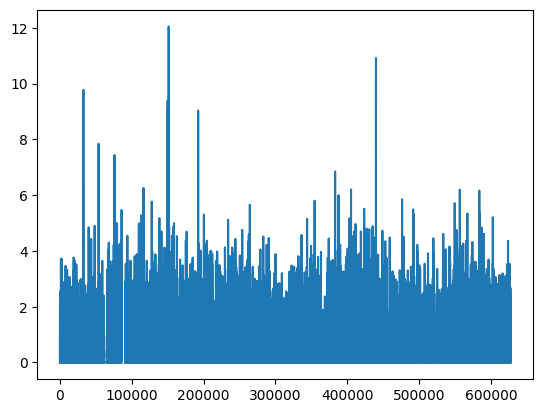

In [ ]:
plt.plot(merged_df_cleaned['merged_precip'])

In [ ]:
# Ensure the data is sorted by county and Date for proper time series analysis
merged_df_cleaned = merged_df_cleaned.sort_values(by=['county', 'Date'])

# Initialize an empty list to store results for counties with more than 100 consecutive NaN values
results = []

# Function to find consecutive missing data in a series
def find_consecutive_nans(series, threshold=round(365/5)):
    count = 0
    has_threshold = False

    for is_nan in series.isna():
        if is_nan:
            count += 1
        else:
            if count >= threshold:
                has_threshold = True
            count = 0

    # Check for a trailing NaN series
    if count >= threshold:
        has_threshold = True

    return has_threshold

# Group by county and year and apply the function for each variable
for (county, year), group in merged_df_cleaned.groupby(['county', 'year']):
    for col in ['mergedmin_temp', 'mergedmax_temp', 'merged_precip', 'mergedmean_temp']:
        has_consecutive_nans = find_consecutive_nans(group[col])
        if has_consecutive_nans:
            results.append({'county': county, 'year': year, 'variable': 'merged_precip', 'consecutive_nan_days': round(365/5)})

# Convert the results to a DataFrame for better visualization
results_df = pd.DataFrame(results)

# Display the results
results_df


,county,year,variable,consecutive_nan_days
0,ADAMS,2003,merged_precip,73
1,ADAMS,2003,merged_precip,73
2,ADAMS,2003,merged_precip,73
3,ADAMS,2004,merged_precip,73
4,ADAMS,2004,merged_precip,73
...,...,...,...,...
206,WELLS,2023,merged_precip,73
207,WELLS,2023,merged_precip,73
208,WHITLEY,2008,merged_precip,73
209,WHITLEY,2008,merged_precip,73


In [ ]:
# Ensure the data is sorted by county and Date for proper time series analysis
merged_df_cleaned = merged_df_cleaned.sort_values(by=['county', 'Date'])

# Initialize a list to store the county-year pairs that should be removed
county_years_to_remove = []

# Function to find consecutive missing data in a series
def find_consecutive_nans(series, threshold=30):  # 30 days
    count = 0
    has_threshold = False

    for is_nan in series.isna():
        if is_nan:
            count += 1
        else:
            if count >= threshold:
                has_threshold = True
            count = 0

    # Check for a trailing NaN series
    if count >= threshold:
        has_threshold = True

    return has_threshold

# Group by county and year and apply the function for each variable
for (county, year), group in merged_df_cleaned.groupby(['county', 'year']):
    for col in ['mergedmin_temp', 'mergedmax_temp', 'merged_precip', 'mergedmean_temp']:
        has_consecutive_nans = find_consecutive_nans(group[col])
        if has_consecutive_nans:
            county_years_to_remove.append((county, year))
            break  # Once we know the county-year has 1/5 consecutive NaN, no need to check further

# Remove the rows from the original DataFrame that match the county-year combinations with 1/5th consecutive NaN data
merged_df_cleaned = merged_df_cleaned[~merged_df_cleaned.set_index(['county', 'year']).index.isin(county_years_to_remove)]

# Correct the county names in the cleaned dataset

# Dictionary to map incorrect county names to the correct ones
corrections = {
    'SAINT': 'ST JOSEPH',
    'LAPORTE': 'LA PORTE'
}

# Apply the corrections to the 'county' column
merged_df_cleaned['county'] = merged_df_cleaned['county'].replace(corrections)

# Display the first few rows to confirm the changes



# Save the cleaned DataFrame to a new CSV file
merged_df_cleaned.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/cleaned_after_1_5th_consecutive_missing_removal.csv', index=False)

# Display a message confirming the operation is done

merged_df_cleaned

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Date,county,mergedmax_temp,mergedmean_temp,mergedmin_temp,merged_precip,year
0,2001-01-01,ADAMS,29.0,19.5,10.0,0.000000,2001
1,2001-01-02,ADAMS,24.0,17.0,10.0,0.010000,2001
2,2001-01-03,ADAMS,24.0,15.5,7.0,0.000000,2001
3,2001-01-04,ADAMS,29.0,24.5,20.0,0.005000,2001
4,2001-01-05,ADAMS,35.0,30.5,26.0,0.000000,2001
...,...,...,...,...,...,...,...
627632,2023-12-27,WHITLEY,46.0,39.0,32.0,0.162000,2023
627633,2023-12-28,WHITLEY,40.0,36.5,33.0,0.111429,2023
627634,2023-12-29,WHITLEY,37.0,34.0,31.0,0.137143,2023
627635,2023-12-30,WHITLEY,36.0,34.0,32.0,0.061429,2023


In [ ]:
# Count the unique county-year pairs in the main dataset
unique_county_year_pairs = merged_df_cleaned.groupby(['county', 'year']).ngroups

# Print the result
print(f"Total number of unique county-year pairs in the dataset: {unique_county_year_pairs}")


Total number of unique county-year pairs in the dataset: 1458


In [ ]:
# Calculate the percentage of missing data for each variable in the cleaned dataset
missing_percentage = merged_df_cleaned.isna().mean() * 100

# Display the result as a DataFrame for better visualization
missing_percentage_df = pd.DataFrame(missing_percentage, columns=['Percentage Missing'])

# Display the DataFrame with the percentage of missing data for each variable
print(missing_percentage_df)
print(len(merged_df_cleaned))

                 Percentage Missing
Date                       0.000000
county                     0.000000
mergedmax_temp             1.671242
mergedmean_temp            2.237976
mergedmin_temp             2.051494
merged_precip              1.592575
year                       0.000000
535171


In [ ]:
# Load the county shapefile using GeoPandas
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"  # Update with the correct path to your shapefile
gdf = gpd.read_file(shapefile_path)



# Ensure that the county names are in the same format in both datasets
gdf['county'] = gdf['NAME_U'].str.upper()  # Assuming 'NAME_U' is the county name column in the shapefile
gdf = gdf[['county', 'geometry']]  # Keep only relevant columns

# Convert to correct CRS for lat-lon (EPSG:4326)
gdf = gdf.to_crs(epsg=4326)

# Merge the weather DataFrame with the GeoDataFrame on the 'county' column
working_df_1 = pd.merge(merged_df_cleaned, gdf, on='county', how='left')

# The 'geometry' column now contains the boundary information for each county
print(working_df_1.head())

# Check if there are any counties without boundary information
missing_boundaries = working_df_1[working_df_1['geometry'].isna()]
if not missing_boundaries.empty:
    print("\nCounties with missing boundary information:")
    print(missing_boundaries['county'].unique())

# Correct way to extract centroids
# First, convert the 'geometry' column to a GeoSeries to ensure proper handling of geometries
geo_series = gpd.GeoSeries(working_df_1['geometry'])

# Extract the centroids from the polygons
working_df_1['centroid_lat'] = geo_series.centroid.y
working_df_1['centroid_lon'] = geo_series.centroid.x

# Display the first few rows to check the results
print(working_df_1[['county', 'centroid_lat', 'centroid_lon']].head())


        Date county  mergedmax_temp  mergedmean_temp  mergedmin_temp  \
0 2001-01-01  ADAMS            29.0             19.5            10.0   
1 2001-01-02  ADAMS            24.0             17.0            10.0   
2 2001-01-03  ADAMS            24.0             15.5             7.0   
3 2001-01-04  ADAMS            29.0             24.5            20.0   
4 2001-01-05  ADAMS            35.0             30.5            26.0   

   merged_precip  year                                           geometry  
0          0.000  2001  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
1          0.010  2001  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
2          0.000  2001  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
3          0.005  2001  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
4          0.000  2001  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  


  county  centroid_lat  centroid_lon
0  ADAMS     40.745716     -84.93661
1  ADAMS     40.745716     -84.93661
2  ADAMS     40.745716     -84.93661
3  ADAMS     40.745716     -84.93661
4  ADAMS     40.745716     -84.93661


In [ ]:
working_df_1

,Date,county,mergedmax_temp,mergedmean_temp,mergedmin_temp,merged_precip,year,geometry,centroid_lat,centroid_lon
0,2001-01-01,ADAMS,29.0,19.5,10.0,0.000000,2001,"POLYGON ((-84.80435 40.92249, -84.80293 40.922...",40.745716,-84.936610
1,2001-01-02,ADAMS,24.0,17.0,10.0,0.010000,2001,"POLYGON ((-84.80435 40.92249, -84.80293 40.922...",40.745716,-84.936610
2,2001-01-03,ADAMS,24.0,15.5,7.0,0.000000,2001,"POLYGON ((-84.80435 40.92249, -84.80293 40.922...",40.745716,-84.936610
3,2001-01-04,ADAMS,29.0,24.5,20.0,0.005000,2001,"POLYGON ((-84.80435 40.92249, -84.80293 40.922...",40.745716,-84.936610
4,2001-01-05,ADAMS,35.0,30.5,26.0,0.000000,2001,"POLYGON ((-84.80435 40.92249, -84.80293 40.922...",40.745716,-84.936610
...,...,...,...,...,...,...,...,...,...,...
535166,2023-12-27,WHITLEY,46.0,39.0,32.0,0.162000,2023,"POLYGON ((-85.53624 41.2952, -85.53673 41.2809...",41.139461,-85.505121
535167,2023-12-28,WHITLEY,40.0,36.5,33.0,0.111429,2023,"POLYGON ((-85.53624 41.2952, -85.53673 41.2809...",41.139461,-85.505121
535168,2023-12-29,WHITLEY,37.0,34.0,31.0,0.137143,2023,"POLYGON ((-85.53624 41.2952, -85.53673 41.2809...",41.139461,-85.505121
535169,2023-12-30,WHITLEY,36.0,34.0,32.0,0.061429,2023,"POLYGON ((-85.53624 41.2952, -85.53673 41.2809...",41.139461,-85.505121


In [ ]:
print(gdf.county.unique())

['STEUBEN' 'LAGRANGE' 'ELKHART' 'ST JOSEPH' 'LAKE' 'PORTER' 'LA PORTE'
 'DE KALB' 'NOBLE' 'MARSHALL' 'KOSCIUSKO' 'STARKE' 'WHITLEY' 'ALLEN'
 'JASPER' 'NEWTON' 'FULTON' 'PULASKI' 'WABASH' 'HUNTINGTON' 'MIAMI'
 'ADAMS' 'WELLS' 'WHITE' 'CASS' 'BENTON' 'CARROLL' 'GRANT' 'JAY'
 'BLACKFORD' 'HOWARD' 'TIPPECANOE' 'WARREN' 'CLINTON' 'TIPTON' 'DELAWARE'
 'MADISON' 'FOUNTAIN' 'RANDOLPH' 'HAMILTON' 'MONTGOMERY' 'BOONE'
 'VERMILLION' 'HENRY' 'WAYNE' 'HANCOCK' 'PARKE' 'MARION' 'HENDRICKS'
 'PUTNAM' 'FAYETTE' 'RUSH' 'UNION' 'SHELBY' 'JOHNSON' 'MORGAN' 'VIGO'
 'CLAY' 'FRANKLIN' 'OWEN' 'DECATUR' 'BARTHOLOMEW' 'MONROE' 'BROWN'
 'RIPLEY' 'DEARBORN' 'SULLIVAN' 'JENNINGS' 'GREENE' 'JACKSON' 'OHIO'
 'LAWRENCE' 'SWITZERLAND' 'JEFFERSON' 'KNOX' 'MARTIN' 'DAVIESS' 'SCOTT'
 'WASHINGTON' 'ORANGE' 'CLARK' 'PIKE' 'GIBSON' 'DUBOIS' 'CRAWFORD'
 'HARRISON' 'FLOYD' 'PERRY' 'WARRICK' 'POSEY' 'SPENCER' 'VANDERBURGH']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


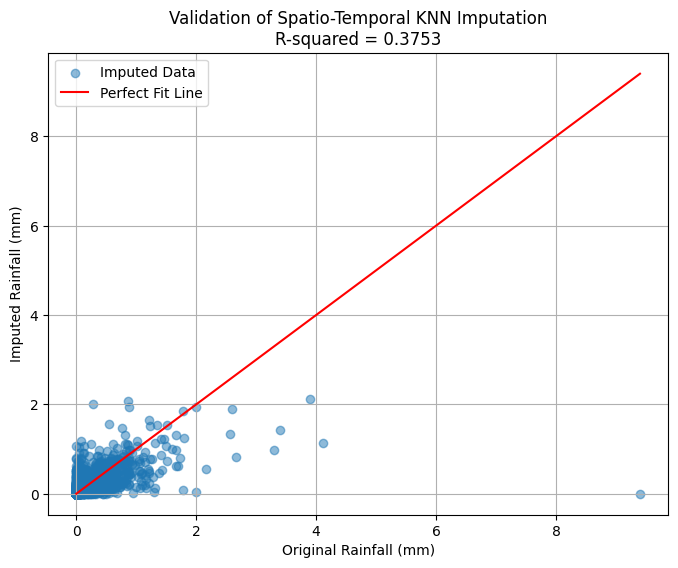

R-squared value: 0.3753
time is :   0:27:54.724820


In [ ]:
import numpy as np
import pandas as pd
import joblib  # For parallel processing
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics.pairwise import haversine_distances
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from datetime import datetime

a = datetime.now()
# Step 1: Prepare features for KNN (Spatial and Temporal)
def prepare_features(df):
    # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
    df['date_numeric'] = pd.to_datetime(df['Date']).map(lambda d: (d - datetime(1970, 1, 1)).days)

    # Combine spatial (longitude, latitude) and temporal (date_numeric) aspects into feature matrix
    X = df[['centroid_lon', 'centroid_lat', 'date_numeric']].values
    return X

# Step 2: Custom distance function for spatio-temporal KNN
def custom_spatio_temporal_distance(X1, X2):
    spatial_distance = haversine_distances([X1[:2]], [X2[:2]])[0][0]  # Haversine for spatial distance
    temporal_distance = abs(X1[2] - X2[2])  # Absolute difference in time
    return spatial_distance + temporal_distance

# Step 3: Parallel KNN Imputation function using joblib
def knn_spatio_temporal(X_train, y_train):
    knn = KNeighborsRegressor(n_neighbors=5, metric=custom_spatio_temporal_distance, n_jobs=-1)  # Enable parallelism
    knn.fit(X_train, y_train)
    return knn

# Ensure validation set has no NaN values
original_non_nan_df = working_df.dropna(subset=['merged_precip'])

# Step 1: Randomly select 2500 rows with non-NaN values for validation
validation_set = original_non_nan_df.sample(n=2500, random_state=42)

# Step 2: Set these 2500 rows as missing in the working_df to test imputation
working_df.loc[validation_set.index, 'merged_precip'] = np.nan

# Prepare features for training and validation
X_train = prepare_features(working_df.dropna(subset=['merged_precip']))
y_train = working_df.dropna(subset=['merged_precip'])['merged_precip'].values

# Prepare test features for the validation set
X_test_validation = prepare_features(validation_set)

# Train the KNN model and predict
knn_model = knn_spatio_temporal(X_train, y_train)
y_test_imputed = knn_model.predict(X_test_validation)

# Step 4: Compare original vs imputed values using R-squared and plot
r_squared = r2_score(validation_set['merged_precip'], y_test_imputed)

# Plotting the comparison
plt.figure(figsize=(8, 6))
plt.scatter(validation_set['merged_precip'], y_test_imputed, alpha=0.5, label='Imputed Data')
plt.plot([0, max(validation_set['merged_precip'])], [0, max(validation_set['merged_precip'])], color='red', label='Perfect Fit Line')

plt.title(f'Validation of Spatio-Temporal KNN Imputation\nR-squared = {r_squared:.4f}')
plt.xlabel('Original Rainfall (mm)')
plt.ylabel('Imputed Rainfall (mm)')
plt.legend()
plt.grid(True)
plt.show()

# Print R-squared for the imputation
print(f"R-squared value: {r_squared:.4f}")
b = datetime.now()
print("time is :   " + str(b - a))

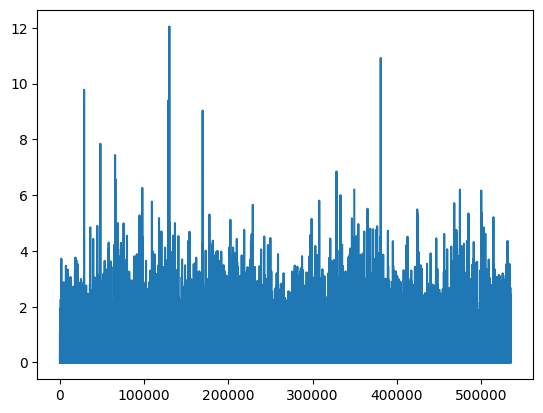

In [ ]:
plt.plot(working_df_1['merged_precip'])

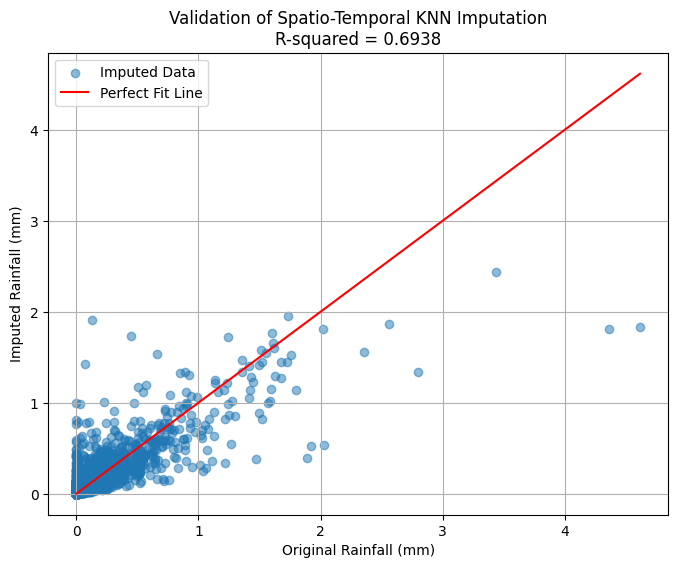

R-squared value: 0.6938


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Step 1: Randomly select 2500 rows with non-NaN values for validation
validation_set = working_df.dropna(subset=['merged_precip']).sample(n=2500, random_state=42)

# Step 2: Set these 2500 rows as missing in the original data to test imputation
working_df.loc[validation_set.index, 'merged_precip'] = np.nan

# Step 3: Re-apply the KNN imputation
X_test_validation = prepare_features(working_df.loc[validation_set.index])
y_test_imputed = knn_model.predict(X_test_validation)

# Step 4: Compare original vs imputed values using R-squared and plot
r_squared = r2_score(validation_set['merged_precip'], y_test_imputed)

plt.figure(figsize=(8, 6))
plt.scatter(validation_set['merged_precip'], y_test_imputed, alpha=0.5, label='Imputed Data')
plt.plot([0, max(validation_set['merged_precip'])], [0, max(validation_set['merged_precip'])], color='red', label='Perfect Fit Line')

plt.title(f'Validation of Spatio-Temporal KNN Imputation\nR-squared = {r_squared:.4f}')
plt.xlabel('Original Rainfall (mm)')
plt.ylabel('Imputed Rainfall (mm)')
plt.legend()
plt.grid(True)
plt.show()

# Print R-squared for the imputation
print(f"R-squared value: {r_squared:.4f}")

Rows remaining after filtering for dates available in at least 64 counties: 329844


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


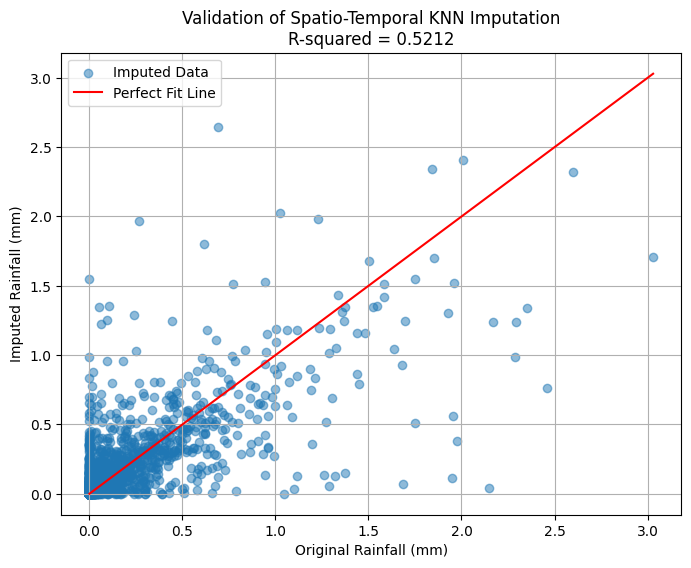

R-squared value: 0.5212
Time taken: 0:17:36.265997


In [ ]:
import numpy as np
import pandas as pd
import joblib  # For parallel processing
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics.pairwise import haversine_distances
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

a = datetime.now()

# Step 1: Remove all NaN values from the dataset
required_columns = ['merged_precip', 'centroid_lon', 'centroid_lat', 'Date', 'county']
working_df = working_df.dropna(subset=required_columns)

# Step 2: Filter to get dates with a significant number of counties
# Find dates that are available in a significant number of counties (e.g., at least 80% of total counties)
grouped = working_df.groupby(['Date'])
common_dates = grouped['county'].nunique()
total_counties = working_df['county'].nunique()

# Set threshold as 80% of total counties
threshold = int(total_counties * 0.8)
valid_dates = common_dates[common_dates >= threshold].index
working_df_filtered = working_df[working_df['Date'].isin(valid_dates)]

# Debug: Print number of rows remaining after filtering significant dates across counties
print(f"Rows remaining after filtering for dates available in at least {threshold} counties: {working_df_filtered.shape[0]}")

# Step 3: Randomly select 2500 rows with non-NaN values for validation, ensuring county-date consistency
if len(working_df_filtered) < 2500:
    print("Not enough valid data to sample 2500 rows. Consider reducing the sample size.")
else:
    validation_set = working_df_filtered.sample(n=2500, random_state=42)

    # Step 4: Set these 2500 rows as missing in the original data to test imputation
    working_df_filtered.loc[validation_set.index, 'merged_precip'] = np.nan

    # Step 5: Prepare features for training and validation
    def prepare_features(df):
        # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
        df['date_numeric'] = pd.to_datetime(df['Date']).map(lambda d: (d - datetime(1970, 1, 1)).days)

        # Combine spatial (longitude, latitude) and temporal (date_numeric) aspects into feature matrix
        X = df[['centroid_lon', 'centroid_lat', 'date_numeric']].values
        return X

    # Prepare features for training
    X_train = prepare_features(working_df_filtered.dropna(subset=['merged_precip']))
    y_train = working_df_filtered.dropna(subset=['merged_precip'])['merged_precip'].values

    # Prepare test features for the validation set
    X_test_validation = prepare_features(validation_set)

    # Step 6: Custom distance function for spatio-temporal KNN
    def custom_spatio_temporal_distance(X1, X2):
        spatial_distance = haversine_distances([X1[:2]], [X2[:2]])[0][0]  # Haversine for spatial distance
        temporal_distance = abs(X1[2] - X2[2])  # Absolute difference in time
        return spatial_distance + temporal_distance

    # Step 7: Parallel KNN Imputation function using joblib
    def knn_spatio_temporal(X_train, y_train):
        knn = KNeighborsRegressor(n_neighbors=5, metric=custom_spatio_temporal_distance, n_jobs=-1)  # Enable parallelism
        knn.fit(X_train, y_train)
        return knn

    # Train the KNN model and predict
    knn_model = knn_spatio_temporal(X_train, y_train)
    y_test_imputed = knn_model.predict(X_test_validation)

    # Step 8: Compare original vs imputed values using R-squared and plot
    r_squared = r2_score(validation_set['merged_precip'], y_test_imputed)

    # Plotting the comparison
    plt.figure(figsize=(8, 6))
    plt.scatter(validation_set['merged_precip'], y_test_imputed, alpha=0.5, label='Imputed Data')
    plt.plot([0, max(validation_set['merged_precip'])], [0, max(validation_set['merged_precip'])], color='red', label='Perfect Fit Line')

    plt.title(f'Validation of Spatio-Temporal KNN Imputation\nR-squared = {r_squared:.4f}')
    plt.xlabel('Original Rainfall (mm)')
    plt.ylabel('Imputed Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print R-squared for the imputation
    print(f"R-squared value: {r_squared:.4f}")

b = datetime.now()
print("Time taken: " + str(b - a))


In [ ]:
# Add a constant to the model for statsmodels OLS regression (for R-squared calculation)
import statsmodels.api as sm
X = sm.add_constant(validation_set['merged_precip'])  # Adding constant term to calculate intercept

    # Fit the model using Ordinary Least Squares (OLS)
model = sm.OLS(validation_set['merged_precip'], y_test_imputed).fit()

    # Get the R-squared value from statsmodels
r_squared_statsmodels = model.rsquared
print(f"R-squared value (statsmodels): {r_squared_statsmodels:.4f}")

R-squared value (statsmodels): 0.6113


In [ ]:
working_df_1.isna().sum()

,0
Date,0
county,0
mergedmin_temp,10979
merged_precip,8523
mergedmax_temp,8944
mergedmean_temp,11977
year,0
geometry,0
centroid_lat,0
centroid_lon,0


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


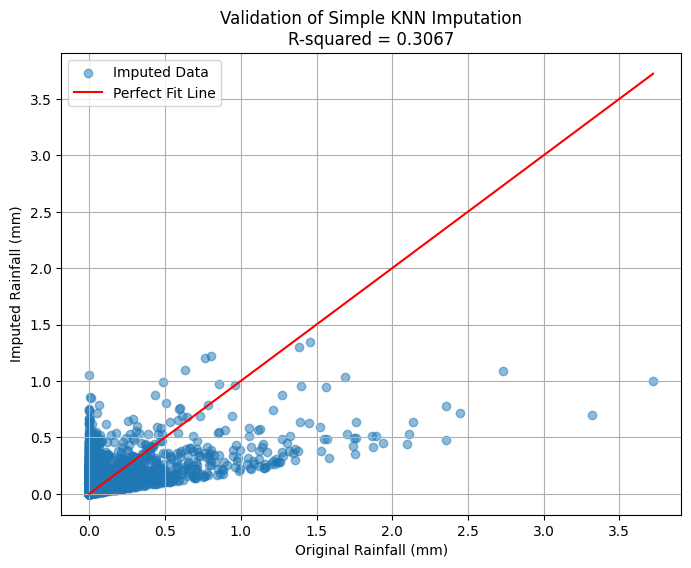

R-squared value: 0.3067
Time taken: 0:00:04.157773


In [ ]:
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from datetime import datetime

# Start timer
a = datetime.now()

# Step 1: Keep a copy of the original dataset with missing values
working_df_with_missing = working_df_1

# Step 2: Remove all NaN values from the dataset for training
required_columns = ['merged_precip', 'centroid_lon', 'centroid_lat', 'Date']
working_df_non_missing = working_df_1.dropna(subset=required_columns)

# Step 3: Prepare features for training
def prepare_features(df):
    # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
    df['date_numeric'] = pd.to_datetime(df['Date']).map(lambda d: (d - datetime(1970, 1, 1)).days)

    # Combine spatial (longitude, latitude) and temporal (date_numeric) aspects into feature matrix
    X = df[['centroid_lon', 'centroid_lat', 'date_numeric']].values
    return X

# Prepare features for the training set
X_train = prepare_features(working_df_non_missing)
y_train = working_df_non_missing['merged_precip'].values

# Step 4: Standardize the features for training
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Step 5: Train the KNN model with Euclidean distance
knn_model = KNeighborsRegressor(n_neighbors=5, metric='euclidean', n_jobs=-1)
knn_model.fit(X_train_scaled, y_train)

# Step 6: Impute Missing Values in the Dataset
# Find rows where 'merged_precip' is NaN for imputation
missing_data_indices = working_df_with_missing[working_df_with_missing['merged_precip'].isna()].index

if len(missing_data_indices) == 0:
    print("No missing values found in the dataset for imputation.")
else:
    # Prepare features for rows with missing values
    X_missing = prepare_features(working_df_with_missing.loc[missing_data_indices])

    # Standardize the features for the missing set
    X_missing_scaled = scaler.transform(X_missing)

    # Impute the missing values
    y_missing_imputed = knn_model.predict(X_missing_scaled)

    # Step 7: Fill the missing values in the original DataFrame with imputed values
    working_df_with_missing.loc[missing_data_indices, 'merged_precip'] = y_missing_imputed

    # Step 8: Validate Imputation (using a new validation set)
    # Randomly select 2500 rows with non-NaN values for validation
    validation_set = working_df_with_missing.sample(n=2500, random_state=42)

    # Store original values for validation
    original_values_for_validation = validation_set['merged_precip']

    # Set the 'merged_precip' for these 2500 rows as NaN to simulate missing data for testing imputation accuracy
    working_df_with_missing.loc[validation_set.index, 'merged_precip'] = np.nan

    # Prepare features for these rows
    X_validation = prepare_features(working_df_with_missing.loc[validation_set.index])

    # Standardize the features
    X_validation_scaled = scaler.transform(X_validation)

    # Impute the missing values in the validation set
    y_validation_imputed = knn_model.predict(X_validation_scaled)

    # Calculate R-squared for imputed vs original values
    r_squared = r2_score(original_values_for_validation, y_validation_imputed)

    # Step 9: Restore the original validation data
    working_df_with_missing.loc[validation_set.index, 'merged_precip'] = original_values_for_validation

    # Plotting the comparison of imputed vs original values
    plt.figure(figsize=(8, 6))
    plt.scatter(original_values_for_validation, y_validation_imputed, alpha=0.5, label='Imputed Data')
    plt.plot([0, max(original_values_for_validation)], [0, max(original_values_for_validation)], color='red', label='Perfect Fit Line')

    plt.title(f'Validation of Simple KNN Imputation\nR-squared = {r_squared:.4f}')
    plt.xlabel('Original Rainfall (mm)')
    plt.ylabel('Imputed Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print R-squared for the imputation
    print(f"R-squared value: {r_squared:.4f}")

# Final Imputed Dataset
# working_df_with_missing now contains all data, with missing 'merged_precip' values imputed
b = datetime.now()
print("Time taken: " + str(b - a))


In [ ]:
working_df_with_missing.isna().sum()

,0
Date,0
county,0
mergedmax_temp,8944
mergedmean_temp,11977
mergedmin_temp,10979
merged_precip,0
year,0
geometry,0
centroid_lat,0
centroid_lon,0


In [ ]:
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from datetime import datetime

# Start timer
a = datetime.now()

# Step 1: Keep a copy of the original dataset with missing values


# Step 2: Remove all NaN values from the dataset for training
required_columns = ['merged_precip', 'centroid_lon', 'centroid_lat', 'Date']
working_df_non_missing = working_df_with_missing.dropna(subset=required_columns)

# Step 3: Prepare features for training
def prepare_features(df):
    # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
    df['date_numeric'] = pd.to_datetime(df['Date']).map(lambda d: (d - datetime(1970, 1, 1)).days)

    # Combine spatial (longitude, latitude) and temporal (date_numeric) aspects into feature matrix
    X = df[['centroid_lon', 'centroid_lat', 'date_numeric']].values
    return X

# Prepare features for the training set
X_train = prepare_features(working_df_non_missing)
y_train = working_df_non_missing['merged_precip'].values

# Step 4: Standardize the features for training
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Step 5: Train the KNN model with Euclidean distance
knn_model = KNeighborsRegressor(n_neighbors=5, metric='euclidean', n_jobs=-1)
knn_model.fit(X_train_scaled, y_train)

# Step 6: Impute Missing Values in the Dataset
# Find rows where 'merged_precip' is NaN for imputation
missing_data_indices = working_df_with_missing[working_df_with_missing['merged_precip'].isna()].index

if len(missing_data_indices) == 0:
    print("No missing values found in the dataset for imputation.")
else:
    # Prepare features for rows with missing values
    X_missing = prepare_features(working_df_with_missing.loc[missing_data_indices])

    # Standardize the features for the missing set
    X_missing_scaled = scaler.transform(X_missing)

    # Impute the missing values
    y_missing_imputed = knn_model.predict(X_missing_scaled)

    # Step 7: Fill the missing values in the original DataFrame with imputed values
    working_df_with_missing.loc[missing_data_indices, 'merged_precip'] = y_missing_imputed

    # Step 8: Validate Imputation (using a new validation set)
    # Randomly select 2500 rows with non-NaN values for validation
    validation_set = working_df_with_missing.sample(n=2500, random_state=42)

    # Store original values for validation
    original_values_for_validation = validation_set['merged_precip']

    # Set the 'merged_precip' for these 2500 rows as NaN to simulate missing data for testing imputation accuracy
    working_df_with_missing.loc[validation_set.index, 'merged_precip'] = np.nan

    # Prepare features for these rows
    X_validation = prepare_features(working_df_with_missing.loc[validation_set.index])

    # Standardize the features
    X_validation_scaled = scaler.transform(X_validation)

    # Impute the missing values in the validation set
    y_validation_imputed = knn_model.predict(X_validation_scaled)

    # Calculate R-squared for imputed vs original values
    r_squared = r2_score(original_values_for_validation, y_validation_imputed)

    # Step 9: Restore the original validation data
    working_df_with_missing.loc[validation_set.index, 'merged_precip'] = original_values_for_validation

    # Plotting the comparison of imputed vs original values
    plt.figure(figsize=(8, 6))
    plt.scatter(original_values_for_validation, y_validation_imputed, alpha=0.5, label='Imputed Data')
    plt.plot([0, max(original_values_for_validation)], [0, max(original_values_for_validation)], color='red', label='Perfect Fit Line')

    plt.title(f'Validation of Simple KNN Imputation\nR-squared = {r_squared:.4f}')
    plt.xlabel('Original Rainfall (mm)')
    plt.ylabel('Imputed Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print R-squared for the imputation
    print(f"R-squared value: {r_squared:.4f}")

# Final Imputed Dataset
# working_df_with_missing now contains all data, with missing 'merged_precip' values imputed
b = datetime.now()
print("Time taken: " + str(b - a))


In [ ]:
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from datetime import datetime
def impute_KNN(col_name):
  # Start timer
  a = datetime.now()

  # Step 1: Keep a copy of the original dataset with missing values


  # Step 2: Remove all NaN values from the dataset for training
  required_columns = [col_name, 'centroid_lon', 'centroid_lat', 'Date']
  working_df_non_missing = working_df_with_missing.dropna(subset=required_columns)

  # Step 3: Prepare features for training
  def prepare_features(df):
      # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
      df['date_numeric'] = pd.to_datetime(df['Date']).map(lambda d: (d - datetime(1970, 1, 1)).days)

      # Combine spatial (longitude, latitude) and temporal (date_numeric) aspects into feature matrix
      X = df[['centroid_lon', 'centroid_lat', 'date_numeric']].values
      return X

  # Prepare features for the training set
  X_train = prepare_features(working_df_non_missing)
  y_train = working_df_non_missing[col_name].values

  # Step 4: Standardize the features for training
  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train)

  # Step 5: Train the KNN model with Euclidean distance
  knn_model = KNeighborsRegressor(n_neighbors=5, metric='euclidean', n_jobs=-1)
  knn_model.fit(X_train_scaled, y_train)

  # Step 6: Impute Missing Values in the Dataset
  # Find rows where 'merged_precip' is NaN for imputation
  missing_data_indices = working_df_with_missing[working_df_with_missing[col_name].isna()].index

  if len(missing_data_indices) == 0:
      print("No missing values found in the dataset for imputation.")
  else:
      # Prepare features for rows with missing values
      X_missing = prepare_features(working_df_with_missing.loc[missing_data_indices])

      # Standardize the features for the missing set
      X_missing_scaled = scaler.transform(X_missing)

      # Impute the missing values
      y_missing_imputed = knn_model.predict(X_missing_scaled)

      # Step 7: Fill the missing values in the original DataFrame with imputed values
      working_df_with_missing.loc[missing_data_indices, col_name] = y_missing_imputed

      # Step 8: Validate Imputation (using a new validation set)
      # Randomly select 2500 rows with non-NaN values for validation
      validation_set = working_df_with_missing.sample(n=2500, random_state=42)

      # Store original values for validation
      original_values_for_validation = validation_set[col_name]

      # Set the 'merged_precip' for these 2500 rows as NaN to simulate missing data for testing imputation accuracy
      working_df_with_missing.loc[validation_set.index, col_name] = np.nan

      # Prepare features for these rows
      X_validation = prepare_features(working_df_with_missing.loc[validation_set.index])

      # Standardize the features
      X_validation_scaled = scaler.transform(X_validation)

      # Impute the missing values in the validation set
      y_validation_imputed = knn_model.predict(X_validation_scaled)

      # Calculate R-squared for imputed vs original values
      r_squared = r2_score(original_values_for_validation, y_validation_imputed)

      # Step 9: Restore the original validation data
      working_df_with_missing.loc[validation_set.index, col_name] = original_values_for_validation

      # Plotting the comparison of imputed vs original values
      plt.figure(figsize=(8, 6))
      plt.scatter(original_values_for_validation, y_validation_imputed, alpha=0.5, label='Imputed Data')
      plt.plot([0, max(original_values_for_validation)], [0, max(original_values_for_validation)], color='red', label='Perfect Fit Line')

      plt.title(f'Validation of Simple KNN Imputation\nR-squared = {r_squared:.4f}')
      plt.xlabel('Original' + col_name +' (mm)')
      plt.ylabel('Imputed ' + col_name +' (mm)')
      plt.legend()
      plt.grid(True)
      plt.show()

      # Print R-squared for the imputation
      print(f"R-squared value: {r_squared:.4f}")

  # Final Imputed Dataset
  # working_df_with_missing now contains all data, with missing 'merged_precip' values imputed
  b = datetime.now()
  print("Time taken: " + str(b - a))
  return working_df_with_missing

In [ ]:
working_df_with_missing= impute_KNN('mergedmin_temp')

No missing values found in the dataset for imputation.
Time taken: 0:00:03.549873


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


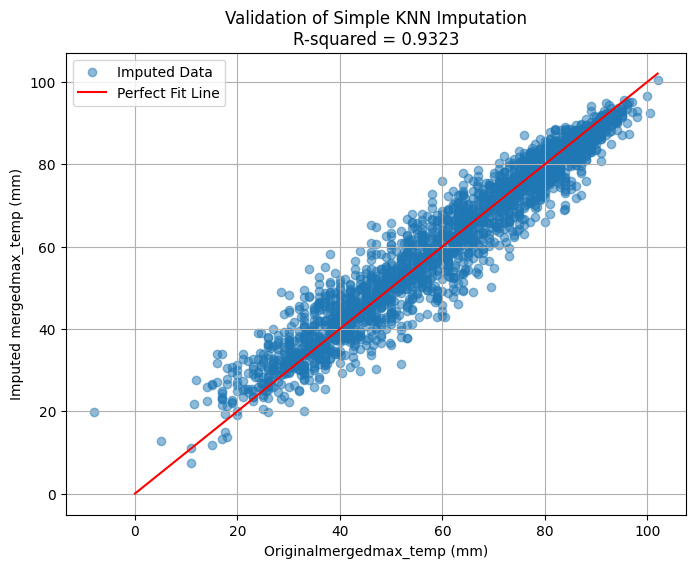

R-squared value: 0.9323
Time taken: 0:00:03.960413


In [ ]:
working_df_with_missing = impute_KNN('mergedmax_temp')

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


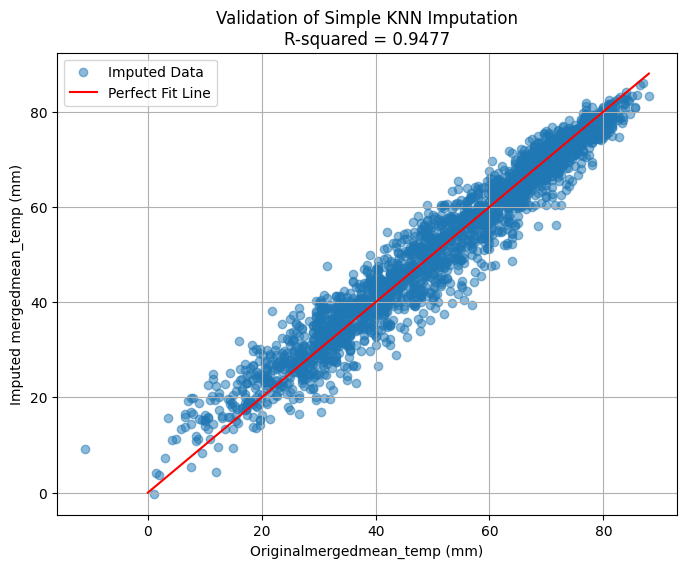

R-squared value: 0.9477
Time taken: 0:00:03.960278


In [ ]:
working_df_with_missing= impute_KNN('mergedmean_temp')

In [ ]:
working_df_with_missing.isna().sum()

,0
Date,0
county,0
mergedmax_temp,0
mergedmean_temp,0
mergedmin_temp,0
merged_precip,0
year,0
geometry,0
centroid_lat,0
centroid_lon,0


In [ ]:
working_df_with_missing = working_df_with_missing[['Date', 'county', 'mergedmax_temp', 'mergedmean_temp', 'mergedmin_temp','merged_precip']]

In [ ]:
working_df_with_missing.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/complete_KNN_dataset.csv', index=False)

In [ ]:
working_df_2 = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/complete_KNN_dataset.csv')

In [ ]:
# Load the county shapefile using GeoPandas
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"  # Update with the correct path to your shapefile
gdf = gpd.read_file(shapefile_path)



# Ensure that the county names are in the same format in both datasets
gdf['county'] = gdf['NAME_U'].str.upper()  # Assuming 'NAME_U' is the county name column in the shapefile
gdf = gdf[['county', 'geometry']]  # Keep only relevant columns

# Convert to correct CRS for lat-lon (EPSG:4326)
gdf = gdf.to_crs(epsg=4326)

# Merge the weather DataFrame with the GeoDataFrame on the 'county' column
working_df_3 = pd.merge(working_df_2, gdf, on='county', how='left')

# The 'geometry' column now contains the boundary information for each county
print(working_df_3.head())

# Check if there are any counties without boundary information
missing_boundaries = working_df_3[working_df_3['geometry'].isna()]
if not missing_boundaries.empty:
    print("\nCounties with missing boundary information:")
    print(missing_boundaries['county'].unique())

# Correct way to extract centroids
# First, convert the 'geometry' column to a GeoSeries to ensure proper handling of geometries
geo_series = gpd.GeoSeries(working_df_3['geometry'])

# Extract the centroids from the polygons
working_df_3['centroid_lat'] = geo_series.centroid.y
working_df_3['centroid_lon'] = geo_series.centroid.x

# Display the first few rows to check the results
print(working_df_3[['county', 'centroid_lat', 'centroid_lon']].head())

         Date county  mergedmax_temp  mergedmean_temp  mergedmin_temp  \
0  2001-01-01  ADAMS            29.0             19.5            10.0   
1  2001-01-02  ADAMS            24.0             17.0            10.0   
2  2001-01-03  ADAMS            24.0             15.5             7.0   
3  2001-01-04  ADAMS            29.0             24.5            20.0   
4  2001-01-05  ADAMS            35.0             30.5            26.0   

   merged_precip                                           geometry  
0          0.000  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
1          0.010  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
2          0.000  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
3          0.005  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  
4          0.000  POLYGON ((-84.80435 40.92249, -84.80293 40.922...  


  county  centroid_lat  centroid_lon
0  ADAMS     40.745716     -84.93661
1  ADAMS     40.745716     -84.93661
2  ADAMS     40.745716     -84.93661
3  ADAMS     40.745716     -84.93661
4  ADAMS     40.745716     -84.93661


In [ ]:
meantemp = working_df_3['mergedmean_temp'].groupby(working_df_3['Date']).mean()
meantemp

,mergedmean_temp
Date,
2001-01-01,20.456393
2001-01-02,14.715068
2001-01-03,12.105479
2001-01-04,19.320776
2001-01-05,29.175457
...,...
2023-12-27,38.706863
2023-12-28,37.757353
2023-12-29,36.075163


Error in callback <function flush_figures at 0x7b00a2a9b520> (for post_execute):


KeyboardInterrupt: 

In [ ]:
# Step 1: Identify where 'mergedmin_temp' is greater than 'mergedmax_temp'
# Step 1: Identify where 'mergedmin_temp' is greater than 'mergedmax_temp'
condition = working_df_3['mergedmin_temp'] > working_df_3['mergedmax_temp']

# Step 2: Print rows that meet the condition
if condition.any():
    # Print the rows where 'mergedmin_temp' > 'mergedmax_temp'
    print("Rows where 'mergedmin_temp' is greater than 'mergedmax_temp':")
    a = working_df_3[condition]
else:
    print("No rows found where 'mergedmin_temp' is greater than 'mergedmax_temp'.")
a

Rows where 'mergedmin_temp' is greater than 'mergedmax_temp':


,Date,county,mergedmax_temp,mergedmean_temp,mergedmin_temp,merged_precip,geometry,centroid_lat,centroid_lon
18412,2015-06-02,BARTHOLOMEW,59.0,70.50,59.4,0.096000,"POLYGON ((-85.7035 39.35006, -85.68446 39.3500...",39.206010,-85.897596
23325,2008-11-14,BENTON,43.0,36.70,44.0,0.130000,"POLYGON ((-87.51057 40.73699, -87.49151 40.737...",40.606305,-87.310897
28097,2012-12-08,BLACKFORD,43.0,36.90,44.0,0.414000,"POLYGON ((-85.2026 40.56731, -85.20106 40.5673...",40.473588,-85.324762
45353,2006-03-09,CARROLL,49.8,46.90,50.0,0.635000,"POLYGON ((-86.74787 40.73755, -86.7357 40.7375...",40.582839,-86.563434
68111,2013-01-25,CRAWFORD,25.0,39.90,31.4,0.005000,"POLYGON ((-86.29 38.423, -86.27154 38.42292, -...",38.292408,-86.451758
68446,2013-12-26,CRAWFORD,37.0,39.40,37.8,0.000000,"POLYGON ((-86.29 38.423, -86.27154 38.42292, -...",38.292408,-86.451758
69879,2006-11-29,DAVIESS,58.2,46.90,59.0,0.006667,"POLYGON ((-87.09159 38.90389, -87.09139 38.903...",38.702495,-87.072062
118374,2018-09-10,FRANKLIN,62.0,76.30,64.8,0.100000,"POLYGON ((-84.83435 39.52309, -84.81543 39.522...",39.414905,-85.060292
142266,2019-02-09,GRANT,15.0,34.30,28.6,0.000000,"POLYGON ((-85.46801 40.65369, -85.44904 40.653...",40.515856,-85.654692
142293,2019-03-08,GRANT,30.0,42.20,31.4,0.000000,"POLYGON ((-85.46801 40.65369, -85.44904 40.653...",40.515856,-85.654692


In [ ]:
# Step 1: Identify where 'mergedmin_temp' is greater than 'mergedmax_temp' in working_df_2
condition = working_df_3['mergedmin_temp'] > working_df_3['mergedmax_temp']

# Step 2: Swap 'mergedmin_temp' and 'mergedmax_temp' in working_df_3 for rows that meet the condition
if condition.any():
    # Extract the rows from working_df_3 that meet the condition
    rows_to_swap = working_df_3.loc[condition].copy()

    # Swap the values of 'mergedmin_temp' and 'mergedmax_temp' for those rows
    temp = rows_to_swap['mergedmin_temp'].copy()
    working_df_3.loc[condition, 'mergedmin_temp'] = rows_to_swap['mergedmax_temp']
    working_df_3.loc[condition, 'mergedmax_temp'] = temp

    # Print out confirmation and some examples
    print(f"Number of rows where 'mergedmin_temp' > 'mergedmax_temp' and were swapped: {condition.sum()}")
    print("\nExamples of swapped rows in working_df_3:")
    print(working_df_3.loc[condition, ['Date', 'mergedmin_temp', 'mergedmax_temp']].head())
else:
    print("No rows found where 'mergedmin_temp' is greater than 'mergedmax_temp'.")



Number of rows where 'mergedmin_temp' > 'mergedmax_temp' and were swapped: 42

Examples of swapped rows in working_df_3:
             Date  mergedmin_temp  mergedmax_temp
18412  2015-06-02            59.0            59.4
23325  2008-11-14            43.0            44.0
28097  2012-12-08            43.0            44.0
45353  2006-03-09            49.8            50.0
68111  2013-01-25            25.0            31.4


In [ ]:
condition = working_df_3['mergedmin_temp'] > working_df_3['mergedmax_temp']
a =0
# Step 2: Swap 'mergedmin_temp' and 'mergedmax_temp' in working_df_3 for rows that meet the condition
if condition.any():
    # Extract the rows from working_df_3 that meet the condition
    a += condition.sum()
print (a)

0


In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# Step 1: Identify rows where 'mergedmin_temp' > 'mean' or 'mergedmax_temp' < 'mean'
condition_min_greater_mean = working_df_3['mergedmin_temp'] > working_df_3['mergedmean_temp']
condition_max_less_mean = working_df_3['mergedmax_temp'] < working_df_3['mergedmean_temp']

# Combine these conditions to identify rows where logical inconsistency exists
condition_inconsistent = condition_min_greater_mean | condition_max_less_mean

# Step 2: Mark these inconsistent values as NaN for imputation
working_df_3.loc[condition_min_greater_mean, 'mergedmin_temp'] = np.nan
working_df_3.loc[condition_max_less_mean, 'mergedmax_temp'] = np.nan
working_df_3.loc[condition_inconsistent, 'mergedmean_temp'] = np.nan

# Step 3: Prepare features for KNN Imputation
def prepare_features_for_knn(df):
    # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
    df['date_numeric'] = pd.to_datetime(df['Date']).map(lambda d: (d - pd.Timestamp('1970-01-01')).days)
    # Combine spatial (longitude, latitude), temporal, and temperature aspects into a feature matrix
    X = df[['centroid_lon', 'centroid_lat', 'date_numeric', 'mergedmin_temp', 'mergedmax_temp', 'mergedmean_temp']].values
    return X

# Prepare features
features = prepare_features_for_knn(working_df_3)

# Step 4: Handle NaN values in the feature matrix using KNNImputer
# Use KNNImputer to handle missing values in features
knn_imputer = KNNImputer(n_neighbors=5)
features_imputed = knn_imputer.fit_transform(features)

# Step 5: Standardize the features (except for the target columns, 'mergedmin_temp', 'mergedmax_temp', 'mean')
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_imputed)

# Step 6: Set up the KNN Regressor for Imputation
# Use KNeighborsRegressor from sklearn to fill NaNs in 'mergedmin_temp', 'mergedmax_temp', and 'mean'
knn_model = KNeighborsRegressor(n_neighbors=5, metric='euclidean', n_jobs=-1)

# Perform KNN Imputation separately for each variable that needs imputation
for column in ['mergedmin_temp', 'mergedmax_temp', 'mergedmean_temp']:
    # Define target for the current column
    y = working_df_3[column].values
    # Get the rows that need to be imputed
    missing_indices = working_df_3[working_df_3[column].isna()].index

    # Prepare training data: rows without missing values
    not_missing_indices = working_df_3[~working_df_3[column].isna()].index
    X_train = features_scaled[not_missing_indices]
    y_train = y[not_missing_indices]

    # Fit the KNN model
    knn_model.fit(X_train, y_train)

    # Impute the missing values
    X_missing = features_scaled[missing_indices]
    y_imputed = knn_model.predict(X_missing)

    # Fill in the imputed values
    working_df_3.loc[missing_indices, column] = y_imputed

# Print out the DataFrame to see the results
print("\nData after KNN Imputation for inconsistent min, max, mean values:")
print(working_df_3[['Date', 'mergedmin_temp', 'mergedmax_temp', 'mergedmean_temp']].head(10))



Data after KNN Imputation for inconsistent min, max, mean values:
         Date  mergedmin_temp  mergedmax_temp  mergedmean_temp
0  2001-01-01            10.0            29.0             19.5
1  2001-01-02            10.0            24.0             17.0
2  2001-01-03             7.0            24.0             15.5
3  2001-01-04            20.0            29.0             24.5
4  2001-01-05            26.0            35.0             30.5
5  2001-01-06            20.0            34.0             27.0
6  2001-01-07            22.0            35.0             28.5
7  2001-01-08            14.0            32.0             23.0
8  2001-01-09             5.0            26.0             15.5
9  2001-01-10            11.0            35.0             23.0


In [ ]:
working_df_3.isna().sum()

,0
Date,0
county,0
mergedmax_temp,0
mergedmean_temp,0
mergedmin_temp,0
merged_precip,0
geometry,0
centroid_lat,0
centroid_lon,0
date_numeric,0


In [ ]:
# Step 1: Check if there are any rows where 'mergedmin_temp' > 'mergedmax_temp'
condition_min_greater_max = working_df_3['mergedmin_temp'] > working_df_3['mergedmax_temp']

if condition_min_greater_max.any():
    print(f"\nNumber of rows where 'mergedmin_temp' is greater than 'mergedmax_temp': {condition_min_greater_max.sum()}")
    print(working_df_3[condition_min_greater_max][['Date', 'mergedmin_temp', 'mergedmax_temp', 'mergedmean_temp']])
else:
    print("\nNo rows found where 'mergedmin_temp' is greater than 'mergedmax_temp'.")

# Step 2: Check if there are any rows where 'mergedmin_temp' > 'mean'
condition_min_greater_mean = working_df_3['mergedmin_temp'] > working_df_3['mergedmean_temp']

if condition_min_greater_mean.any():
    print(f"\nNumber of rows where 'mergedmin_temp' is greater than 'mean': {condition_min_greater_mean.sum()}")
    print(working_df_3[condition_min_greater_mean][['Date', 'mergedmin_temp', 'mergedmax_temp', 'mergedmean_temp']])
else:
    print("\nNo rows found where 'mergedmin_temp' is greater than 'mergedmean_temp'.")

# Step 3: Check if there are any rows where 'mergedmax_temp' < 'mean'
condition_max_less_mean = working_df_3['mergedmax_temp'] < working_df_3['mergedmean_temp']

if condition_max_less_mean.any():
    print(f"\nNumber of rows where 'mergedmax_temp' is less than 'mean': {condition_max_less_mean.sum()}")
    print(working_df_3[condition_max_less_mean][['Date', 'mergedmin_temp', 'mergedmax_temp', 'mergedmean_temp']])
else:
    print("\nNo rows found where 'mergedmax_temp' is less than 'mergedmean_temp'.")



No rows found where 'mergedmin_temp' is greater than 'mergedmax_temp'.

No rows found where 'mergedmin_temp' is greater than 'mergedmean_temp'.

No rows found where 'mergedmax_temp' is less than 'mergedmean_temp'.


In [ ]:
working_df_3 = working_df_3[['Date', 'county', 'mergedmax_temp', 'mergedmean_temp', 'mergedmin_temp','merged_precip']]

# Step 1: Define the base temperature for GDD calculation (in Fahrenheit)
T_base = 50

# Step 2: Calculate Growing Degree Days (GDD) and add a new column 'gdd' to the dataset
working_df_3['gdd'] = ((working_df_3['mergedmin_temp'] + working_df_3['mergedmax_temp']) / 2) - T_base

# Step 3: Ensure that GDD values are non-negative (if GDD < 0, set to 0)
working_df_3['gdd'] = working_df_3['gdd'].apply(lambda x: max(x, 0))

# Step 4: Print the first few rows to verify the GDD column has been added
print(working_df_3[['Date', 'mergedmin_temp', 'mergedmax_temp', 'gdd']].head())


         Date  mergedmin_temp  mergedmax_temp  gdd
0  2001-01-01            10.0            29.0  0.0
1  2001-01-02            10.0            24.0  0.0
2  2001-01-03             7.0            24.0  0.0
3  2001-01-04            20.0            29.0  0.0
4  2001-01-05            26.0            35.0  0.0


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
working_df_3.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/all_data2001_2023_weather/complete_KNN_dataset_corrected.csv', index=False)

In [ ]:
# Define the IQR method to detect outliers
Q1 = working_df['merged_precip'].quantile(0.25)
Q3 = working_df['merged_precip'].quantile(0.75)
IQR = Q3 - Q1

# Define outliers as values that are outside the 1.5 * IQR range
outliers_iqr = working_df[(working_df['merged_precip'] >10)]

# Display the outliers
print("Outliers detected using IQR:")
print(outliers_iqr)



Outliers detected using IQR:
             Date  county  mergedmin_temp  merged_precip  mergedmax_temp  \
129879 2006-03-12  GIBSON             NaN          12.05            68.0   
380786 2005-04-13  PUTNAM            40.0          10.92            57.5   

        mergedmean_temp  year  \
129879              NaN  2006   
380786             49.0  2005   

                                                 geometry  centroid_lat  \
129879  POLYGON ((-87.46285 38.53331, -87.46273 38.524...     38.311888   
380786  POLYGON ((-86.99688 39.86658, -86.99233 39.866...     39.666173   

        centroid_lon  
129879    -87.584517  
380786    -86.844985  


## dataframe creation for variables, 1st move

In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/yield_classification/all_weather.csv')

In [ ]:
df1

,date,county,max,min,meantemp,rainfall,press
0,2016-01-01,ALLEN,29.500000,24.500000,27.000000,0.000000,1022.90
1,2016-01-01,MARTIN,31.000000,25.000000,28.000000,0.000000,NaN
2,2016-01-01,MONROE,34.333333,24.333333,29.333333,0.000000,NaN
3,2016-01-01,MONTGOMERY,29.000000,23.000000,26.000000,0.000000,NaN
4,2016-01-01,MORGAN,31.000000,25.000000,28.000000,0.000000,NaN
...,...,...,...,...,...,...,...
157783,2023-12-31,HUNTINGTON,37.000000,33.000000,35.000000,0.000000,1013.22
157784,2023-12-31,HOWARD,35.000000,30.000000,32.500000,0.000000,1013.88
157785,2023-12-31,HENRY,36.000000,32.000000,34.000000,NaN,1014.28
157786,2023-12-31,HANCOCK,36.000000,32.000000,34.000000,0.002857,1014.78


In [ ]:
# Check for duplicate entries in the DataFrame based on 'date' and 'county'
duplicates = df1[df1.duplicated(subset=['date', 'county'], keep=False)]

# Display duplicates if any
print("Duplicate entries based on 'date' and 'county':")
print(duplicates)



Duplicate entries based on 'date' and 'county':
              date      county        max        min   meantemp  rainfall  \
14      2016-01-01  TIPPECANOE  29.666667  23.000000  26.333333  0.000000   
15      2016-01-01  TIPPECANOE  29.666667  23.000000  26.333333  0.000000   
67      2016-01-02  TIPPECANOE  32.666667  22.666667  27.666667  0.000000   
68      2016-01-02  TIPPECANOE  32.666667  22.666667  27.666667  0.000000   
120     2016-01-03  TIPPECANOE  33.666667  22.000000  27.833333  0.000000   
...            ...         ...        ...        ...        ...       ...   
157639  2023-12-29  TIPPECANOE  38.666667  32.333333  35.500000  0.119000   
157690  2023-12-30  TIPPECANOE  38.333333  32.000000  35.166667  0.035556   
157691  2023-12-30  TIPPECANOE  38.333333  32.000000  35.166667  0.035556   
157744  2023-12-31  TIPPECANOE  36.666667  30.666667  33.666667  0.001250   
157745  2023-12-31  TIPPECANOE  36.666667  30.666667  33.666667  0.001250   

          press  
14      1

In [ ]:
# Remove duplicates for the entire dataset
df1_cleaned = df1.drop_duplicates()

# Check for any remaining duplicates
duplicates_remaining = df1_cleaned.duplicated().sum()

# Display the results
print(f"Number of duplicates removed: {len(df1) - len(df1_cleaned)}")
print(f"Number of duplicates remaining: {duplicates_remaining}")

# Display the cleaned DataFrame
print(df1_cleaned.head())


Number of duplicates removed: 2559
Number of duplicates remaining: 0
         date      county        max        min   meantemp  rainfall   press
0  2016-01-01       ALLEN  29.500000  24.500000  27.000000       0.0  1022.9
1  2016-01-01      MARTIN  31.000000  25.000000  28.000000       0.0     NaN
2  2016-01-01      MONROE  34.333333  24.333333  29.333333       0.0     NaN
3  2016-01-01  MONTGOMERY  29.000000  23.000000  26.000000       0.0     NaN
4  2016-01-01      MORGAN  31.000000  25.000000  28.000000       0.0     NaN


In [ ]:
df1_cleaned.drop(columns=['press'], inplace=True)
df1_cleaned

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,date,county,max,min,meantemp,rainfall
0,2016-01-01,ALLEN,29.500000,24.500000,27.000000,0.000000
1,2016-01-01,MARTIN,31.000000,25.000000,28.000000,0.000000
2,2016-01-01,MONROE,34.333333,24.333333,29.333333,0.000000
3,2016-01-01,MONTGOMERY,29.000000,23.000000,26.000000,0.000000
4,2016-01-01,MORGAN,31.000000,25.000000,28.000000,0.000000
...,...,...,...,...,...,...
157783,2023-12-31,HUNTINGTON,37.000000,33.000000,35.000000,0.000000
157784,2023-12-31,HOWARD,35.000000,30.000000,32.500000,0.000000
157785,2023-12-31,HENRY,36.000000,32.000000,34.000000,NaN
157786,2023-12-31,HANCOCK,36.000000,32.000000,34.000000,0.002857


In [ ]:
# Remove duplicates for the entire dataset
# df2_cleaned = df1.drop_duplicates()

# Check for any remaining duplicates
duplicates_remaining = df1_cleaned.duplicated().sum()

# Display the results
# print(f"Number of duplicates removed: {len(df1) - len(df1_cleaned)}")
print(f"Number of duplicates remaining: {duplicates_remaining}")

# Display the cleaned DataFrame
print(df1_cleaned.head())

Number of duplicates remaining: 0
         date      county        max        min   meantemp  rainfall
0  2016-01-01       ALLEN  29.500000  24.500000  27.000000       0.0
1  2016-01-01      MARTIN  31.000000  25.000000  28.000000       0.0
2  2016-01-01      MONROE  34.333333  24.333333  29.333333       0.0
3  2016-01-01  MONTGOMERY  29.000000  23.000000  26.000000       0.0
4  2016-01-01      MORGAN  31.000000  25.000000  28.000000       0.0


In [ ]:
# Find rows with any missing data
missing_data = df1_cleaned[df1_cleaned.isna().any(axis=1)]

# Get the 'date' and 'county' columns where there is missing data
missing_data_pairs = missing_data[['date', 'county']]

# Convert to a list of tuples (date, county)
missing_data_list = list(missing_data_pairs.itertuples(index=False, name=None))

# Display the list of missing data pairs
print(missing_data_list)
print(len(missing_data_list)/len(df1_cleaned)*100)

[('2016-01-01', 'TIPTON'), ('2016-01-01', 'VERMILLION'), ('2016-01-01', 'STARKE'), ('2016-01-01', 'BLACKFORD'), ('2016-01-01', 'FRANKLIN'), ('2016-01-01', 'JOHNSON'), ('2016-01-02', 'STARKE'), ('2016-01-02', 'MARSHALL'), ('2016-01-02', 'JOHNSON'), ('2016-01-03', 'WAYNE'), ('2016-01-03', 'STARKE'), ('2016-01-03', 'JOHNSON'), ('2016-01-04', 'STARKE'), ('2016-01-04', 'DECATUR'), ('2016-01-04', 'HENRY'), ('2016-01-04', 'HANCOCK'), ('2016-01-05', 'STARKE'), ('2016-01-05', 'JOHNSON'), ('2016-01-06', 'STARKE'), ('2016-01-07', 'STARKE'), ('2016-01-08', 'STARKE'), ('2016-01-08', 'DECATUR'), ('2016-01-09', 'STARKE'), ('2016-01-09', 'DECATUR'), ('2016-01-09', 'KNOX'), ('2016-01-10', 'STARKE'), ('2016-01-10', 'PARKE'), ('2016-01-11', 'VERMILLION'), ('2016-01-11', 'VIGO'), ('2016-01-11', 'STARKE'), ('2016-01-11', 'JOHNSON'), ('2016-01-12', 'PIKE'), ('2016-01-12', 'STARKE'), ('2016-01-13', 'VERMILLION'), ('2016-01-13', 'WHITLEY'), ('2016-01-13', 'STARKE'), ('2016-01-14', 'WAYNE'), ('2016-01-14', 'ST

In [ ]:
missing_data = df1_cleaned[df1_cleaned.isna().any(axis=1)]
missing_data_pairs = missing_data[['date', 'county']]
missing_data_list = list(missing_data_pairs.itertuples(index=False, name=None))


In [ ]:
shp_dir = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')




import pandas as pd
import geopandas as gpd
from meteostat import Point, Daily
from datetime import datetime

# Step 1: Calculate the Five Points (Extents and Centroid) for Each County
def calculate_points(gdf):
    points = {
        'bottom_left': [],
        'bottom_right': [],
        'top_left': [],
        'top_right': [],
        'centroid': []
    }

    for _, row in gdf.iterrows():
        county_name = row['NAME_U']
        extent = row.geometry.bounds  # returns (minx, miny, maxx, maxy)

        # Calculate the points
        bottom_left = (extent[0], extent[1])
        bottom_right = (extent[2], extent[1])
        top_left = (extent[0], extent[3])
        top_right = (extent[2], extent[3])
        centroid = (row.geometry.centroid.x, row.geometry.centroid.y)

        # Store the points
        points['bottom_left'].append((county_name, bottom_left))
        points['bottom_right'].append((county_name, bottom_right))
        points['top_left'].append((county_name, top_left))
        points['top_right'].append((county_name, top_right))
        points['centroid'].append((county_name, centroid))

    return points

# Step 2: Define Function to Fetch Weather Data for Each Point
def fetch_weather_for_point(point_list, start, end):
    county_weather_data = []

    for county_name, coord in point_list:
        # Create a Meteostat Point object for the location
        loc = Point(coord[1], coord[0], 230)

        # Fetch daily weather data for the location
        data = Daily(loc, start, end).fetch()
        if 'prcp' in data.columns:
            prcp_data = data['prcp']
            for date, prcp in prcp_data.items():
                county_weather_data.append({
                    'Date': date,
                    'County': county_name,
                    'Precipitation': prcp
                })

    # Create DataFrame from the list of dictionaries
    df = pd.DataFrame(county_weather_data)
    return df

# Path to the shapefile
# shp_dir = "/content/drive/MyDrive/Census_Counties/Census_County_TIGER00_IN.shp"

# Load the shapefile
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')

# Calculate the points for each county
points = calculate_points(gdf)

# Set the time period
start = datetime(2016, 1, 1)
end = datetime(2023, 12, 31)

# Step 3: Fetch Data for Each Point Separately
df_bottom_left = fetch_weather_for_point(points['bottom_left'], start, end)
df_bottom_right = fetch_weather_for_point(points['bottom_right'], start, end)
df_top_left = fetch_weather_for_point(points['top_left'], start, end)
df_top_right = fetch_weather_for_point(points['top_right'], start, end)
df_centroid = fetch_weather_for_point(points['centroid'], start, end)

# Step 4: Merge the DataFrames into a Single DataFrame
merged_df = df_centroid.rename(columns={'Precipitation': 'Precipitation_centroid'})
merged_df = pd.merge(merged_df, df_bottom_left.rename(columns={'Precipitation': 'Precipitation_bottom_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_bottom_right.rename(columns={'Precipitation': 'Precipitation_bottom_right'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_left.rename(columns={'Precipitation': 'Precipitation_top_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_right.rename(columns={'Precipitation': 'Precipitation_top_right'}), on=['Date', 'County'], how='outer')

# Display the final merged DataFrame



In [ ]:
merged_df

,Date,County,Precipitation_centroid,Precipitation_bottom_left,Precipitation_bottom_right,Precipitation_top_left,Precipitation_top_right
0,2016-01-01,STEUBEN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,STEUBEN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,STEUBEN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,STEUBEN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,STEUBEN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
261444,2020-01-10,SWITZERLAND,NaN,NaN,NaN,NaN,18.0
261445,2020-01-11,SWITZERLAND,NaN,NaN,NaN,NaN,17.3
261446,2020-01-12,SWITZERLAND,NaN,NaN,NaN,NaN,0.0
261447,2020-01-13,SWITZERLAND,NaN,NaN,NaN,NaN,0.0


In [ ]:


# Calculate the row-wise mean of the five precipitation columns, ignoring NaN values
merged_df['average_precip'] = merged_df[['Precipitation_centroid', 'Precipitation_bottom_left',
                                         'Precipitation_bottom_right', 'Precipitation_top_left',
                                         'Precipitation_top_right']].apply(lambda row: np.nanmean(row), axis=1)

# Display the final DataFrame with the new average_precip column
slice_precip = merged_df[['Date', 'County', 'average_precip']]



In [ ]:
slice_precip

,Date,County,average_precip
0,2016-01-01,STEUBEN,NaN
1,2016-01-02,STEUBEN,NaN
2,2016-01-03,STEUBEN,NaN
3,2016-01-04,STEUBEN,NaN
4,2016-01-05,STEUBEN,NaN
...,...,...,...
261444,2020-01-10,SWITZERLAND,18.0
261445,2020-01-11,SWITZERLAND,17.3
261446,2020-01-12,SWITZERLAND,0.0
261447,2020-01-13,SWITZERLAND,0.0


In [ ]:
# Rename the 'Date' column to 'date' in slice_precip
slice_precip = slice_precip.rename(columns={'Date': 'date', 'County':'county'})
slice_precip

,date,county,average_precip
0,2016-01-01,STEUBEN,NaN
1,2016-01-02,STEUBEN,NaN
2,2016-01-03,STEUBEN,NaN
3,2016-01-04,STEUBEN,NaN
4,2016-01-05,STEUBEN,NaN
...,...,...,...
261444,2020-01-10,SWITZERLAND,18.0
261445,2020-01-11,SWITZERLAND,17.3
261446,2020-01-12,SWITZERLAND,0.0
261447,2020-01-13,SWITZERLAND,0.0


In [ ]:
# Convert the 'date' column in df1 to datetime
df1_cleaned['date'] = pd.to_datetime(df1_cleaned['date'])

# Convert the 'date' column in slice_precip to datetime
slice_precip['date'] = pd.to_datetime(slice_precip['date'])
slice_precip['average_precip'] = slice_precip['average_precip'] * 0.0393701

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
slice_precip

,date,county,average_precip
0,2016-01-01,STEUBEN,NaN
1,2016-01-02,STEUBEN,NaN
2,2016-01-03,STEUBEN,NaN
3,2016-01-04,STEUBEN,NaN
4,2016-01-05,STEUBEN,NaN
...,...,...,...
261444,2020-01-10,SWITZERLAND,0.708662
261445,2020-01-11,SWITZERLAND,0.681103
261446,2020-01-12,SWITZERLAND,0.000000
261447,2020-01-13,SWITZERLAND,0.000000


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


R-squared value between rainfall and average_precip: -0.1120
             date      county  rainfall  average_precip
0      2016-01-01       ALLEN  0.000000        0.000000
1      2016-01-01      MARTIN  0.000000        0.000000
2      2016-01-01      MONROE  0.000000        0.000000
3      2016-01-01  MONTGOMERY  0.000000        0.000000
4      2016-01-01      MORGAN  0.000000        0.000000
...           ...         ...       ...             ...
153747 2023-12-31      MARION  0.026190        0.004724
153749 2023-12-31  HUNTINGTON  0.000000        0.067717
153750 2023-12-31      HOWARD  0.000000        0.027559
153752 2023-12-31     HANCOCK  0.002857        0.008661
153753 2023-12-31         JAY  0.002500        0.011811

[131763 rows x 4 columns]


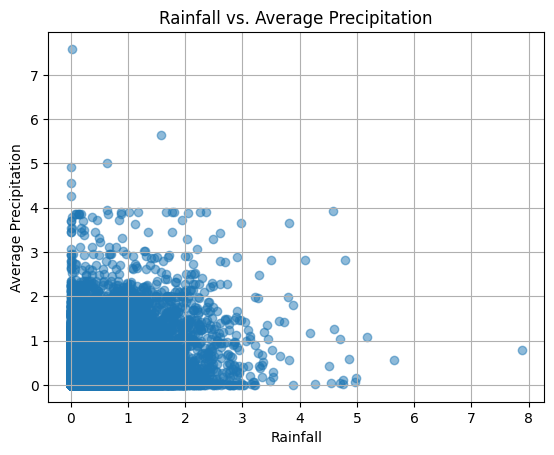

            rainfall  average_precip
count  131763.000000   131763.000000
mean        0.120677        0.111657
std         0.290358        0.276949
min         0.000000        0.000000
25%         0.000000        0.000000
50%         0.000000        0.000000
75%         0.090000        0.074016
max         7.877500        7.583994


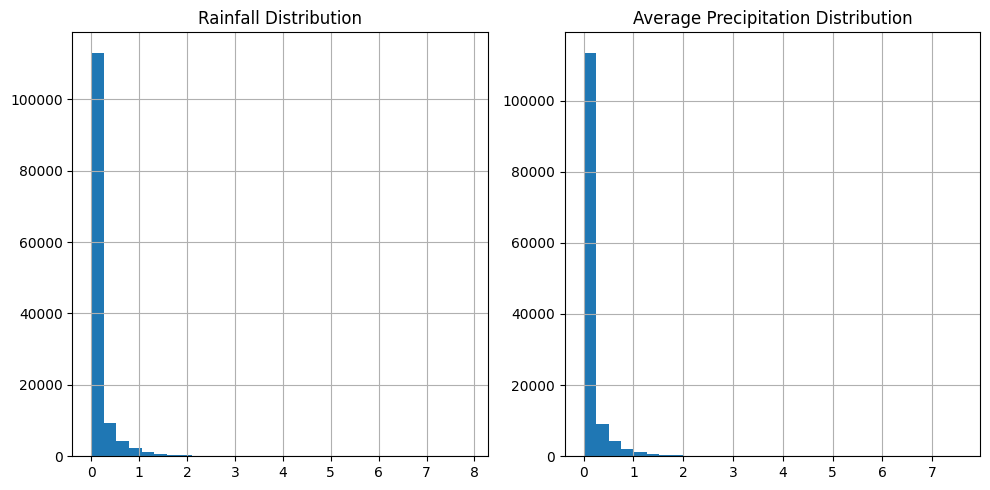

In [ ]:
import pandas as pd
from sklearn.metrics import r2_score

# Ensure the 'date' columns are of datetime type
df1_cleaned['date'] = pd.to_datetime(df1_cleaned['date'])
slice_precip['date'] = pd.to_datetime(slice_precip['date'])

# Standardize the 'county' column names for matching
df1_cleaned['county'] = df1_cleaned['county'].str.upper()
slice_precip['county'] = slice_precip['county'].str.upper()

# Merge the two datasets on 'date' and 'county'
comp_df = pd.merge(df1_cleaned[['date', 'county', 'rainfall']],
                   slice_precip[['date', 'county', 'average_precip']],
                   left_on=['date', 'county'],
                   right_on=['date', 'county'],
                   how='inner')

# Drop rows where either 'rainfall' or 'average_precip' is NaN
comp_df_cleaned = comp_df.dropna(subset=['rainfall', 'average_precip'])

# Check if the merged dataset is not empty after dropping NaN values
if not comp_df_cleaned.empty:
    # Calculate the R-squared value between 'rainfall' and 'average_precip'
    r_squared = r2_score(comp_df_cleaned['rainfall'], comp_df_cleaned['average_precip'])
    print(f"R-squared value between rainfall and average_precip: {r_squared:.4f}")
else:
    print("No valid data to calculate R-squared.")

# Optionally, preview the cleaned merged DataFrame to ensure correctness
print(comp_df_cleaned)

import matplotlib.pyplot as plt

# Plot rainfall vs. average_precip
plt.scatter(comp_df_cleaned['rainfall'], comp_df_cleaned['average_precip'], alpha=0.5)
plt.title('Rainfall vs. Average Precipitation')
plt.xlabel('Rainfall')
plt.ylabel('Average Precipitation')
plt.grid(True)
plt.show()
# Check the descriptive statistics of rainfall and average_precip
print(comp_df_cleaned[['rainfall', 'average_precip']].describe())



# Plot histograms for rainfall and average_precip
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
comp_df_cleaned['rainfall'].hist(bins=30)
plt.title('Rainfall Distribution')

plt.subplot(1, 2, 2)
comp_df_cleaned['average_precip'].hist(bins=30)
plt.title('Average Precipitation Distribution')

plt.tight_layout()
plt.show()


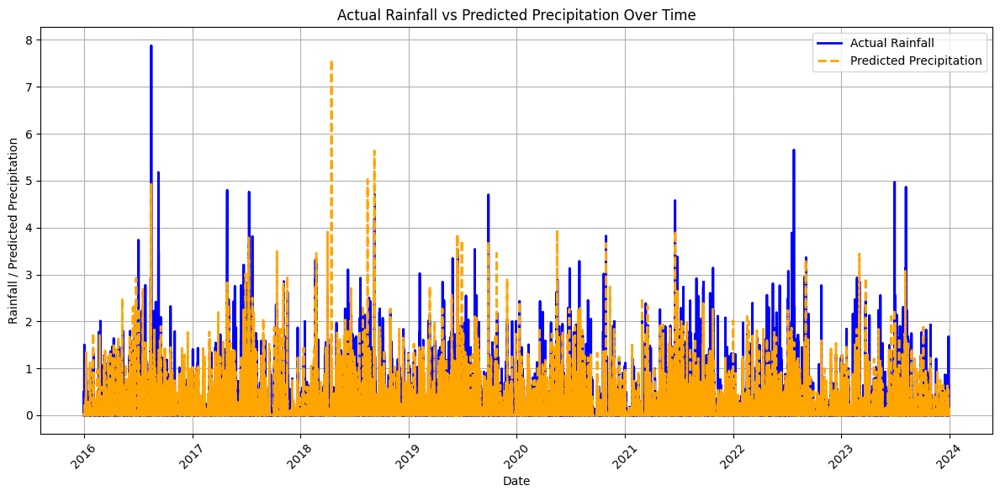

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure data is sorted by date for correct plotting
comp_df_cleaned = comp_df_cleaned.sort_values('date')

# Create a plot
plt.figure(figsize=(12, 6))

# Plot actual rainfall as a line
plt.plot(comp_df_cleaned['date'], comp_df_cleaned['rainfall'], label='Actual Rainfall', color='blue', linestyle='-', linewidth=2)

# Plot predicted precipitation as a line
plt.plot(comp_df_cleaned['date'], comp_df_cleaned['average_precip'], label='Predicted Precipitation', color='orange', linestyle='--', linewidth=2)

# Add title and labels
plt.title('Actual Rainfall vs Predicted Precipitation Over Time')
plt.xlabel('Date')
plt.ylabel('Rainfall / Predicted Precipitation')

# Add legend
plt.legend()

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Add grid for easier comparison
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


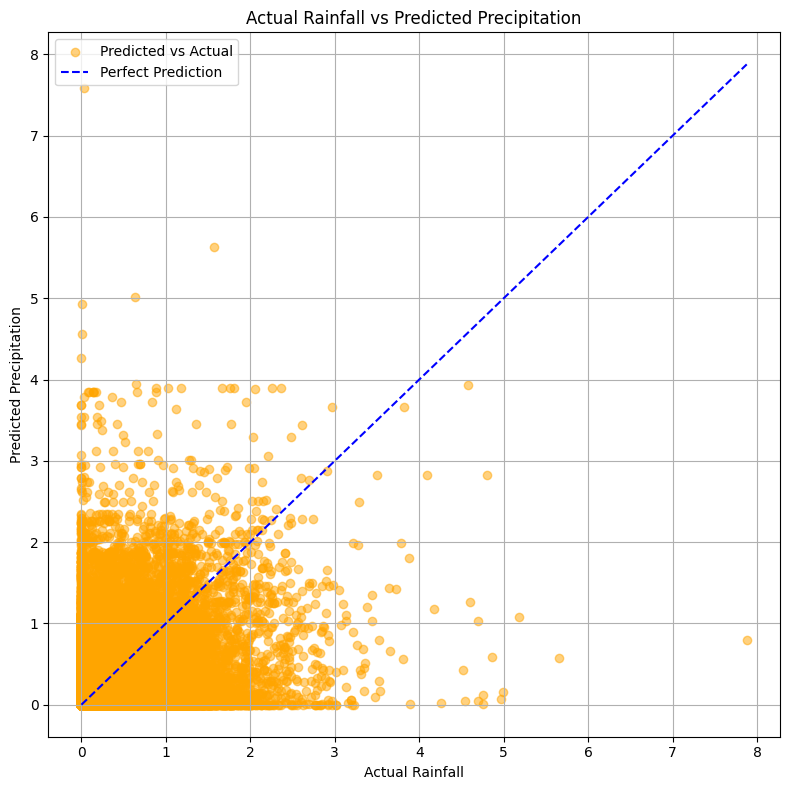

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Ensure no NaN values are present in the merged dataframe
comp_df_cleaned = comp_df_cleaned.dropna(subset=['rainfall', 'average_precip'])

# Create the scatter plot
plt.figure(figsize=(8, 8))

# Plot the actual vs predicted scatter plot
plt.scatter(comp_df_cleaned['rainfall'], comp_df_cleaned['average_precip'], color='orange', label='Predicted vs Actual', alpha=0.5)

# Add the diagonal line for perfect prediction (corner-to-corner)
min_val = min(comp_df_cleaned['rainfall'].min(), comp_df_cleaned['average_precip'].min())
max_val = max(comp_df_cleaned['rainfall'].max(), comp_df_cleaned['average_precip'].max())
plt.plot([min_val, max_val], [min_val, max_val], color='blue', linestyle='--', label='Perfect Prediction')

# Add labels and title
plt.title('Actual Rainfall vs Predicted Precipitation')
plt.xlabel('Actual Rainfall')
plt.ylabel('Predicted Precipitation')

# Add legend
plt.legend()

# Add grid for easier comparison
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


In [ ]:
import statsmodels.api as sm

# Ensure no NaN values are present in the merged dataframe
comp_df_cleaned = comp_df_cleaned.dropna(subset=['rainfall', 'average_precip'])

# Define the independent variable (actual rainfall) and dependent variable (predicted precipitation)
X = comp_df_cleaned['rainfall']  # Actual Rainfall (independent variable)
y = comp_df_cleaned['average_precip']  # Predicted Precipitation (dependent variable)

# Add a constant (intercept) to the model
X = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X).fit()

# Get the R-squared value from the model summary
r_squared = model.rsquared
print(f"R-squared value: {r_squared:.4f}")

# Optionally, print the full summary of the regression model
print(model.summary())


R-squared value: 0.1753
                            OLS Regression Results                            
Dep. Variable:         average_precip   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                 2.801e+04
Date:                Thu, 19 Sep 2024   Prob (F-statistic):               0.00
Time:                        23:15:59   Log-Likelihood:                -5091.7
No. Observations:              131763   AIC:                         1.019e+04
Df Residuals:                  131761   BIC:                         1.021e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0635      0

In [ ]:
# Merge df1 with slice_precip on 'date' and 'County'
df1_merged = pd.merge(df1_cleaned, slice_precip, on=['date', 'county'], how='left')

# Replace NaN values in the 'rainfall' column of df1 with the corresponding 'average_precip' values
df1_merged['rainfall'] = df1_merged['rainfall'].combine_first(df1_merged['average_precip'])

# Drop the 'average_precip' column as it's no longer needed
df1_merged.drop(columns=['average_precip'], inplace=True)

# Display the updated DataFrame
print(df1_merged.head())


        date      county        max        min   meantemp  rainfall
0 2016-01-01       ALLEN  29.500000  24.500000  27.000000       0.0
1 2016-01-01      MARTIN  31.000000  25.000000  28.000000       0.0
2 2016-01-01      MONROE  34.333333  24.333333  29.333333       0.0
3 2016-01-01  MONTGOMERY  29.000000  23.000000  26.000000       0.0
4 2016-01-01      MORGAN  31.000000  25.000000  28.000000       0.0


In [ ]:
df1['date'] = pd.to_datetime(df1['date'])

# Step 2: Set the 'Date' column as the index
df1.set_index('date', inplace=True)

In [ ]:
df1['year'] = pd.to_datetime(df1.index).year

In [ ]:
df1_cleaned

,date,county,max,min,meantemp,rainfall
0,2016-01-01,ALLEN,29.500000,24.500000,27.000000,0.000000
1,2016-01-01,MARTIN,31.000000,25.000000,28.000000,0.000000
2,2016-01-01,MONROE,34.333333,24.333333,29.333333,0.000000
3,2016-01-01,MONTGOMERY,29.000000,23.000000,26.000000,0.000000
4,2016-01-01,MORGAN,31.000000,25.000000,28.000000,0.000000
...,...,...,...,...,...,...
157783,2023-12-31,HUNTINGTON,37.000000,33.000000,35.000000,0.000000
157784,2023-12-31,HOWARD,35.000000,30.000000,32.500000,0.000000
157785,2023-12-31,HENRY,36.000000,32.000000,34.000000,NaN
157786,2023-12-31,HANCOCK,36.000000,32.000000,34.000000,0.002857


In [ ]:
df1_merged

,date,county,max,min,meantemp,rainfall
0,2016-01-01,ALLEN,29.500000,24.500000,27.000000,0.000000
1,2016-01-01,MARTIN,31.000000,25.000000,28.000000,0.000000
2,2016-01-01,MONROE,34.333333,24.333333,29.333333,0.000000
3,2016-01-01,MONTGOMERY,29.000000,23.000000,26.000000,0.000000
4,2016-01-01,MORGAN,31.000000,25.000000,28.000000,0.000000
...,...,...,...,...,...,...
155224,2023-12-31,HUNTINGTON,37.000000,33.000000,35.000000,0.000000
155225,2023-12-31,HOWARD,35.000000,30.000000,32.500000,0.000000
155226,2023-12-31,HENRY,36.000000,32.000000,34.000000,0.012598
155227,2023-12-31,HANCOCK,36.000000,32.000000,34.000000,0.002857


In [ ]:
# Check the number of NaN values in each column of df1
nan_counts_df1 = df1_cleaned.isna().sum()

# Display the results
print("NaN values in df1:")
print(nan_counts_df1)
print('total:  ')
print(len(df1_cleaned))
# Check the number of NaN values in each column of df1_merged
nan_counts_df1_merged = df1_merged.isna().sum()

# Display the results
print("\nNaN values in df1_merged:")
print(nan_counts_df1_merged)
print(len(df1_merged))

NaN values in df1:
date            0
county          0
max         12164
min         12994
meantemp    13250
rainfall     1573
dtype: int64
total:  
155229

NaN values in df1_merged:
date            0
county          0
max         12164
min         12994
meantemp    13250
rainfall      184
dtype: int64
155229


In [ ]:
duplicate1s = df1_cleaned[df1_cleaned.duplicated(subset=['date', 'county'], keep=False)]
duplicate2s = df1_merged[df1_merged.duplicated(subset=['date', 'county'], keep=False)]
# Display duplicates if any
print("Duplicate  1 entries based on 'date' and 'county':")
print(duplicate1s)
print("Duplicate  2 entries based on 'date' and 'county':")
print(duplicate2s)

Duplicate  1 entries based on 'date' and 'county':
             date      county        max        min   meantemp  rainfall
648    2016-01-13  TIPPECANOE  22.000000  -2.000000  10.000000  0.020000
649    2016-01-13  TIPPECANOE  22.000000  -2.000000  10.000000  0.020000
1793   2016-02-03  TIPPECANOE  58.666667  32.666667  45.666667  0.277143
1794   2016-02-03  TIPPECANOE  58.666667  32.666667  45.666667  0.277143
3420   2016-03-04  TIPPECANOE  35.000000  18.333333  26.666667  0.194286
...           ...         ...        ...        ...        ...       ...
155938 2023-11-27  TIPPECANOE  34.333333  23.333333  28.833333  0.154000
157046 2023-12-18  TIPPECANOE  40.333333  28.666667  34.500000  0.017500
157047 2023-12-18  TIPPECANOE  40.333333  28.666667  34.500000  0.017500
157371 2023-12-24  TIPPECANOE  57.000000  46.000000  51.500000  0.010000
157372 2023-12-24  TIPPECANOE  57.000000  46.000000  51.500000  0.010000

[726 rows x 6 columns]
Duplicate  2 entries based on 'date' and 'county'

In [ ]:
df1_cleaned_again = df1_cleaned.drop_duplicates()

# Check for any remaining duplicates
duplicates_remaining = df1_cleaned.duplicated().sum()

# Display the results
print(f"Number of duplicates removed: {len(df1_cleaned) - len(df1_cleaned_again)}")
print(f"Number of duplicates remaining: {duplicates_remaining}")

# Display the cleaned DataFrame
print(df1_cleaned_again.head())

Number of duplicates removed: 0
Number of duplicates remaining: 0
        date      county        max        min   meantemp  rainfall
0 2016-01-01       ALLEN  29.500000  24.500000  27.000000       0.0
1 2016-01-01      MARTIN  31.000000  25.000000  28.000000       0.0
2 2016-01-01      MONROE  34.333333  24.333333  29.333333       0.0
3 2016-01-01  MONTGOMERY  29.000000  23.000000  26.000000       0.0
4 2016-01-01      MORGAN  31.000000  25.000000  28.000000       0.0


In [ ]:
df1_merged_cleanedagain = df1_merged.drop_duplicates()

# Check for any remaining duplicates
duplicates_remaining = df1_merged_cleanedagain.duplicated().sum()

# Display the results
print(f"Number of duplicates removed: {len(df1_merged) - len(df1_merged_cleanedagain)}")
print(f"Number of duplicates remaining: {duplicates_remaining}")

# Display the cleaned DataFrame
# print(df1_cleaned_again.head())

Number of duplicates removed: 0
Number of duplicates remaining: 0


In [ ]:
df1_merged_cleanedagain.to_csv('/content/drive/MyDrive/yield_classification/merged_df.csv', index=False)


In [ ]:
shp_dir = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')




import pandas as pd
import geopandas as gpd
from meteostat import Point, Daily
from datetime import datetime

# Step 1: Calculate the Five Points (Extents and Centroid) for Each County
def calculate_points(gdf):
    points = {
        'bottom_left': [],
        'bottom_right': [],
        'top_left': [],
        'top_right': [],
        'centroid': []
    }

    for _, row in gdf.iterrows():
        county_name = row['NAME_U']
        extent = row.geometry.bounds  # returns (minx, miny, maxx, maxy)

        # Calculate the points
        bottom_left = (extent[0], extent[1])
        bottom_right = (extent[2], extent[1])
        top_left = (extent[0], extent[3])
        top_right = (extent[2], extent[3])
        centroid = (row.geometry.centroid.x, row.geometry.centroid.y)

        # Store the points
        points['bottom_left'].append((county_name, bottom_left))
        points['bottom_right'].append((county_name, bottom_right))
        points['top_left'].append((county_name, top_left))
        points['top_right'].append((county_name, top_right))
        points['centroid'].append((county_name, centroid))

    return points

# Step 2: Define Function to Fetch Weather Data for Each Point
def fetch_weather_for_point(point_list, start, end):
    county_weather_data = []

    for county_name, coord in point_list:
        # Create a Meteostat Point object for the location
        loc = Point(coord[1], coord[0], 230)

        # Fetch daily weather data for the location
        data = Daily(loc, start, end).fetch()
        if 'tavg' in data.columns:
            tavg_data = data['tavg']
            for date, tavg in tavg_data.items():
                county_weather_data.append({
                    'Date': date,
                    'County': county_name,
                    'tavg': tavg
                })

    # Create DataFrame from the list of dictionaries
    df = pd.DataFrame(county_weather_data)
    return df

# Path to the shapefile
# shp_dir = "/content/drive/MyDrive/Census_Counties/Census_County_TIGER00_IN.shp"

# Load the shapefile
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')

# Calculate the points for each county
points = calculate_points(gdf)

# Set the time period
start = datetime(2016, 1, 1)
end = datetime(2023, 12, 31)

# Step 3: Fetch Data for Each Point Separately
df_bottom_left = fetch_weather_for_point(points['bottom_left'], start, end)
df_bottom_right = fetch_weather_for_point(points['bottom_right'], start, end)
df_top_left = fetch_weather_for_point(points['top_left'], start, end)
df_top_right = fetch_weather_for_point(points['top_right'], start, end)
df_centroid = fetch_weather_for_point(points['centroid'], start, end)

# Step 4: Merge the DataFrames into a Single DataFrame
merged_df = df_centroid.rename(columns={'tavg': 'tavg_centroid'})
merged_df = pd.merge(merged_df, df_bottom_left.rename(columns={'tavg': 'tavg_bottom_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_bottom_right.rename(columns={'tavg': 'tavg_bottom_right'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_left.rename(columns={'tavg': 'tavgn_top_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_right.rename(columns={'tavg': 'tavg_top_right'}), on=['Date', 'County'], how='outer')

# Display the final merged DataFrame

merged_df

,Date,County,tavg_centroid,tavg_bottom_left,tavg_bottom_right,tavgn_top_left,tavg_top_right
0,2016-01-01,STEUBEN,-3.4,-2.6,-2.6,-4.2,-3.4
1,2016-01-02,STEUBEN,-0.9,-0.8,-0.8,-1.6,-0.9
2,2016-01-03,STEUBEN,-0.1,-0.1,-0.1,-0.7,-0.1
3,2016-01-04,STEUBEN,-4.3,-2.8,-2.8,-4.9,-4.3
4,2016-01-05,STEUBEN,-5.6,-5.3,-5.3,-7.2,-5.6
...,...,...,...,...,...,...,...
261444,2020-01-10,SWITZERLAND,NaN,NaN,NaN,NaN,12.1
261445,2020-01-11,SWITZERLAND,NaN,NaN,NaN,NaN,15.7
261446,2020-01-12,SWITZERLAND,NaN,NaN,NaN,NaN,6.4
261447,2020-01-13,SWITZERLAND,NaN,NaN,NaN,NaN,6.1


In [ ]:
# Calculate the row-wise mean of the five precipitation columns, ignoring NaN values
merged_df['average_tavg'] = merged_df[['tavg_centroid', 'tavg_bottom_left',
                                         'tavg_bottom_right', 'tavgn_top_left',
                                         'tavg_top_right']].apply(lambda row: np.nanmean(row), axis=1)

# Display the final DataFrame with the new average_precip column
slice_tavg = merged_df[['Date', 'County', 'average_tavg']]
# Rename the 'Date' column to 'date' in slice_precip
slice_tavg = slice_tavg.rename(columns={'Date': 'date', 'County':'county'})
# Convert the 'date' column in df1 to datetime
#df1_cleaned['date'] = pd.to_datetime(df1_cleaned['date'])

# Convert the 'date' column in slice_precip to datetime
slice_tavg['date'] = pd.to_datetime(slice_tavg['date'])
# Convert average_tavg from Celsius to Fahrenheit
slice_tavg['average_tavg'] = slice_tavg['average_tavg'] * 9/5 + 32


In [ ]:
slice_tavg

,date,county,average_tavg
0,2016-01-01,STEUBEN,26.168
1,2016-01-02,STEUBEN,30.200
2,2016-01-03,STEUBEN,31.604
3,2016-01-04,STEUBEN,25.124
4,2016-01-05,STEUBEN,21.560
...,...,...,...
261444,2020-01-10,SWITZERLAND,53.780
261445,2020-01-11,SWITZERLAND,60.260
261446,2020-01-12,SWITZERLAND,43.520
261447,2020-01-13,SWITZERLAND,42.980


R-squared value between meantemp and average_tavg: 0.9400
        date      county   meantemp  average_tavg
0 2016-01-01       ALLEN  27.000000         26.78
1 2016-01-01      MARTIN  28.000000         30.11
2 2016-01-01      MONROE  29.333333         29.30
3 2016-01-01  MONTGOMERY  26.000000         25.88
4 2016-01-01      MORGAN  28.000000         28.16
R-squared value between meantemp and average_tavg: 0.9400


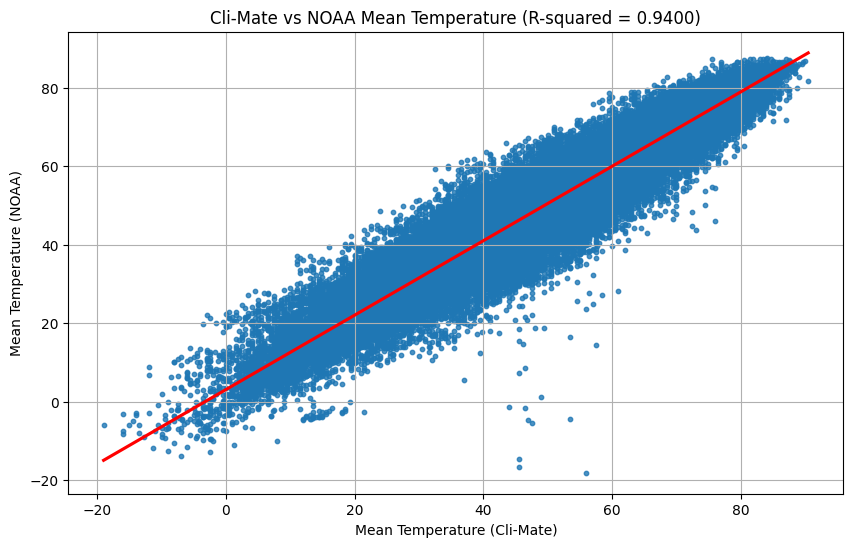

In [ ]:
import pandas as pd
from sklearn.metrics import r2_score

# Ensure date columns are in datetime format
df1_merged_cleanedagain['date'] = pd.to_datetime(df1_merged_cleanedagain['date'])
slice_tavg['date'] = pd.to_datetime(slice_tavg['date'])

# Standardize the 'county' column names for matching
df1_merged_cleanedagain['county'] = df1_merged_cleanedagain['county'].str.upper()
slice_tavg['county'] = slice_tavg['county'].str.upper()

# Merge the two dataframes on 'date' and 'county'
merged_df = pd.merge(df1_merged_cleanedagain[['date', 'county', 'meantemp']],
                     slice_tavg[['date', 'county', 'average_tavg']],
                     on=['date', 'county'],
                     how='inner')

# Drop rows with missing values in 'meantemp' or 'average_tavg'
merged_df_cleaned = merged_df.dropna(subset=['meantemp', 'average_tavg'])

# Perform R-squared comparison between 'meantemp' and 'average_tavg'
r_squared = r2_score(merged_df_cleaned['meantemp'], merged_df_cleaned['average_tavg'])

# Display the result
print(f"R-squared value between meantemp and average_tavg: {r_squared:.4f}")

# Optionally, preview the merged DataFrame
print(merged_df_cleaned.head())
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score

# Ensure date columns are in datetime format
df1_merged_cleanedagain['date'] = pd.to_datetime(df1_merged_cleanedagain['date'])
slice_tavg['date'] = pd.to_datetime(slice_tavg['date'])

# Standardize the 'county' column names for matching
df1_merged_cleanedagain['county'] = df1_merged_cleanedagain['county'].str.upper()
slice_tavg['county'] = slice_tavg['county'].str.upper()

# Merge the two dataframes on 'date' and 'county'
merged_df = pd.merge(df1_merged_cleanedagain[['date', 'county', 'meantemp']],
                     slice_tavg[['date', 'county', 'average_tavg']],
                     on=['date', 'county'],
                     how='inner')

# Drop rows with missing values in 'meantemp' or 'average_tavg'
merged_df_cleaned = merged_df.dropna(subset=['meantemp', 'average_tavg'])

# Perform R-squared comparison between 'meantemp' and 'average_tavg'
r_squared = r2_score(merged_df_cleaned['meantemp'], merged_df_cleaned['average_tavg'])

# Display the R-squared value
print(f"R-squared value between meantemp and average_tavg: {r_squared:.4f}")

# Plot scatter plot with fitted regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='meantemp', y='average_tavg', data=merged_df_cleaned, scatter_kws={'s': 10}, line_kws={'color': 'red'})
plt.title(f'Cli-Mate vs NOAA Mean Temperature (R-squared = {r_squared:.4f})')
plt.xlabel('Mean Temperature (Cli-Mate)')
plt.ylabel('Mean Temperature (NOAA)')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd

# Ensure both date columns are in datetime format for proper merging
df1_merged_cleanedagain['date'] = pd.to_datetime(df1_merged_cleanedagain['date'])
slice_tavg['date'] = pd.to_datetime(slice_tavg['date'])

# Standardize the 'county' column names for matching
df1_merged_cleanedagain['county'] = df1_merged_cleanedagain['county'].str.upper()
slice_tavg['county'] = slice_tavg['county'].str.upper()

# Merge df1_cleaned and slice_tavg on 'date' and 'county'
df1_merged = pd.merge(df1_merged_cleanedagain, slice_tavg, on=['date', 'county'], how='left')

# Replace NaN values in the 'meantemp' column of df1 with the corresponding 'average_tavg' values from slice_tavg
df1_merged['meantemp'] = df1_merged['meantemp'].combine_first(df1_merged['average_tavg'])

# Drop the 'average_tavg' column as it's no longer needed
df1_merged.drop(columns=['average_tavg'], inplace=True)

# Display the updated DataFrame
print(df1_merged.head())


        date      county        max        min   meantemp  rainfall
0 2016-01-01       ALLEN  29.500000  24.500000  27.000000       0.0
1 2016-01-01      MARTIN  31.000000  25.000000  28.000000       0.0
2 2016-01-01      MONROE  34.333333  24.333333  29.333333       0.0
3 2016-01-01  MONTGOMERY  29.000000  23.000000  26.000000       0.0
4 2016-01-01      MORGAN  31.000000  25.000000  28.000000       0.0


In [ ]:
#temperature min



shp_dir = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')




import pandas as pd
import geopandas as gpd
from meteostat import Point, Daily
from datetime import datetime

# Step 1: Calculate the Five Points (Extents and Centroid) for Each County
def calculate_points(gdf):
    points = {
        'bottom_left': [],
        'bottom_right': [],
        'top_left': [],
        'top_right': [],
        'centroid': []
    }

    for _, row in gdf.iterrows():
        county_name = row['NAME_U']
        extent = row.geometry.bounds  # returns (minx, miny, maxx, maxy)

        # Calculate the points
        bottom_left = (extent[0], extent[1])
        bottom_right = (extent[2], extent[1])
        top_left = (extent[0], extent[3])
        top_right = (extent[2], extent[3])
        centroid = (row.geometry.centroid.x, row.geometry.centroid.y)

        # Store the points
        points['bottom_left'].append((county_name, bottom_left))
        points['bottom_right'].append((county_name, bottom_right))
        points['top_left'].append((county_name, top_left))
        points['top_right'].append((county_name, top_right))
        points['centroid'].append((county_name, centroid))

    return points

# Step 2: Define Function to Fetch Weather Data for Each Point
def fetch_weather_for_point(point_list, start, end):
    county_weather_data = []

    for county_name, coord in point_list:
        # Create a Meteostat Point object for the location
        loc = Point(coord[1], coord[0], 230)

        # Fetch daily weather data for the location
        data = Daily(loc, start, end).fetch()
        if 'tmin' in data.columns:
            tmin_data = data['tmin']
            for date, tmin in tmin_data.items():
                county_weather_data.append({
                    'Date': date,
                    'County': county_name,
                    'tmin': tmin
                })

    # Create DataFrame from the list of dictionaries
    df = pd.DataFrame(county_weather_data)
    return df

# Path to the shapefile
# shp_dir = "/content/drive/MyDrive/Census_Counties/Census_County_TIGER00_IN.shp"

# Load the shapefile
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')

# Calculate the points for each county
points = calculate_points(gdf)

# Set the time period
start = datetime(2016, 1, 1)
end = datetime(2023, 12, 31)

# Step 3: Fetch Data for Each Point Separately
df_bottom_left = fetch_weather_for_point(points['bottom_left'], start, end)
df_bottom_right = fetch_weather_for_point(points['bottom_right'], start, end)
df_top_left = fetch_weather_for_point(points['top_left'], start, end)
df_top_right = fetch_weather_for_point(points['top_right'], start, end)
df_centroid = fetch_weather_for_point(points['centroid'], start, end)

# Step 4: Merge the DataFrames into a Single DataFrame
merged_df = df_centroid.rename(columns={'tmin': 'tmin_centroid'})
merged_df = pd.merge(merged_df, df_bottom_left.rename(columns={'tmin': 'tmin_bottom_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_bottom_right.rename(columns={'tmin': 'tmin_bottom_right'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_left.rename(columns={'tmin': 'tmin_top_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_right.rename(columns={'tmin': 'tmin_top_right'}), on=['Date', 'County'], how='outer')

# Display the final merged DataFrame

print(merged_df)

# Calculate the row-wise mean of the five precipitation columns, ignoring NaN values
merged_df['average_tmin'] = merged_df[['tmin_centroid', 'tmin_bottom_left',
                                         'tmin_bottom_right', 'tmin_top_left',
                                         'tmin_top_right']].apply(lambda row: np.nanmean(row), axis=1)

# Display the final DataFrame with the new average_precip column
slice_tmin = merged_df[['Date', 'County', 'average_tmin']]
# Rename the 'Date' column to 'date' in slice_precip
slice_tmin = slice_tmin.rename(columns={'Date': 'date', 'County':'county'})
# Convert the 'date' column in df1 to datetime
#df1_cleaned['date'] = pd.to_datetime(df1_cleaned['date'])

# Convert the 'date' column in slice_precip to datetime
slice_tmin['date'] = pd.to_datetime(slice_tmin['date'])
# Convert average_tavg from Celsius to Fahrenheit
slice_tmin['average_tmin'] = slice_tmin['average_tmin'] * 9/5 + 32


print('......................................')

print(slice_tmin)


             Date       County  tmin_centroid  tmin_bottom_left  \
0      2016-01-01      STEUBEN           -4.9              -3.8   
1      2016-01-02      STEUBEN           -2.8              -2.8   
2      2016-01-03      STEUBEN           -1.7              -0.8   
3      2016-01-04      STEUBEN           -8.8              -6.8   
4      2016-01-05      STEUBEN          -10.5              -9.8   
...           ...          ...            ...               ...   
261444 2020-01-10  SWITZERLAND            NaN               NaN   
261445 2020-01-11  SWITZERLAND            NaN               NaN   
261446 2020-01-12  SWITZERLAND            NaN               NaN   
261447 2020-01-13  SWITZERLAND            NaN               NaN   
261448 2020-01-14  SWITZERLAND            NaN               NaN   

        tmin_bottom_right  tmin_top_left  tmin_top_right  
0                    -3.8           -5.9            -4.9  
1                    -2.8           -4.0            -2.8  
2                 

......................................
             date       county  average_tmin
0      2016-01-01      STEUBEN        23.612
1      2016-01-02      STEUBEN        26.528
2      2016-01-03      STEUBEN        29.192
3      2016-01-04      STEUBEN        17.276
4      2016-01-05      STEUBEN        13.244
...           ...          ...           ...
261444 2020-01-10  SWITZERLAND        49.460
261445 2020-01-11  SWITZERLAND        44.600
261446 2020-01-12  SWITZERLAND        37.580
261447 2020-01-13  SWITZERLAND        39.560
261448 2020-01-14  SWITZERLAND        36.500

[261449 rows x 3 columns]


R-squared value between min and average_tmin: 0.9209


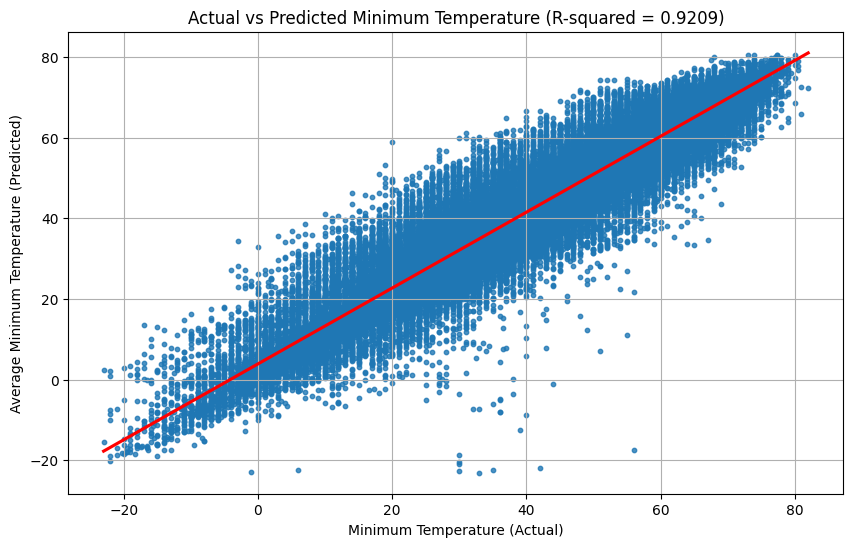

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score

# Ensure both 'date' columns are in datetime format for proper merging
df1_merged['date'] = pd.to_datetime(df1_merged['date'])
slice_tmin['date'] = pd.to_datetime(slice_tmin['date'])

# Standardize the 'county' column names for matching
df1_merged['county'] = df1_merged['county'].str.upper()
slice_tmin['county'] = slice_tmin['county'].str.upper()

# Merge df1_merged and slice_tmin on 'date' and 'county'
df_merged_tmin = pd.merge(df1_merged, slice_tmin, on=['date', 'county'], how='inner')

# Drop rows where either 'min' or 'average_tmin' is NaN
df_merged_tmin_cleaned = df_merged_tmin.dropna(subset=['min', 'average_tmin'])

# Calculate R-squared between 'min' and 'average_tmin'
r_squared = r2_score(df_merged_tmin_cleaned['min'], df_merged_tmin_cleaned['average_tmin'])

# Display the R-squared value
print(f"R-squared value between min and average_tmin: {r_squared:.4f}")

# Plot scatter plot with fitted regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='min', y='average_tmin', data=df_merged_tmin_cleaned, scatter_kws={'s': 10}, line_kws={'color': 'red'})
plt.title(f'Actual vs Predicted Minimum Temperature (R-squared = {r_squared:.4f})')
plt.xlabel('Minimum Temperature (Actual)')
plt.ylabel('Average Minimum Temperature (Predicted)')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd

# Ensure both 'date' columns are in datetime format for proper merging
df1_merged['date'] = pd.to_datetime(df1_merged['date'])
slice_tmin['date'] = pd.to_datetime(slice_tmin['date'])

# Standardize the 'county' column names for matching
df1_merged['county'] = df1_merged['county'].str.upper()
slice_tmin['county'] = slice_tmin['county'].str.upper()

# Merge df_merged and slice_tmin on 'date' and 'county'
df_merged_final = pd.merge(df1_merged, slice_tmin, on=['date', 'county'], how='left')

# Replace NaN values in the 'min' column of df_merged with the corresponding 'average_tmin' values from slice_tmin
df_merged_final['min'] = df_merged_final['min'].combine_first(df_merged_final['average_tmin'])

# Drop the 'average_tmin' column as it's no longer needed
df_merged_final.drop(columns=['average_tmin'], inplace=True)

# Display the updated DataFrame
print(df_merged_final.isna().sum())


date            0
county          0
max         12164
min            38
meantemp       40
rainfall      184
dtype: int64


In [ ]:
#temperature min



shp_dir = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')




import pandas as pd
import geopandas as gpd
from meteostat import Point, Daily
from datetime import datetime

# Step 1: Calculate the Five Points (Extents and Centroid) for Each County
def calculate_points(gdf):
    points = {
        'bottom_left': [],
        'bottom_right': [],
        'top_left': [],
        'top_right': [],
        'centroid': []
    }

    for _, row in gdf.iterrows():
        county_name = row['NAME_U']
        extent = row.geometry.bounds  # returns (minx, miny, maxx, maxy)

        # Calculate the points
        bottom_left = (extent[0], extent[1])
        bottom_right = (extent[2], extent[1])
        top_left = (extent[0], extent[3])
        top_right = (extent[2], extent[3])
        centroid = (row.geometry.centroid.x, row.geometry.centroid.y)

        # Store the points
        points['bottom_left'].append((county_name, bottom_left))
        points['bottom_right'].append((county_name, bottom_right))
        points['top_left'].append((county_name, top_left))
        points['top_right'].append((county_name, top_right))
        points['centroid'].append((county_name, centroid))

    return points

# Step 2: Define Function to Fetch Weather Data for Each Point
def fetch_weather_for_point(point_list, start, end):
    county_weather_data = []

    for county_name, coord in point_list:
        # Create a Meteostat Point object for the location
        loc = Point(coord[1], coord[0], 230)

        # Fetch daily weather data for the location
        data = Daily(loc, start, end).fetch()
        if 'tmax' in data.columns:
            tmax_data = data['tmax']
            for date, tmax in tmax_data.items():
                county_weather_data.append({
                    'Date': date,
                    'County': county_name,
                    'tmax': tmax
                })

    # Create DataFrame from the list of dictionaries
    df = pd.DataFrame(county_weather_data)
    return df

# Path to the shapefile
# shp_dir = "/content/drive/MyDrive/Census_Counties/Census_County_TIGER00_IN.shp"

# Load the shapefile
gdf = gpd.read_file(shp_dir)
gdf = gdf.to_crs('EPSG:4326')

# Calculate the points for each county
points = calculate_points(gdf)

# Set the time period
start = datetime(2016, 1, 1)
end = datetime(2023, 12, 31)

# Step 3: Fetch Data for Each Point Separately
df_bottom_left = fetch_weather_for_point(points['bottom_left'], start, end)
df_bottom_right = fetch_weather_for_point(points['bottom_right'], start, end)
df_top_left = fetch_weather_for_point(points['top_left'], start, end)
df_top_right = fetch_weather_for_point(points['top_right'], start, end)
df_centroid = fetch_weather_for_point(points['centroid'], start, end)

# Step 4: Merge the DataFrames into a Single DataFrame
merged_df = df_centroid.rename(columns={'tmax': 'tmax_centroid'})
merged_df = pd.merge(merged_df, df_bottom_left.rename(columns={'tmax': 'tmax_bottom_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_bottom_right.rename(columns={'tmax': 'tmax_bottom_right'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_left.rename(columns={'tmax': 'tmax_top_left'}), on=['Date', 'County'], how='outer')
merged_df = pd.merge(merged_df, df_top_right.rename(columns={'tmax': 'tmax_top_right'}), on=['Date', 'County'], how='outer')

# Display the final merged DataFrame

print(merged_df)

# Calculate the row-wise mean of the five precipitation columns, ignoring NaN values
merged_df['average_tmax'] = merged_df[['tmax_centroid', 'tmax_bottom_left',
                                         'tmax_bottom_right', 'tmax_top_left',
                                         'tmax_top_right']].apply(lambda row: np.nanmean(row), axis=1)

# Display the final DataFrame with the new average_precip column
slice_tmax = merged_df[['Date', 'County', 'average_tmax']]
# Rename the 'Date' column to 'date' in slice_precip
slice_tmax = slice_tmax.rename(columns={'Date': 'date', 'County':'county'})
# Convert the 'date' column in df1 to datetime
#df1_cleaned['date'] = pd.to_datetime(df1_cleaned['date'])

# Convert the 'date' column in slice_precip to datetime
slice_tmax['date'] = pd.to_datetime(slice_tmax['date'])
# Convert average_tavg from Celsius to Fahrenheit
slice_tmax['average_tmax'] = slice_tmax['average_tmax'] * 9/5 + 32


print('......................................')

print(slice_tmax)


             Date       County  tmax_centroid  tmax_bottom_left  \
0      2016-01-01      STEUBEN           -2.1              -1.8   
1      2016-01-02      STEUBEN            0.6               1.2   
2      2016-01-03      STEUBEN            0.4               0.2   
3      2016-01-04      STEUBEN           -1.7              -0.8   
4      2016-01-05      STEUBEN           -0.2               0.2   
...           ...          ...            ...               ...   
261444 2020-01-10  SWITZERLAND            NaN               NaN   
261445 2020-01-11  SWITZERLAND            NaN               NaN   
261446 2020-01-12  SWITZERLAND            NaN               NaN   
261447 2020-01-13  SWITZERLAND            NaN               NaN   
261448 2020-01-14  SWITZERLAND            NaN               NaN   

        tmax_bottom_right  tmax_top_left  tmax_top_right  
0                    -1.8           -2.9            -2.1  
1                     1.2            0.6             0.6  
2                 

......................................
             date       county  average_tmax
0      2016-01-01      STEUBEN        28.148
1      2016-01-02      STEUBEN        33.512
2      2016-01-03      STEUBEN        32.468
3      2016-01-04      STEUBEN        29.120
4      2016-01-05      STEUBEN        31.172
...           ...          ...           ...
261444 2020-01-10  SWITZERLAND        61.520
261445 2020-01-11  SWITZERLAND        67.460
261446 2020-01-12  SWITZERLAND        44.600
261447 2020-01-13  SWITZERLAND        49.460
261448 2020-01-14  SWITZERLAND        54.500

[261449 rows x 3 columns]


R-squared value between max and average_tmax: 0.8909


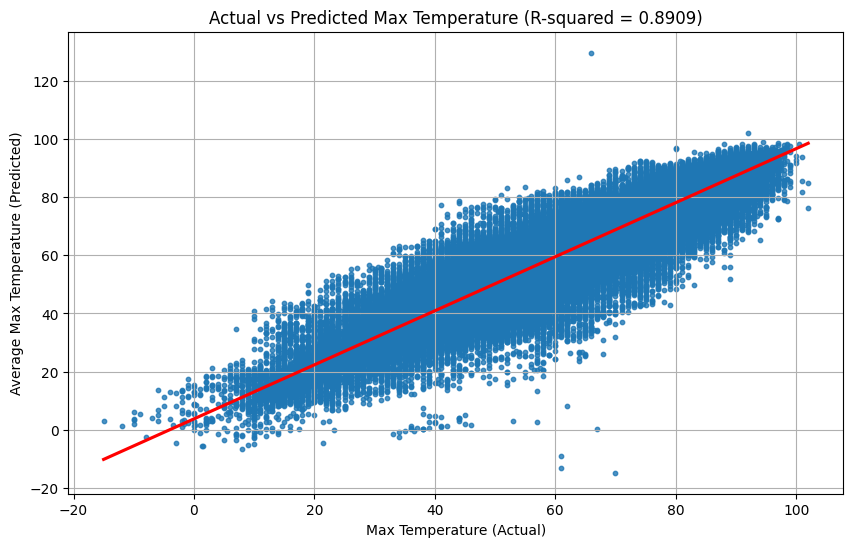

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score

# Ensure both 'date' columns are in datetime format for proper merging
df_merged_final['date'] = pd.to_datetime(df_merged_final['date'])
slice_tmax['date'] = pd.to_datetime(slice_tmax['date'])

# Standardize the 'county' column names for matching
df_merged_final['county'] = df_merged_final['county'].str.upper()
slice_tmax['county'] = slice_tmax['county'].str.upper()

# Merge df1_merged and slice_tmin on 'date' and 'county'
df_merged_tmax = pd.merge(df_merged_final, slice_tmax, on=['date', 'county'], how='inner')

# Drop rows where either 'min' or 'average_tmin' is NaN
df_merged_tmax_cleaned = df_merged_tmax.dropna(subset=['max', 'average_tmax'])

# Calculate R-squared between 'min' and 'average_tmin'
r_squared = r2_score(df_merged_tmax_cleaned['max'], df_merged_tmax_cleaned['average_tmax'])

# Display the R-squared value
print(f"R-squared value between max and average_tmax: {r_squared:.4f}")

# Plot scatter plot with fitted regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='max', y='average_tmax', data=df_merged_tmax_cleaned, scatter_kws={'s': 10}, line_kws={'color': 'red'})
plt.title(f'Actual vs Predicted Max Temperature (R-squared = {r_squared:.4f})')
plt.xlabel('Max Temperature (Actual)')
plt.ylabel('Average Max Temperature (Predicted)')
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd

# Ensure both 'date' columns are in datetime format for proper merging
df_merged_final['date'] = pd.to_datetime(df_merged_final['date'])
slice_tmax['date'] = pd.to_datetime(slice_tmax['date'])

# Standardize the 'county' column names for matching
df_merged_final['county'] = df_merged_final['county'].str.upper()
slice_tmax['county'] = slice_tmax['county'].str.upper()

# Merge df_merged and slice_tmin on 'date' and 'county'
df_merged_alls = pd.merge(df_merged_final, slice_tmax, on=['date', 'county'], how='left')

# Replace NaN values in the 'min' column of df_merged with the corresponding 'average_tmin' values from slice_tmin
df_merged_alls['max'] =df_merged_alls['max'].combine_first(df_merged_alls['average_tmax'])

# Drop the 'average_tmin' column as it's no longer needed
df_merged_alls.drop(columns=['average_tmax'], inplace=True)

# Display the updated DataFrame
print(df_merged_alls.isna().sum())

date          0
county        0
max          38
min          38
meantemp     40
rainfall    184
dtype: int64


In [ ]:
df_merged_alls.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/merged_all_less_missing.csv', index=False)

In [ ]:
df_merged_alls

,date,county,max,min,meantemp,rainfall
0,2016-01-01,ALLEN,29.500000,24.500000,27.000000,0.000000
1,2016-01-01,MARTIN,31.000000,25.000000,28.000000,0.000000
2,2016-01-01,MONROE,34.333333,24.333333,29.333333,0.000000
3,2016-01-01,MONTGOMERY,29.000000,23.000000,26.000000,0.000000
4,2016-01-01,MORGAN,31.000000,25.000000,28.000000,0.000000
...,...,...,...,...,...,...
155224,2023-12-31,HUNTINGTON,37.000000,33.000000,35.000000,0.000000
155225,2023-12-31,HOWARD,35.000000,30.000000,32.500000,0.000000
155226,2023-12-31,HENRY,36.000000,32.000000,34.000000,0.012598
155227,2023-12-31,HANCOCK,36.000000,32.000000,34.000000,0.002857


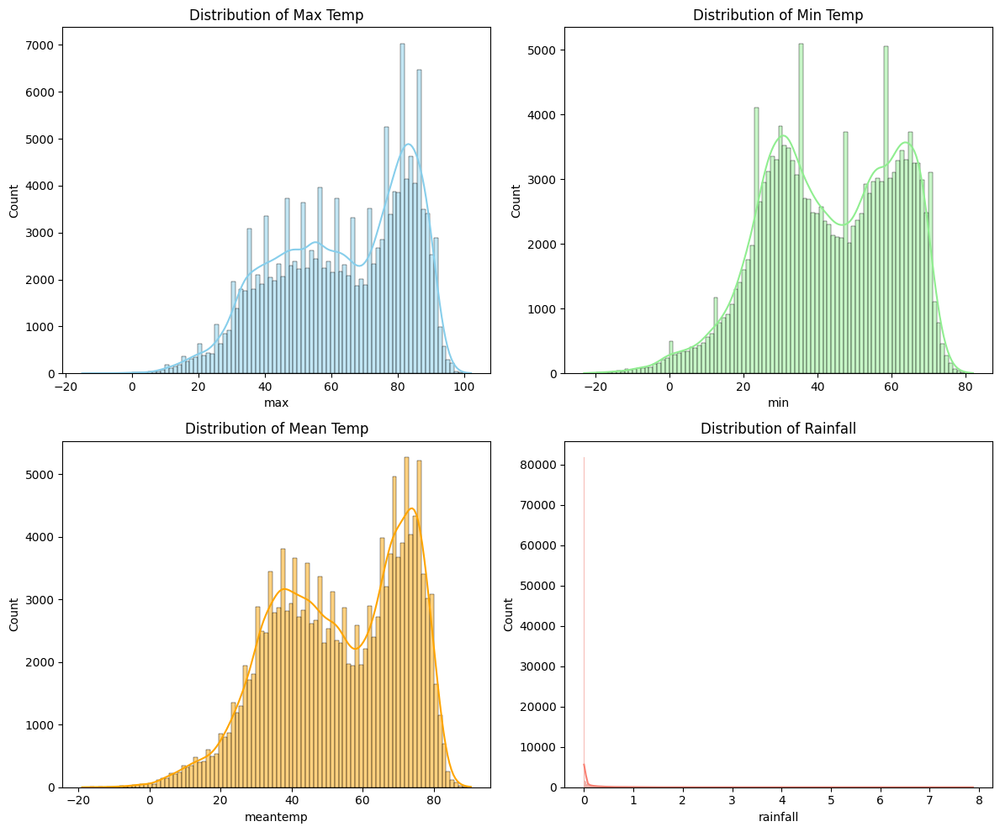

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the sample data (replace with actual dataset)



# Plot distribution for each variable
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
sns.histplot(df_merged_alls['max'], kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Distribution of Max Temp')

sns.histplot(df_merged_alls['min'], kde=True, ax=axes[0, 1], color='lightgreen')
axes[0, 1].set_title('Distribution of Min Temp')

sns.histplot(df_merged_alls['meantemp'], kde=True, ax=axes[1, 0], color='orange')
axes[1, 0].set_title('Distribution of Mean Temp')

sns.histplot(df_merged_alls['rainfall'], kde=True, ax=axes[1, 1], color='salmon')
axes[1, 1].set_title('Distribution of Rainfall')

plt.tight_layout()
plt.show()


## With weatherstation locations:   lets make another dataset


In [ ]:
all_colected_precip = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/merged_precip.csv')

In [ ]:
all_colected_precip

,Date,Station Name,County,lon,lat,data
0,2016-01-01,BERNE WWTP,ADAMS,-84.93000,40.66830,0.0
1,2016-01-02,BERNE WWTP,ADAMS,-84.93000,40.66830,0.0
2,2016-01-03,BERNE WWTP,ADAMS,-84.93000,40.66830,0.0
3,2016-01-04,BERNE WWTP,ADAMS,-84.93000,40.66830,0.0
4,2016-01-05,BERNE WWTP,ADAMS,-84.93000,40.66830,NaN
...,...,...,...,...,...,...
2592886,2024-12-27,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,NaN
2592887,2024-12-28,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,NaN
2592888,2024-12-29,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,NaN
2592889,2024-12-30,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,NaN


In [ ]:
all_colected_precip.isna().sum()

,0
Date,0
Station Name,0
County,0
lon,29226
lat,29226
data,1280470


In [ ]:
import pandas as pd

# Assuming your DataFrame is named df and has a 'Date' column in datetime format
all_colected_precip['Date'] = pd.to_datetime(all_colected_precip['Date'])  # Ensure 'Date' is in datetime format

# Filter out rows from the year 2024
df_filtered = all_colected_precip[all_colected_precip['Date'].dt.year != 2024]

# Display the updated DataFrame
print(f"Original dataset size: {len(all_colected_precip)} rows")
print(f"Filtered dataset size (without 2024 data): {len(df_filtered)} rows")

# Check to confirm removal of 2024 data
print("\nFiltered DataFrame without data from 2024:")
df_filtered


Original dataset size: 2592891 rows
Filtered dataset size (without 2024 data): 2413572 rows

Filtered DataFrame without data from 2024:


,Date,Station Name,County,lon,lat,data
0,2016-01-01,BERNE WWTP,ADAMS,-84.93000,40.66830,0.00
1,2016-01-02,BERNE WWTP,ADAMS,-84.93000,40.66830,0.00
2,2016-01-03,BERNE WWTP,ADAMS,-84.93000,40.66830,0.00
3,2016-01-04,BERNE WWTP,ADAMS,-84.93000,40.66830,0.00
4,2016-01-05,BERNE WWTP,ADAMS,-84.93000,40.66830,NaN
...,...,...,...,...,...,...
2592520,2023-12-27,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,0.00
2592521,2023-12-28,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,0.10
2592522,2023-12-29,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,0.08
2592523,2023-12-30,TRI-LAKES 3.0 N,WHITLEY,-85.48557,41.26472,0.09


In [ ]:
import pandas as pd
import numpy as np
from geopy.distance import geodesic
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Sample data
#df_filtered = pd.read_csv('/path/to/your/data.csv')  # Adjust this path
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

# Step 1: Extract 2500 random non-NaN rows
df_non_nan = df_filtered.dropna(subset=['data'])
df_sample = df_non_nan.sample(n=2500, random_state=42)

# Keep a copy of the actual 'data' values before removing them
actual_values = df_sample['data'].copy()

# Simulate missing data in the selected rows
df_filtered.loc[df_sample.index, 'data'] = np.nan

# Step 2: Prepare the custom spatio-temporal distance function
def custom_spatio_temporal_distance(X1, X2):
    # Calculate geodesic distance for spatial components (lat, lon)
    spatial_distance = geodesic((X1[0], X1[1]), (X2[0], X2[1])).km
    # Temporal distance based on date_ordinal
    temporal_distance = abs(X1[2] - X2[2])
    return spatial_distance + temporal_distance

# Step 3: Implement Custom KNN Model using the custom distance metric
class SpatioTemporalKNN(KNeighborsRegressor):
    def __init__(self, n_neighbors=5):
        super().__init__(n_neighbors=n_neighbors, metric=self.custom_distance)

    @staticmethod
    def custom_distance(X1, X2):
        return np.array([[custom_spatio_temporal_distance(x1, x2) for x2 in X2] for x1 in X1])

# Prepare training data: rows where 'data' is not NaN
df_train = df_filtered.dropna(subset=['data', 'lat', 'lon', 'Date'])

# Convert dates to ordinal for temporal distance
df_train['date_ordinal'] = df_train['Date'].map(lambda x: x.toordinal())
df_sample['date_ordinal'] = df_sample['Date'].map(lambda x: x.toordinal())

# Prepare features and labels for training
X_train = df_train[['lat', 'lon', 'date_ordinal']].values
y_train = df_train['data'].values

# Prepare test features (with missing data)
X_test = df_sample[['lat', 'lon', 'date_ordinal']].values

# Step 4: Apply the KNN model and impute missing values
knn_model = SpatioTemporalKNN(n_neighbors=5)
knn_model.fit(X_train, y_train)
y_imputed = knn_model.predict(X_test)

# Step 5: Compare imputed values with actual values

# Calculate R-squared between imputed and actual values
r_squared = r2_score(actual_values, y_imputed)
print(f"R-squared value: {r_squared:.4f}")

# Step 6: Plot the fitted curve
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, y_imputed, alpha=0.5, label='Imputed vs Actual')
plt.plot([min(actual_values), max(actual_values)], [min(actual_values), max(actual_values)], color='red', label='Perfect Fit')
plt.title(f'Comparison of Imputed vs Actual Precipitation\nR-squared = {r_squared:.4f}')
plt.xlabel('Actual Precipitation (mm)')
plt.ylabel('Imputed Precipitation (mm)')
plt.legend()
plt.grid(True)
plt.show()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


IndexError: invalid index to scalar variable.

In [ ]:
import pandas as pd
import random
from meteostat import Point, Daily
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Load the dataset
data_path = '/content/drive/MyDrive/yield_classification/all_reshaped/merged_precip.csv'
df = pd.read_csv(data_path)

# Drop rows where 'data' (precipitation) is NaN
df_clean = df.dropna(subset=['data'])

# Step 1: Randomly select 2000 rows from the dataset
random_rows = df_clean.sample(n=2000, random_state=42)

# Step 2: Define a function to fetch weather data for selected rows using Meteostat
def fetch_weather_for_random_rows(random_rows):
    fetched_data = []
    start = datetime(2016, 1, 1)
    end = datetime(2023, 12, 31)

    for _, row in random_rows.iterrows():
        county = row['County']
        lat = row['lat']
        lon = row['lon']

        # Create a Meteostat Point object for the location
        loc = Point(lat, lon, 230)  # Elevation is set to 230m, adjust as needed

        # Fetch daily weather data for the selected time period
        data = Daily(loc, start, end).fetch()

        # We're interested in precipitation (prcp)
        if 'prcp' in data.columns:
            prcp_data = data['prcp'].values[:2000]  # Limit to the 2000 samples or modify accordingly
            for date, prcp in zip(data.index, prcp_data):
                fetched_data.append({
                    'Date': date,
                    'County': county,
                    'Fetched_Precip': prcp,
                    'Original_Precip': row['data']
                })

    # Convert the fetched data into a DataFrame
    fetched_df = pd.DataFrame(fetched_data)
    return fetched_df

# Step 3: Fetch data for the random rows
fetched_df = fetch_weather_for_random_rows(random_rows)

# Step 4: Merge the fetched data with the original data for comparison
# Ensure 'Date' in both DataFrames is of datetime type for accurate comparison
fetched_df['Date'] = pd.to_datetime(fetched_df['Date'])
random_rows['Date'] = pd.to_datetime(random_rows['Date'])

# Merge the original and fetched data on Date and County
comparison_df = pd.merge(random_rows, fetched_df[['Date', 'County', 'Fetched_Precip']], on=['Date', 'County'], how='inner')

# Step 5:


In [ ]:
comparison_df

,Date,Station Name,County,lon,lat,data,Fetched_Precip
0,2016-10-05,WAKARUSA 2.4 NNE,ELKHART,-85.9933,41.56551,0.0,1.0
1,2016-10-05,WAKARUSA 2.4 NNE,ELKHART,-85.9933,41.56551,0.0,1.0
2,2016-10-05,WAKARUSA 2.4 NNE,ELKHART,-85.9933,41.56551,0.0,1.0
3,2016-10-05,WAKARUSA 2.4 NNE,ELKHART,-85.9933,41.56551,0.0,1.0
4,2016-10-05,WAKARUSA 2.4 NNE,ELKHART,-85.9933,41.56551,0.0,1.0
...,...,...,...,...,...,...,...
49513,2016-04-29,FORT WAYNE,ALLEN,-85.1569,41.20170,0.0,0.0
49514,2016-04-29,FORT WAYNE,ALLEN,-85.1569,41.20170,0.0,0.0
49515,2016-04-29,FORT WAYNE,ALLEN,-85.1569,41.20170,0.0,0.0
49516,2016-04-29,FORT WAYNE,ALLEN,-85.1569,41.20170,0.0,0.0


In [ ]:
comparison_df.isna().sum()

,0
Date,0
Station Name,0
County,0
lon,1986
lat,1986
data,0
Fetched_Precip,13011


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


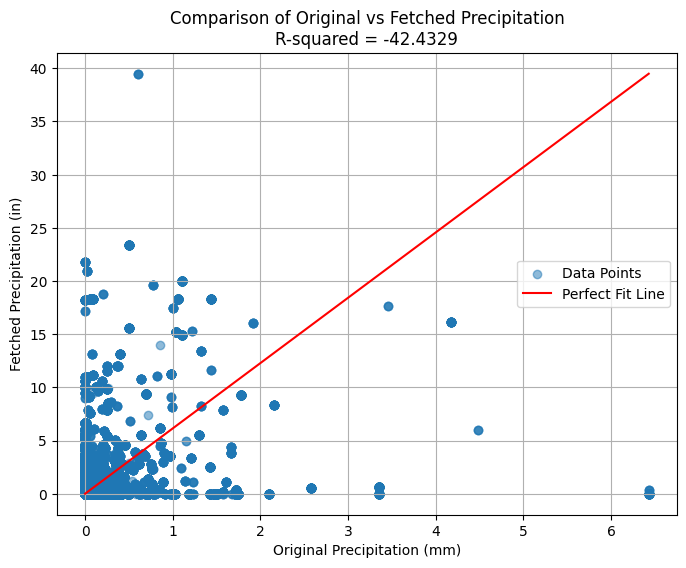

R-squared value: -42.4329


In [ ]:
import pandas as pd
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Assuming 'comparison_df' is already created

# Convert 'Fetched_Precip' from cm to in (1 cm = 0.393701 in)
comparison_df['Fetched_Precip'] = comparison_df['Fetched_Precip'] * 0.393701

# Drop rows where either 'data' (Original Precipitation) or 'Fetched_Precip' is NaN
comparison_df_cleaned = comparison_df.dropna(subset=['data', 'Fetched_Precip'])

# Step 5: Calculate R-squared between 'data' (original precipitation) and 'Fetched_Precip'
r_squared = r2_score(comparison_df_cleaned['data'], comparison_df_cleaned['Fetched_Precip'])

# Step 6: Plot the fitted curve (X-axis: Original, Y-axis: Fetched Precipitation)
plt.figure(figsize=(8, 6))
plt.scatter(comparison_df_cleaned['data'], comparison_df_cleaned['Fetched_Precip'], alpha=0.5, label='Data Points')
plt.plot([0, max(comparison_df_cleaned['data'])], [0, max(comparison_df_cleaned['Fetched_Precip'])], color='red', label='Perfect Fit Line')

plt.title(f'Comparison of Original vs Fetched Precipitation\nR-squared = {r_squared:.4f}')
plt.xlabel('Original Precipitation (mm)')
plt.ylabel('Fetched Precipitation (in)')
plt.legend()
plt.grid(True)
plt.show()

# Print the R-squared value
print(f"R-squared value: {r_squared:.4f}")


In [ ]:
!pip install pyPRISMClimate

In [ ]:
import pandas as pd

# Load your dataset into a DataFrame (assuming it's named df)
# For this example, we'll assume your DataFrame is already loaded as 'df'

# Check for missing latitude or longitude
missing_lat_lon = df_filtered[df_filtered['lat'].isna() | df_filtered['lon'].isna()]

# Display rows with missing latitude or longitude
print("Rows with missing latitude or longitude:")
print(missing_lat_lon)

# Check if missing values are from the same county
counties_with_missing = missing_lat_lon['County'].unique()
print("\nCounties with missing latitude or longitude:")
print(counties_with_missing)

# Check if missing values are from the same weather station
stations_with_missing = missing_lat_lon['Station Name'].unique()
print("\nWeather stations with missing latitude or longitude:")
print(stations_with_missing)

# Check if missing values have the same data value
data_values_with_missing = missing_lat_lon['data'].unique()
print("\nData values with missing latitude or longitude:")
print(data_values_with_missing)

# Group by County, Station Name, and Data to see patterns
missing_groups = missing_lat_lon.groupby(['County', 'Station Name', 'data']).size().reset_index(name='Count')
print("\nGrouped missing values by County, Station Name, and Data:")
print(missing_groups)


Rows with missing latitude or longitude:
              Date          Station Name      County  lon  lat  data
867834  2016-01-01  HUNTINGTON 1.2 ENE.1  HUNTINGTON  NaN  NaN  0.00
867835  2016-01-02  HUNTINGTON 1.2 ENE.1  HUNTINGTON  NaN  NaN  0.00
867836  2016-01-03  HUNTINGTON 1.2 ENE.1  HUNTINGTON  NaN  NaN  0.00
867837  2016-01-04  HUNTINGTON 1.2 ENE.1  HUNTINGTON  NaN  NaN  0.07
867838  2016-01-05  HUNTINGTON 1.2 ENE.1  HUNTINGTON  NaN  NaN  0.01
...            ...                   ...         ...  ...  ...   ...
1868461 2023-12-27  VALPARAISO 5.5 SSW.1      PORTER  NaN  NaN  0.00
1868462 2023-12-28  VALPARAISO 5.5 SSW.1      PORTER  NaN  NaN  0.03
1868463 2023-12-29  VALPARAISO 5.5 SSW.1      PORTER  NaN  NaN  0.25
1868464 2023-12-30  VALPARAISO 5.5 SSW.1      PORTER  NaN  NaN  0.02
1868465 2023-12-31  VALPARAISO 5.5 SSW.1      PORTER  NaN  NaN  0.00

[26298 rows x 6 columns]

Counties with missing latitude or longitude:
['HUNTINGTON' 'KNOX' 'LAKE' 'MARION' 'PORTER']

Weather sta

SyntaxError: invalid syntax (<ipython-input-16-dd6ed02d91c9>, line 1)

In [ ]:
df_filtered_knox = all_colected_precip[all_colected_precip['County']== 'LAKE']
df_filtered_knox['Station Name'].unique()

array(['(W9MAL) MERRILLVILLE 2.0 NNW', '(W9MAL)MERRILLVILLE 2.0 NNW',
       'CROWN POINT 1.1 N', 'CROWN POINT 1N', 'CROWN POINT 2.0 WSW',
       'DYER 1.0 WNW', 'GARY 4.1 SSW', 'GARY 4.8 ENE', 'GARY 6.2 ENE',
       'GRIFFITH 1.2 N', 'GRIFFITH 1.2 N.1', 'GRIFFITH 1.2 N.2',
       'GRIFFITH 1.2 N.3', 'HAMMOND 0.6 SSW', 'HEBRON 3.0 SSW',
       'HEBRON 4.3 SSW', 'HEBRON 6.0 SSW', 'HIGHLAND 0.7 ESE',
       'HOBART 0.7 NNW', 'HOBART 1.0 E', 'HOBART 1.1 S', 'HOBART 1.6 E',
       'HOBART 2.4 SE', 'LOWELL 3.1 NNW', 'LOWELL WWTP',
       'MUNSTER 1.5 NNW', 'SCHERERVILLE 1.1 E', 'SCHERERVILLE 1.4 E',
       'ST. JOHN 0.2 WSW', 'ST. JOHN 2.8 SE', 'WINFIELD 1.2 NE'],
      dtype=object)

##  First step of fusing done. now kriging will be done/spatial KNN


In [ ]:
df1_merged = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/merged_all_less_missing.csv')

In [ ]:
df1_merged

,date,county,max,min,meantemp,rainfall
0,2016-01-01,ALLEN,29.500000,24.500000,27.000000,0.000000
1,2016-01-01,MARTIN,31.000000,25.000000,28.000000,0.000000
2,2016-01-01,MONROE,34.333333,24.333333,29.333333,0.000000
3,2016-01-01,MONTGOMERY,29.000000,23.000000,26.000000,0.000000
4,2016-01-01,MORGAN,31.000000,25.000000,28.000000,0.000000
...,...,...,...,...,...,...
155224,2023-12-31,HUNTINGTON,37.000000,33.000000,35.000000,0.000000
155225,2023-12-31,HOWARD,35.000000,30.000000,32.500000,0.000000
155226,2023-12-31,HENRY,36.000000,32.000000,34.000000,0.012598
155227,2023-12-31,HANCOCK,36.000000,32.000000,34.000000,0.002857


In [ ]:
df1_merged.isna().sum()

,0
date,0
county,0
max,38
min,38
meantemp,40
rainfall,184


In [ ]:

## Remove duplicates for the entire dataset
df1_cleaned = df1_merged.drop_duplicates()

# Check for any remaining duplicates
duplicates_remaining = df1_cleaned.duplicated().sum()

# Display the results
print(f"Number of duplicates removed: {len(df1_merged) - len(df1_cleaned)}")
print(f"Number of duplicates remaining: {duplicates_remaining}")

# Display the cleaned DataFrame
print(df1_cleaned.head())



Number of duplicates removed: 0
Number of duplicates remaining: 0
         date      county        max        min   meantemp  rainfall
0  2016-01-01       ALLEN  29.500000  24.500000  27.000000       0.0
1  2016-01-01      MARTIN  31.000000  25.000000  28.000000       0.0
2  2016-01-01      MONROE  34.333333  24.333333  29.333333       0.0
3  2016-01-01  MONTGOMERY  29.000000  23.000000  26.000000       0.0
4  2016-01-01      MORGAN  31.000000  25.000000  28.000000       0.0


In [ ]:
# Aggregate duplicates by taking the mean rainfall for the same 'date' and 'county'
df1_cleaned_whole = df1_cleaned.groupby(['date', 'county'], as_index=False).agg({
    'rainfall': 'mean','max': 'mean', 'min': 'mean', 'meantemp':'mean'  # Example: take the mean of 'rainfall' for duplicate 'date' and 'county'
    # Add more columns if needed, using an appropriate aggregation function
    # Example: 'temperature': 'mean'
})

# Check for any remaining duplicates based on 'date' and 'county'
duplicates_remaining = df1_cleaned_whole.duplicated(subset=['date', 'county']).sum()

# Display the cleaned DataFrame and check for duplicates
print(f"Number of duplicates removed: {len(df1_cleaned) - len(df1_cleaned_whole)}")
print(f"Number of duplicates remaining for 'date' and 'county': {duplicates_remaining}")

# Display the cleaned DataFrame

df1_cleaned_whole

Number of duplicates removed: 363
Number of duplicates remaining for 'date' and 'county': 0


,date,county,rainfall,max,min,meantemp
0,2016-01-01,ALLEN,0.000000,29.500,24.500,27.000
1,2016-01-01,BARTHOLOMEW,0.000000,32.000,27.000,29.500
2,2016-01-01,BLACKFORD,0.000000,32.000,24.000,28.000
3,2016-01-01,BOONE,0.000000,29.500,23.000,26.250
4,2016-01-01,CASS,0.000000,30.500,24.000,27.250
...,...,...,...,...,...,...
154861,2023-12-31,WABASH,0.010000,36.500,31.000,33.750
154862,2023-12-31,WAYNE,0.020000,37.000,26.000,31.500
154863,2023-12-31,WELLS,0.003333,36.428,31.208,33.872
154864,2023-12-31,WHITE,0.030000,37.000,33.000,35.000


In [ ]:
df1_cleaned_whole.isna().sum()

,0
date,0
county,0
rainfall,184
max,38
min,38
meantemp,40


In [ ]:
# Load the county shapefile using GeoPandas
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"  # Update with the correct path to your shapefile
gdf = gpd.read_file(shapefile_path)

# Ensure that the county names are in the same format in both datasets
gdf['county'] = gdf['NAME_U'].str.upper()  # Assuming 'NAME_U' is the county name column in the shapefile
gdf = gdf[['county', 'geometry']]  # Keep only relevant columns

# Merge the weather DataFrame with the GeoDataFrame on the 'county' column
working_df = pd.merge(df1_cleaned_whole, gdf, on='county', how='left')

# The 'geometry' column now contains the boundary information for each county
print(working_df.head())

# Check if there are any counties without boundary information
missing_boundaries = working_df[working_df['geometry'].isna()]
if not missing_boundaries.empty:
    print("\nCounties with missing boundary information:")
    print(missing_boundaries['county'].unique())



         date       county  rainfall   max   min  meantemp  \
0  2016-01-01        ALLEN       0.0  29.5  24.5     27.00   
1  2016-01-01  BARTHOLOMEW       0.0  32.0  27.0     29.50   
2  2016-01-01    BLACKFORD       0.0  32.0  24.0     28.00   
3  2016-01-01        BOONE       0.0  29.5  23.0     26.25   
4  2016-01-01         CASS       0.0  30.5  24.0     27.25   

                                            geometry  
0  POLYGON ((683957.193 4571167.612, 684008.133 4...  
1  POLYGON ((611712.61 4356425.761, 613353.302 43...  
2  POLYGON ((652152.259 4492278.296, 652282.387 4...  
3  POLYGON ((564505.713 4448101.924, 564520.789 4...  
4  POLYGON ((569986.858 4529037.851, 570028.393 4...  


In [ ]:
working_df.isna().sum()

,0
date,0
county,0
rainfall,184
max,38
min,38
meantemp,40
geometry,0


In [ ]:
working_df.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/working_df.csv')

In [ ]:
import pandas as pd
import geopandas as gpd
from sklearn.impute import KNNImputer
from sklearn.neighbors import KNeighborsRegressor
from geopy.distance import geodesic
from datetime import datetime

# Load the dataset
working_df = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/working_df.csv')

# Step 1: Ensure 'date' column is in datetime format
working_df['date'] = pd.to_datetime(working_df['date'])

# Step 2: Convert to GeoDataFrame
working_df = gpd.GeoDataFrame(working_df, geometry=gpd.GeoSeries.from_wkt(working_df['geometry']))

# Step 3: Check and reproject CRS if necessary
# If the CRS is None or not geographic (like EPSG:4326), reproject to lat/lon
if working_df.crs is None or not working_df.crs.is_geographic:
    # Assuming the original CRS is projected (e.g., UTM or state plane), we reproject to EPSG:4326
    working_df = working_df.set_crs('EPSG:4326', allow_override=True)
# Check the current CRS of the GeoDataFrame
print(working_df.crs)



# After reprojecting, the 'geometry' column will be in lat/lon (degrees)
print(working_df.crs)

# # Step 2: Calculate the centroid of each county (spatial aspect)
# working_df['centroid'] = working_df['geometry'].centroid
# working_df['centroid_lon'] = working_df['centroid'].apply(lambda x: x.x)
# working_df['centroid_lat'] = working_df['centroid'].apply(lambda x: x.y)

# # Step 3: Handle missing rainfall data
# missing_rainfall = working_df[working_df['rainfall'].isna()]
# non_missing_rainfall = working_df[~working_df['rainfall'].isna()]

# # Step 4: Define a custom spatio-temporal distance metric
# def custom_spatio_temporal_distance(X1, X2):
#     spatial_distance = geodesic((X1[0], X1[1]), (X2[0], X2[1])).km  # Spatial distance using geodesic
#     temporal_distance = abs((X1[2] - X2[2]).days)  # Temporal distance in days
#     return spatial_distance + temporal_distance

# # Step 5: Prepare data for KNN
# X_train = non_missing_rainfall[['centroid_lat', 'centroid_lon', 'date']]
# X_test = missing_rainfall[['centroid_lat', 'centroid_lon', 'date']]

# # Convert date to ordinal for numerical processing
# X_train['date'] = X_train['date'].apply(lambda x: x.toordinal())
# X_test['date'] = X_test['date'].apply(lambda x: x.toordinal())

# y_train = non_missing_rainfall['rainfall']

# # Step 6: Implement KNeighborsRegressor with a custom distance function
# knn_model = KNeighborsRegressor(n_neighbors=5, metric=custom_spatio_temporal_distance)
# knn_model.fit(X_train, y_train)

# # Step 7: Predict missing rainfall values
# y_pred = knn_model.predict(X_test)

# # Step 8: Fill in the missing rainfall values in the original dataframe
# working_df.loc[working_df['rainfall'].isna(), 'rainfall'] = y_pred

# # Display the updated dataframe with imputed rainfall values
# print(working_df.head())

# # Optional: Save the updated dataframe to a new file
# working_df.to_csv('working_df_with_imputed_rainfall.csv', index=False)



EPSG:4326
EPSG:4326


In [ ]:
working_df.isna().sum()

,0
Unnamed: 0,0
date,0
county,0
rainfall,184
max,38
min,38
meantemp,40
geometry,0


In [ ]:
# Recalculate the centroid after reprojecting
working_df['centroid'] = working_df['geometry'].centroid

# Extract the longitude and latitude from the centroid
working_df['centroid_lon'] = working_df['centroid'].apply(lambda x: x.x)
working_df['centroid_lat'] = working_df['centroid'].apply(lambda x: x.y)

# Preview the updated data
print(working_df[['county', 'centroid', 'centroid_lon', 'centroid_lat']].head())


        county                            centroid   centroid_lon  \
0        ALLEN  POINT (662385.47677 4550643.22444)  662385.476770   
1  BARTHOLOMEW  POINT (595178.92288 4340211.67834)  595178.922878   
2    BLACKFORD  POINT (642008.40905 4481668.38069)  642008.409053   
3        BOONE    POINT (545320.7227 4433531.9879)  545320.722697   
4         CASS    POINT (555216.5125 4512474.7287)  555216.512502   

   centroid_lat  
0  4.550643e+06  
1  4.340212e+06  
2  4.481668e+06  
3  4.433532e+06  
4  4.512475e+06  


In [ ]:
working_df.isna().sum()

,0
Unnamed: 0,0
date,0
county,0
rainfall,184
max,38
min,38
meantemp,40
geometry,0
centroid,0
centroid_lon,0


In [ ]:
from sklearn.metrics.pairwise import haversine_distances
from datetime import datetime

# Step 1: Prepare features for KNN (Spatial and Temporal)
def prepare_features(df):
    # Convert date to an integer representing the number of days since a reference date (e.g., 1970-01-01)
    df['date_numeric'] = pd.to_datetime(df['date']).map(lambda d: (d - datetime(1970, 1, 1)).days)

    # Combine spatial (longitude, latitude) and temporal (date_numeric) aspects into feature matrix
    X = df[['centroid_lon', 'centroid_lat', 'date_numeric']].values
    return X

# # Prepare the features and target
# X = prepare_features(working_df)
# y = working_df['rainfall'].values

# Step 2: Create KNN Imputer with a custom distance metric
def custom_spatio_temporal_distance(X1, X2):
    spatial_distance = haversine_distances([X1[:2]], [X2[:2]])[0][0]  # Haversine for spatial distance
    temporal_distance = abs(X1[2] - X2[2])  # Absolute difference in time
    return spatial_distance + temporal_distance

# Apply the KNN model for the imputation
def knn_spatio_temporal(X_train, y_train, X_test):
    knn = KNeighborsRegressor(n_neighbors=5, metric=custom_spatio_temporal_distance)
    knn.fit(X_train, y_train)
    return knn

# # Step 3: Handle missing data (impute)
# # Separate rows with and without missing data in 'rainfall'
# non_nan_rows = working_df.dropna(subset=['rainfall'])
# nan_rows = working_df[working_df['rainfall'].isna()]

# # Split data into training and testing (missing) sets
# X_train = prepare_features(non_nan_rows)
# y_train = non_nan_rows['rainfall'].values
# X_test = prepare_features(nan_rows)

# # Apply KNN model and impute missing values
# knn_model = knn_spatio_temporal(X_train, y_train, X_test)
# y_imputed = knn_model.predict(X_test)

# # Fill the missing values in the original dataframe
# working_df.loc[working_df['rainfall'].isna(), 'rainfall'] = y_imputed

# # Step 4: Validate the imputation
# print(f'Number of missing values after imputation: {working_df["rainfall"].isna().sum()}')


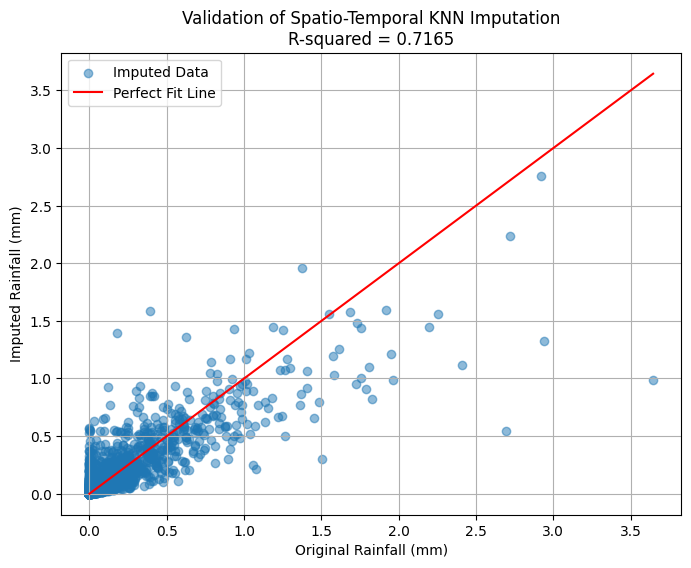

R-squared value: 0.7165


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Step 1: Randomly select 2500 rows with non-NaN values for validation
validation_set = working_df.dropna(subset=['rainfall']).sample(n=2500, random_state=42)

# Step 2: Set these 2500 rows as missing in the original data to test imputation
working_df.loc[validation_set.index, 'rainfall'] = np.nan

# Step 3: Re-apply the KNN imputation
X_test_validation = prepare_features(working_df.loc[validation_set.index])
y_test_imputed = knn_model.predict(X_test_validation)

# Step 4: Compare original vs imputed values using R-squared and plot
r_squared = r2_score(validation_set['rainfall'], y_test_imputed)

plt.figure(figsize=(8, 6))
plt.scatter(validation_set['rainfall'], y_test_imputed, alpha=0.5, label='Imputed Data')
plt.plot([0, max(validation_set['rainfall'])], [0, max(validation_set['rainfall'])], color='red', label='Perfect Fit Line')

plt.title(f'Validation of Spatio-Temporal KNN Imputation\nR-squared = {r_squared:.4f}')
plt.xlabel('Original Rainfall (mm)')
plt.ylabel('Imputed Rainfall (mm)')
plt.legend()
plt.grid(True)
plt.show()

# Print R-squared for the imputation
print(f"R-squared value: {r_squared:.4f}")


In [ ]:
# Step 1: Prepare the features for KNN (Spatial and Temporal)
# (Already done, so we skip redoing it)

# Step 2: Create a generalized imputation function
def knn_spatio_temporal_impute(working_df, column):
    """
    Generalized function to perform KNN imputation for a given column.
    """
    # Separate rows with and without missing data for the specified column
    non_nan_rows = working_df.dropna(subset=[column])
    nan_rows = working_df[working_df[column].isna()]

    # Split data into training and testing (missing) sets
    X_train = prepare_features(non_nan_rows)
    y_train = non_nan_rows[column].values
    X_test = prepare_features(nan_rows)

    # Apply KNN model and impute missing values
    knn_model = knn_spatio_temporal(X_train, y_train, X_test)
    y_imputed = knn_model.predict(X_test)

    # Fill the missing values in the original dataframe
    working_df.loc[working_df[column].isna(), column] = y_imputed

    print(f'Number of missing values in {column} after imputation: {working_df[column].isna().sum()}')

# Step 3: Impute missing values for 'min', 'max', and 'meantemp' columns
columns_to_impute = ['min', 'max', 'meantemp','rainfall']

for column in columns_to_impute:
    knn_spatio_temporal_impute(working_df, column)

# Validate the final dataset
print(working_df[['min', 'max', 'meantemp', 'rainfall']].isna().sum())


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Number of missing values in min after imputation: 0


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Number of missing values in max after imputation: 0


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Number of missing values in meantemp after imputation: 0


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Number of missing values in rainfall after imputation: 0
min         0
max         0
meantemp    0
rainfall    0
dtype: int64


In [ ]:
working_df.duplicated().sum()

0

In [ ]:
working_df.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/working_df_final.csv')

In [ ]:
working_df


,Unnamed: 0,date,county,rainfall,max,min,meantemp,geometry,centroid,centroid_lon,centroid_lat
0,0,2016-01-01,ALLEN,0.000000,29.500,24.500,27.000,"POLYGON ((683957.1934 4571167.61181, 684008.13...",POINT (662385.47677 4550643.22444),662385.476770,4.550643e+06
1,1,2016-01-01,BARTHOLOMEW,0.000000,32.000,27.000,29.500,"POLYGON ((611712.61016 4356425.76096, 613353.3...",POINT (595178.92288 4340211.67834),595178.922878,4.340212e+06
2,2,2016-01-01,BLACKFORD,0.000000,32.000,24.000,28.000,"POLYGON ((652152.2592 4492278.29554, 652282.38...",POINT (642008.40905 4481668.38069),642008.409053,4.481668e+06
3,3,2016-01-01,BOONE,0.000000,29.500,23.000,26.250,"POLYGON ((564505.71299 4448101.92441, 564520.7...",POINT (545320.7227 4433531.9879),545320.722697,4.433532e+06
4,4,2016-01-01,CASS,0.000000,30.500,24.000,27.250,"POLYGON ((569986.85838 4529037.85125, 570028.3...",POINT (555216.5125 4512474.7287),555216.512502,4.512475e+06
...,...,...,...,...,...,...,...,...,...,...,...
154861,154861,2023-12-31,WABASH,0.010000,36.500,31.000,33.750,"POLYGON ((610584.79926 4544679.39322, 610638.9...",POINT (601665.38381 4522320.77752),601665.383810,4.522321e+06
154862,154862,2023-12-31,WAYNE,0.020000,37.000,26.000,31.500,"POLYGON ((685238.48187 4430629.06511, 686865.0...",POINT (670221.54168 4414607.66045),670221.541681,4.414608e+06
154863,154863,2023-12-31,WELLS,0.003333,36.428,31.208,33.872,"POLYGON ((662154.48157 4531421.78882, 662194.5...",POINT (650208.83428 4510205.10532),650208.834283,4.510205e+06
154864,154864,2023-12-31,WHITE,0.030000,37.000,33.000,35.000,"POLYGON ((518916.12424 4529062.07686, 520462.7...",POINT (511346.52178 4510981.38744),511346.521777,4.510981e+06


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

# Step 1: Mask some known values for validation
def mask_known_values(df, variable, missing_percentage=0.2):
    """
    Randomly mask a percentage of known values in the specified variable column for validation.
    """
    df_copy = df.copy()
    mask = np.random.rand(len(df_copy)) < missing_percentage
    # Store the actual values for comparison later
    df_copy[f'{variable}_actual'] = df_copy[variable].copy()
    # Mask a percentage of known values
    df_copy.loc[mask, variable] = np.nan
    return df_copy, mask

# Step 2: Run KNN imputation for masked values
def impute_and_validate(df, variable, knn_function):
    """
    Impute missing values using the spatio-temporal KNN model and compare with the actual known values.
    """
    # Apply the imputation on the masked dataset
    non_nan_rows = df.dropna(subset=[variable])
    nan_rows = df[df[variable].isna()]

    X_train = prepare_features(non_nan_rows)
    y_train = non_nan_rows[variable].values
    X_test = prepare_features(nan_rows)

    # Apply KNN imputation
    knn_model = knn_function(X_train, y_train, X_test)
    y_imputed = knn_model.predict(X_test)

    # Store the imputed values back in the dataframe
    df.loc[df[variable].isna(), f'{variable}_imputed'] = y_imputed

    return df

# Step 3: Validation metrics
def evaluate_imputation(df, variable):
    """
    Calculate the R-squared and RMSE between the actual and imputed values for validation.
    """
    actual_values = df[f'{variable}_actual'].dropna()
    imputed_values = df.loc[actual_values.index, f'{variable}_imputed']

    r_squared = r2_score(actual_values, imputed_values)
    rmse = np.sqrt(mean_squared_error(actual_values, imputed_values))

    print(f"Validation for {variable}:")
    print(f"R-squared: {r_squared:.4f}")
    print(f"RMSE: {rmse:.4f}")
    return r_squared, rmse

# Step 4: Perform the validation on the working_df
variables_to_validate = ['min', 'max', 'meantemp', 'rainfall']
validation_results = {}

for variable in variables_to_validate:
    print(f"Validating {variable}...")

    # Mask a percentage of known values
    working_df_masked, mask = mask_known_values(working_df, variable, missing_percentage=0.2)

    # Impute the masked values
    working_df_masked = impute_and_validate(working_df_masked, variable, knn_spatio_temporal)

    # Evaluate the imputation
    r_squared, rmse = evaluate_imputation(working_df_masked, variable)
    validation_results[variable] = (r_squared, rmse)

# Print overall validation results
print("\nValidation Results Summary:")
for var, (r2, rmse) in validation_results.items():
    print(f"{var} - R-squared: {r2:.4f}, RMSE: {rmse:.4f}")


Validating min...


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import r2_score
from scipy.stats import linregress

# Step 5: Visualization of Imputed vs. Actual Values with Fitted Line
def visualize_imputation(df, variable):
    """
    Visualize the imputed vs. actual values with a fitted line for the variable.
    """
    actual_values = df[f'{variable}_actual'].dropna()
    imputed_values = df.loc[actual_values.index, f'{variable}_imputed']

    # Create the scatter plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=actual_values, y=imputed_values, alpha=0.5, label='Data Points')

    # Fit a regression line to the imputed vs actual values
    slope, intercept, r_value, p_value, std_err = linregress(actual_values, imputed_values)
    fitted_line = slope * actual_values + intercept

    # Plot the fitted line
    plt.plot(actual_values, fitted_line, color='red', label=f'Fitted Line (R² = {r2_score(actual_values, imputed_values):.4f})')

    # Plot the perfect fit line (45-degree diagonal)
    max_val = max(actual_values.max(), imputed_values.max())
    plt.plot([0, max_val], [0, max_val], color='green', linestyle='--', label='Perfect Fit')

    # Add labels, title, and legend
    plt.title(f'{variable.capitalize()} Imputation: Actual vs Imputed')
    plt.xlabel(f'Actual {variable}')
    plt.ylabel(f'Imputed {variable}')
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.show()

# Step 6: Apply the visualization for each variable
for variable in variables_to_validate:
    visualize_imputation(working_df_masked, variable)


In [ ]:
import pandas as pd
import geopandas as gpd
from esda.moran import Moran_Local
from pysal.lib import weights

# Assuming gdf_precip is already merged and includes relevant counties with 'geometry' and 'rainfall' columns
# Ensure rainfall data is numeric and handle NaNs appropriately
gdf_precip['rainfall'] = pd.to_numeric(gdf_precip['rainfall'], errors='coerce')
gdf_precip['rainfall'].fillna(0, inplace=True)

# Create spatial weights based on Queen contiguity
w = weights.Queen.from_dataframe(gdf_precip)
w.transform = 'r'  # Row-standardize the weights

# Calculate Local Moran's I using total precipitation
moran_local = Moran_Local(gdf_precip['rainfall'], w)

# Add Local Moran's I results to the GeoDataFrame
gdf_precip['local_moran_I'] = moran_local.Is  # Local Moran's I values
gdf_precip['p_value'] = moran_local.p_sim  # p-values
gdf_precip['cluster'] = moran_local.q  # Cluster labels: 1=HH, 2=LL, 3=LH, 4=HL


 There are 2 disconnected components.
 There is 1 island with id: 0.


('WARNING: ', 0, ' is an island (no neighbors)')


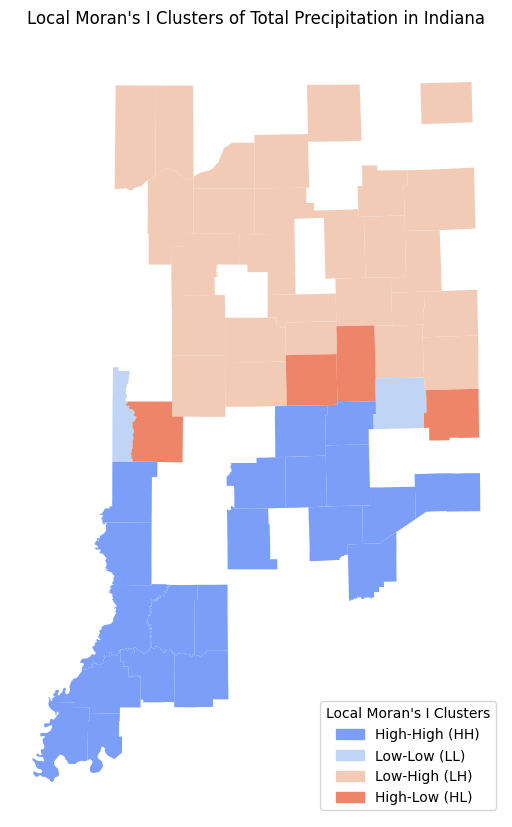

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches

# Define cluster labels
cluster_labels = {
    1: 'High-High (HH)',
    2: 'Low-Low (LL)',
    3: 'Low-High (LH)',
    4: 'High-Low (HL)'
}

# Map cluster labels for visualization
gdf_precip['cluster_label'] = gdf_precip['cluster'].map(cluster_labels)

# Set up the color map and boundaries
cmap = ListedColormap(sns.color_palette("coolwarm", 4).as_hex())
norm = BoundaryNorm([1, 2, 3, 4, 5], cmap.N)  # Adjust boundaries to match the cluster labels

# Set up the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot the map of Local Moran's I clusters
gdf_precip.plot(
    column='cluster',
    cmap=cmap,
    legend=False,  # Disable GeoPandas' legend to customize it manually
    ax=ax,
    missing_kwds={"color": "lightgrey", "label": "Missing data"}
)

# Create custom legend manually
patches = [
    mpatches.Patch(color=cmap(0), label='High-High (HH)'),
    mpatches.Patch(color=cmap(1), label='Low-Low (LL)'),
    mpatches.Patch(color=cmap(2), label='Low-High (LH)'),
    mpatches.Patch(color=cmap(3), label='High-Low (HL)')
]

# Add the legend to the plot
plt.legend(handles=patches, loc='lower right', title='Local Moran\'s I Clusters')

# Add a title to the plot
plt.title('Local Moran\'s I Clusters of Total Precipitation in Indiana')

# Remove axes for a cleaner look
plt.axis('off')

# Show the plot
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from esda.moran import Moran
from pysal.lib import weights

# Ensure rainfall data is numeric and handle NaN values in gdf_precip
gdf_precip['rainfall'] = pd.to_numeric(gdf_precip['rainfall'], errors='coerce')
gdf_precip['rainfall'].fillna(0, inplace=True)  # Replace NaNs with 0 for computation

# Create spatial weights based on Queen contiguity
w = weights.Queen.from_dataframe(gdf_precip)
w.transform = 'r'  # Row-standardize the weights

# Compute Global Moran's I for total precipitation
global_moran = Moran(gdf_precip['rainfall'], w)

# Print Global Moran's I results
print(f"Global Moran's I: {global_moran.I}")
print(f"p-value: {global_moran.p_sim}")
print(f"Expected I: {global_moran.EI}")
print(f"Standard deviation: {global_moran.z_sim}")


('WARNING: ', 0, ' is an island (no neighbors)')
Global Moran's I: 0.7837578282929619
p-value: 0.001
Expected I: -0.019230769230769232
Standard deviation: 7.672084558447658


 There are 2 disconnected components.
 There is 1 island with id: 0.


In [ ]:
indiana_boundary = gdf.dissolve()

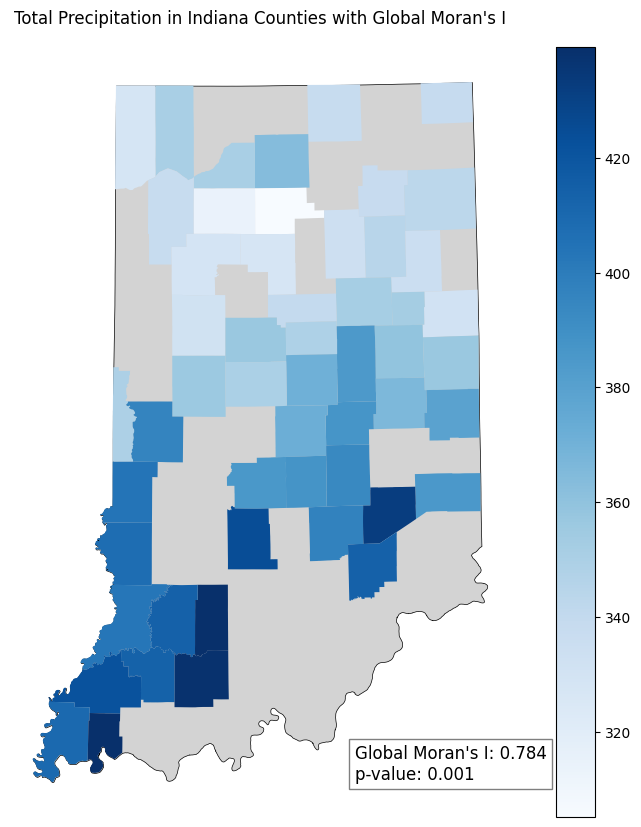

In [ ]:
#import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches

# Plotting the Map to Show Spatial Pattern of Rainfall
fig, ax = plt.subplots(figsize=(12, 10))
# Overlay the state boundary for context
indiana_boundary.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)
# Plot the total precipitation to visualize clustering or dispersion patterns
gdf_precip.plot(
    column='rainfall',
    cmap='Blues',  # Using a continuous color map to show precipitation levels
    legend=True,
    ax=ax,
    missing_kwds={"color": "lightgrey", "label": "Missing data"}
)



# Add the global Moran's I result to the map as a text box
plt.text(
    0.69, 0.049, f"Global Moran's I: {global_moran.I:.3f}\n"
               f"p-value: {global_moran.p_sim:.3f}",
    transform=ax.transAxes,
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.5)
)

# Add a title
plt.title('Total Precipitation in Indiana Counties with Global Moran\'s I')

# Remove axes for a cleaner look
plt.axis('off')

# Show the plot
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from esda.moran import Moran
from pysal.lib import weights

# Ensure 'rainfall' column is numeric, and handle NaNs appropriately
df1_cleaned_whole['rainfall'] = pd.to_numeric(df1_cleaned_whole['rainfall'], errors='coerce')  # Convert to numeric, setting non-numeric to NaN

# Extract year from date for grouping
df1_cleaned_whole['year'] = pd.to_datetime(df1_cleaned_whole['date']).dt.year

# Calculate total yearly rainfall for each county, ignoring NaNs
yearly_precip = df1_cleaned_whole.groupby(['county', 'year']).agg({'rainfall': 'sum'}).reset_index()

# Calculate the mean of yearly totals over the 8-year period for each county
mean_yearly_precip = yearly_precip.groupby('county').agg({'rainfall': 'mean'}).reset_index()

# Load the county shapefile using GeoPandas
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"  # Update with the correct path to your shapefile
gdf = gpd.read_file(shapefile_path)

# Standardize county names for consistent merging
gdf['county'] = gdf['NAME_U'].str.upper()  # Standardize the county names
gdf = gdf[gdf['county'].isin(mean_yearly_precip['county'])]  # Filter GeoDataFrame to only include relevant counties

# Merge mean yearly precipitation with the GeoDataFrame
gdf_precip = pd.merge(gdf, mean_yearly_precip, on='county', how='left')

# Check the data to ensure correctness
print(gdf_precip.head())

# Ensure rainfall data is numeric and handle NaN values in gdf_precip
gdf_precip['rainfall'] = pd.to_numeric(gdf_precip['rainfall'], errors='coerce')

# Create spatial weights based on Queen contiguity
w = weights.Queen.from_dataframe(gdf_precip)
w.transform = 'r'  # Row-standardize the weights

# Compute Global Moran's I for mean yearly precipitation
global_moran = Moran(gdf_precip['rainfall'], w)

# Print Global Moran's I results
print(f"Global Moran's I: {global_moran.I}")
print(f"p-value: {global_moran.p_sim}")
print(f"Expected I: {global_moran.EI}")
print(f"Standard deviation: {global_moran.z_sim}")


           AREA     PERIMETER    NAME_U    NAME_L  NCAPC CNTY_FIPS  STFID  \
0  8.352031e+08  116410.31836   STEUBEN   Steuben     76       151  18151   
1  1.211453e+09  139308.15005   ELKHART   Elkhart     20       039  18039   
2  1.620569e+09  177807.09411      LAKE      Lake     45       089  18089   
3  1.350913e+09  168663.47278    PORTER    Porter     64       127  18127   
4  1.163596e+09  136821.39736  MARSHALL  Marshall     50       099  18099   

   POP2000   WHITE   BLACK  ...  FHH_CHILD  FAMILIES  AVE_FAM_SZ  HSE_UNITS  \
0    33214   32281     123  ...        715      8911        3.00      17337   
1   182791  157931    9551  ...       4636     47659        3.18      69791   
2   484564  323290  122723  ...      16887    127036        3.19     194992   
3   146798  139946    1344  ...       2943     39709        3.08      57616   
4    45128   43109     136  ...        852     12188        3.15      18099   

   VACANT  OWNER_OCC  RENTER_OCC  \
0    4599       9951      

 There are 2 disconnected components.
 There is 1 island with id: 0.


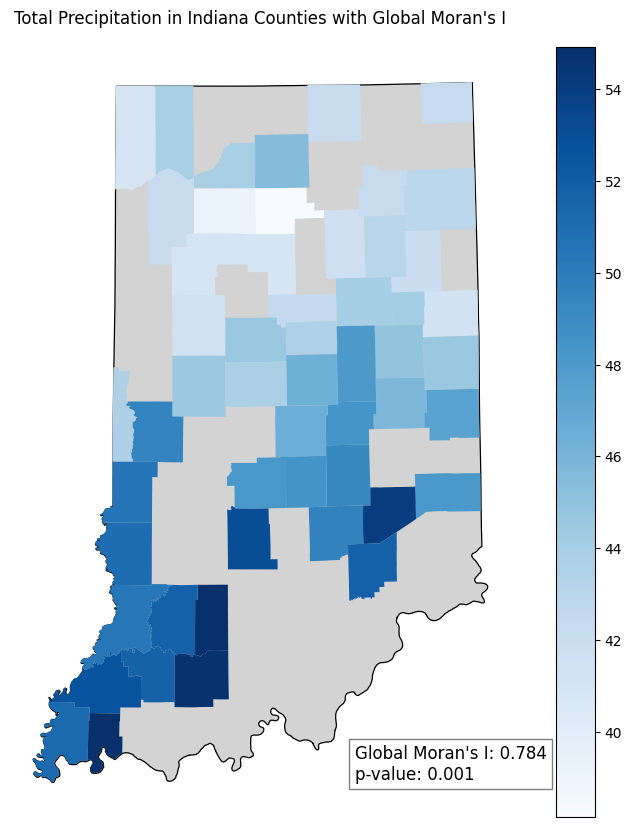

In [ ]:
#import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.patches as mpatches

# Plotting the Map to Show Spatial Pattern of Rainfall
fig, ax = plt.subplots(figsize=(12, 10))
# Overlay the state boundary for context
indiana_boundary.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.9)
# Plot the total precipitation to visualize clustering or dispersion patterns
gdf_precip.plot(
    column='rainfall',
    cmap='Blues',  # Using a continuous color map to show precipitation levels
    legend=True,
    ax=ax,
    missing_kwds={"color": "lightgrey", "label": "Missing data"}
)



# Add the global Moran's I result to the map as a text box
plt.text(
    0.69, 0.049, f"Global Moran's I: {global_moran.I:.3f}\n"
               f"p-value: {global_moran.p_sim:.3f}",
    transform=ax.transAxes,
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.5)
)

# Add a title
plt.title('Total Precipitation in Indiana Counties with Global Moran\'s I')

# Remove axes for a cleaner look
plt.axis('off')

# Show the plot
plt.show()


In [ ]:

# Compute LISA (Local Moran's I)
lisa = Moran_Local(gdf_precip['rainfall'], w)

# Add LISA results to GeoDataFrame
gdf_precip['LISA_I'] = lisa.Is  # Local Moran's I values
gdf_precip['p_values'] = lisa.p_sim  # p-values
gdf_precip['significant'] = gdf_precip['p_values'] < 0.05  # Significance threshold

# Identify cluster types (High-High, Low-Low, High-Low, Low-High)
gdf_precip['LISA_cluster'] = lisa.q


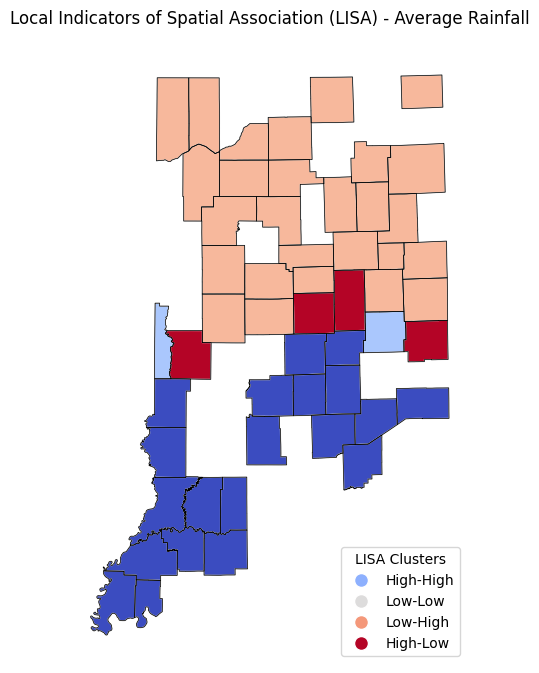

In [ ]:
lisa = Moran_Local(gdf_precip['rainfall'], w)

# Add LISA results to GeoDataFrame
gdf_precip['LISA_I'] = lisa.Is
gdf_precip['p_values'] = lisa.p_sim
gdf_precip['significant'] = gdf_precip['p_values'] < 0.05
gdf_precip['LISA_cluster'] = lisa.q

# Define cluster colors
cluster_colors = {
    1: "High-High",  # Blue
    2: "Low-Low",    # Light Orange
    3: "Low-High",   # Light Blue
    4: "High-Low"    # Red
}

# Create figure and axis
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Plot the clusters on the map
gdf_precip.plot(column='LISA_cluster', cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.8')

# Add the state boundary for better visualization
gdf_precip.boundary.plot(ax=ax, color='black', linewidth=0.5)

# Set titles and labels
plt.title('Local Indicators of Spatial Association (LISA) - Average Rainfall')
ax.set_axis_off()

# Add a legend
legend_labels = {
    1: "High-High",
    2: "Low-Low",
    3: "Low-High",
    4: "High-Low"
}
handles = [plt.Line2D([0], [0], marker='o', color='w', label=legend_labels[i],
                      markersize=10, markerfacecolor=plt.cm.coolwarm(i / 4.0)) for i in legend_labels.keys()]
plt.legend(handles=handles, loc='lower right', title='LISA Clusters')

plt.show()

In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt

df1_cleaned_whole['date'] = pd.to_datetime(df1_cleaned_whole['date'])

# Ensure 'rainfall' is numeric and handle missing values if necessary
df1_cleaned_whole['rainfall'] = pd.to_numeric(df1_cleaned_whole['rainfall'], errors='coerce')

# Handle missing data, if any, by filling or dropping
df1_cleaned_whole['rainfall'].fillna(df1_cleaned_whole['rainfall'].mean(), inplace=True)  # Simple fill, can use other methods



In [ ]:
# Calculate Z-scores for rainfall within each county
df1_cleaned_whole['z_score'] = df1_cleaned_whole.groupby('county')['rainfall'].transform(lambda x: (x - x.mean()) / x.std())

# Flag anomalies where absolute Z-score is above a certain threshold (e.g., 2 or 3)
df1_cleaned_whole['is_anomaly_z'] = df1_cleaned_whole['z_score'].abs() > 2

# Summarize anomalies
print(df1_cleaned_whole[df1_cleaned_whole['is_anomaly_z']])


             date       county  rainfall  year   z_score  is_anomaly_z
75     2016-01-02     JENNINGS  1.100000  2016  2.959257          True
157    2016-01-03        WHITE  1.500000  2016  5.457053          True
173    2016-01-04        GRANT  0.812500  2016  2.632920          True
477    2016-01-10        ALLEN  0.654167  2016  2.063206          True
478    2016-01-10  BARTHOLOMEW  0.930000  2016  2.429269          True
...           ...          ...       ...   ...       ...           ...
154426 2023-12-23      PULASKI  0.765000  2023  2.338612          True
154429 2023-12-23       STARKE  0.846667  2023  2.281839          True
154440 2023-12-23        WHITE  0.692500  2023  2.280822          True
154744 2023-12-29      PULASKI  0.695000  2023  2.089629          True
154747 2023-12-29       STARKE  1.673333  2023  4.877958          True

[7426 rows x 6 columns]


In [ ]:
from sklearn.preprocessing import StandardScaler

# Prepare features for Isolation Forest (e.g., rainfall)
features = df1_cleaned_whole[['rainfall']]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Fit Isolation Forest model
iso_forest = IsolationForest(contamination=0.05, random_state=42)
df1_cleaned_whole['is_anomaly_iforest'] = iso_forest.fit_predict(features_scaled) == -1  # -1 indicates anomalies

# Summarize anomalies detected by Isolation Forest
print(df1_cleaned_whole[df1_cleaned_whole['is_anomaly_iforest']])


             date       county  rainfall  year   z_score  is_anomaly_z  \
75     2016-01-02     JENNINGS  1.100000  2016  2.959257          True   
157    2016-01-03        WHITE  1.500000  2016  5.457053          True   
173    2016-01-04        GRANT  0.812500  2016  2.632920          True   
478    2016-01-10  BARTHOLOMEW  0.930000  2016  2.429269          True   
486    2016-01-10       DUBOIS  1.416667  2016  3.390246          True   
...           ...          ...       ...   ...       ...           ...   
154095 2023-12-17         KNOX  0.860000  2023  1.946596         False   
154393 2023-12-23         CASS  0.710000  2023  2.191526          True   
154426 2023-12-23      PULASKI  0.765000  2023  2.338612          True   
154429 2023-12-23       STARKE  0.846667  2023  2.281839          True   
154747 2023-12-29       STARKE  1.673333  2023  4.877958          True   

        is_anomaly_iforest  
75                    True  
157                   True  
173                   Tr

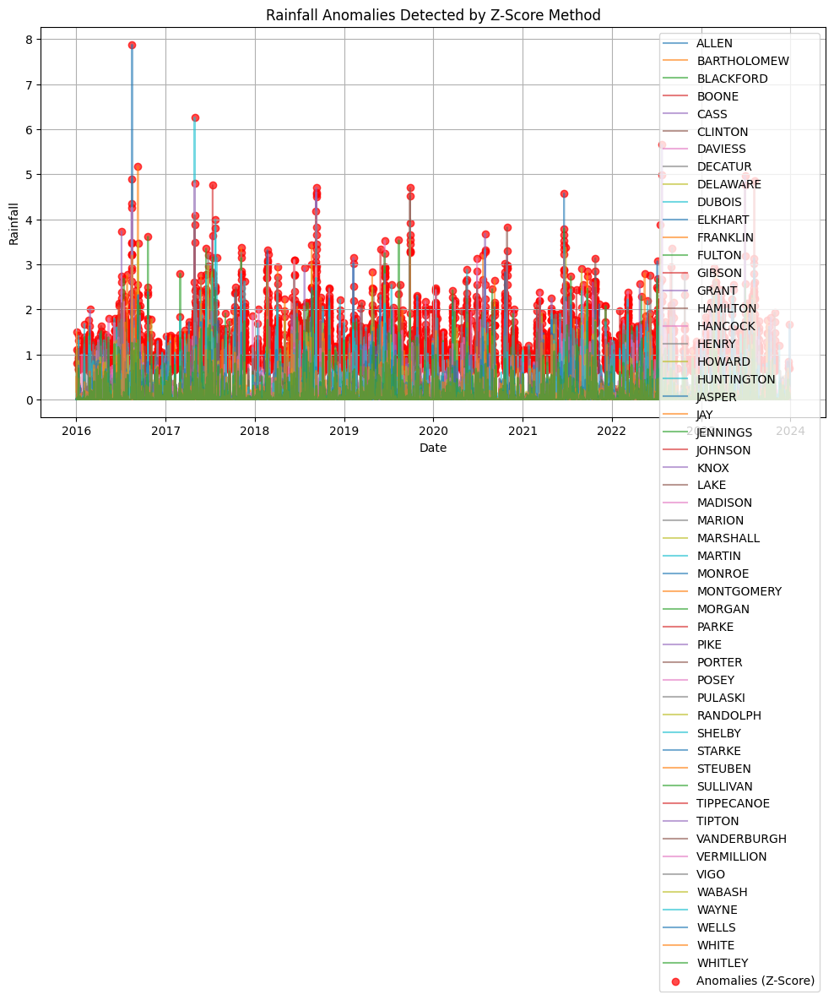

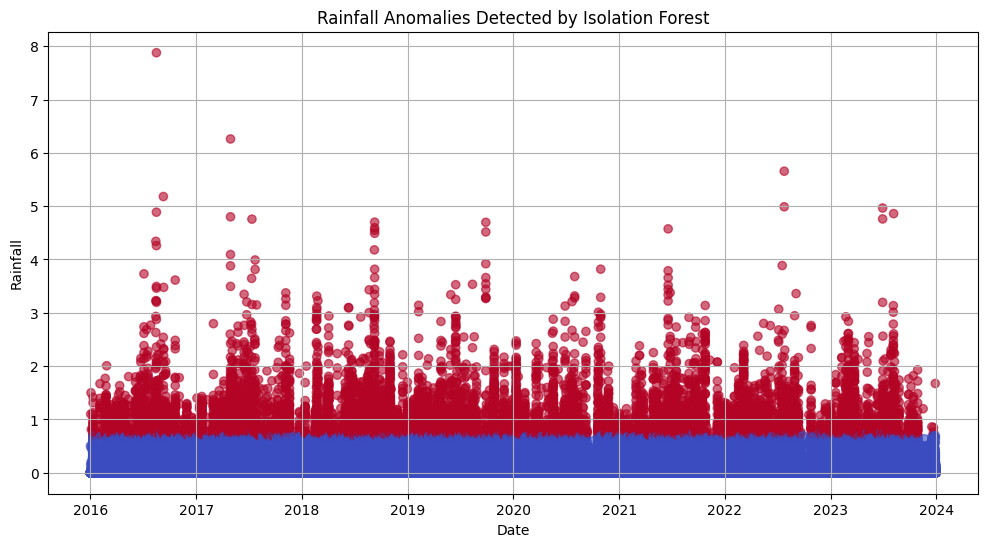

In [ ]:
# Plot anomalies using Z-score
plt.figure(figsize=(12, 6))
for county in df1_cleaned_whole['county'].unique():
    county_data = df1_cleaned_whole[df1_cleaned_whole['county'] == county]
    plt.plot(county_data['date'], county_data['rainfall'], label=f"{county}", alpha=0.6)

# Highlight anomalies
plt.scatter(df1_cleaned_whole[df1_cleaned_whole['is_anomaly_z']]['date'],
            df1_cleaned_whole[df1_cleaned_whole['is_anomaly_z']]['rainfall'],
            color='red', label='Anomalies (Z-Score)', alpha=0.7)

plt.xlabel('Date')
plt.ylabel('Rainfall')
plt.title('Rainfall Anomalies Detected by Z-Score Method')
plt.legend()
plt.grid(True)
plt.show()

# Plot anomalies using Isolation Forest
plt.figure(figsize=(12, 6))
plt.scatter(df1_cleaned_whole['date'], df1_cleaned_whole['rainfall'], c=df1_cleaned_whole['is_anomaly_iforest'],
            cmap='coolwarm', label='Isolation Forest Anomalies', alpha=0.6)

plt.xlabel('Date')
plt.ylabel('Rainfall')
plt.title('Rainfall Anomalies Detected by Isolation Forest')
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Ensure 'rainfall' column is numeric
df1_cleaned_whole['rainfall'] = pd.to_numeric(df1_cleaned_whole['rainfall'], errors='coerce')

# Extract year from date for grouping
df1_cleaned_whole['year'] = pd.to_datetime(df1_cleaned_whole['date']).dt.year

# Calculate total yearly rainfall for each county, ignoring NaNs
yearly_precip = df1_cleaned_whole.groupby(['county', 'year']).agg({'rainfall': 'sum'}).reset_index()

# Calculate the mean of yearly totals over the 8-year period for each county
mean_yearly_precip = yearly_precip.groupby('county').agg({'rainfall': 'mean'}).reset_index()

# Calculate Z-scores for mean yearly precipitation
mean_precip_mean = mean_yearly_precip['rainfall'].mean()
mean_precip_std = mean_yearly_precip['rainfall'].std()

# Add Z-score column
mean_yearly_precip['z_score'] = (mean_yearly_precip['rainfall'] - mean_precip_mean) / mean_precip_std


In [ ]:
# Load the county shapefile using GeoPandas
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"  # Update with the correct path to your shapefile
gdf = gpd.read_file(shapefile_path)

# Standardize county names for consistent merging
gdf['county'] = gdf['NAME_U'].str.upper()  # Standardize the county names
gdf = gdf[gdf['county'].isin(mean_yearly_precip['county'])]  # Filter GeoDataFrame to only include relevant counties

# Merge mean yearly precipitation with the GeoDataFrame
gdf_precip = pd.merge(gdf, mean_yearly_precip, on='county', how='left')

# Check the merged data
print(gdf_precip.head())


           AREA     PERIMETER    NAME_U    NAME_L  NCAPC CNTY_FIPS  STFID  \
0  8.352031e+08  116410.31836   STEUBEN   Steuben     76       151  18151   
1  1.211453e+09  139308.15005   ELKHART   Elkhart     20       039  18039   
2  1.620569e+09  177807.09411      LAKE      Lake     45       089  18089   
3  1.350913e+09  168663.47278    PORTER    Porter     64       127  18127   
4  1.163596e+09  136821.39736  MARSHALL  Marshall     50       099  18099   

   POP2000   WHITE   BLACK  ...  FAMILIES  AVE_FAM_SZ  HSE_UNITS  VACANT  \
0    33214   32281     123  ...      8911        3.00      17337    4599   
1   182791  157931    9551  ...     47659        3.18      69791    3637   
2   484564  323290  122723  ...    127036        3.19     194992   13359   
3   146798  139946    1344  ...     39709        3.08      57616    2967   
4    45128   43109     136  ...     12188        3.15      18099    1580   

   OWNER_OCC  RENTER_OCC                                           geometry  \
0

In [ ]:
gdf_precip.to_csv('/content/drive/MyDrive/yield_classification/all_reshaped/gdf_precip_zscore.csv')

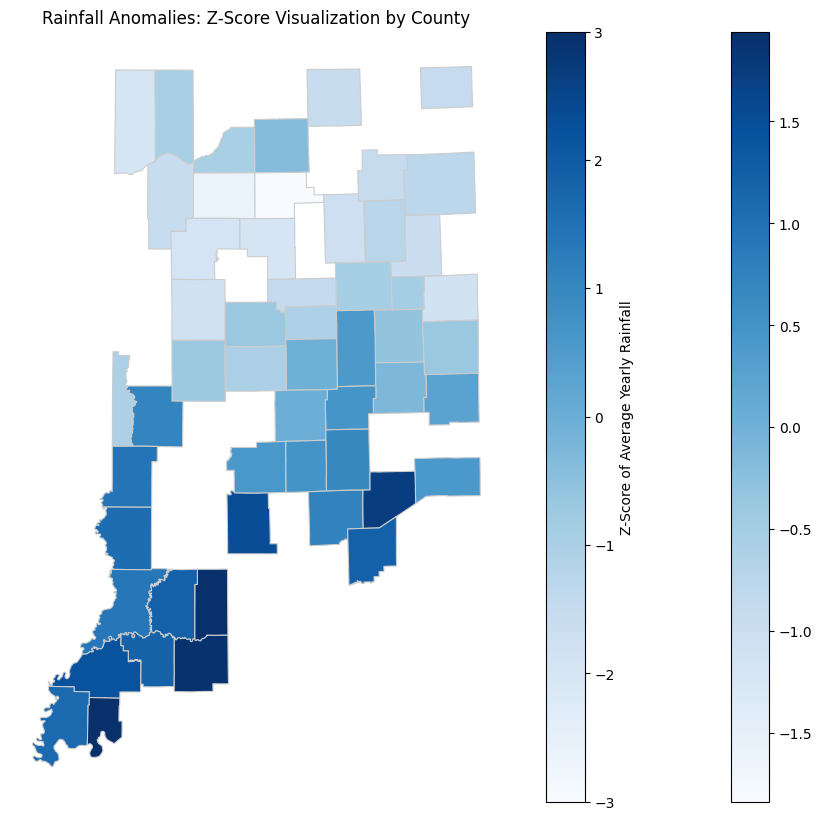

In [ ]:
import matplotlib.pyplot as plt

# Define the Z-score range for color normalization
z_min, z_max = -3, 3  # Adjust range based on your data

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(14, 10))

# Plot the counties with Z-scores as heights and colors
gdf_precip.plot(column='z_score', cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Adding a color bar for reference
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=z_min, vmax=z_max))
cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label('Z-Score of Average Yearly Rainfall')

# Set titles and labels
plt.title('Rainfall Anomalies: Z-Score Visualization by County')
ax.set_axis_off()

plt.show()


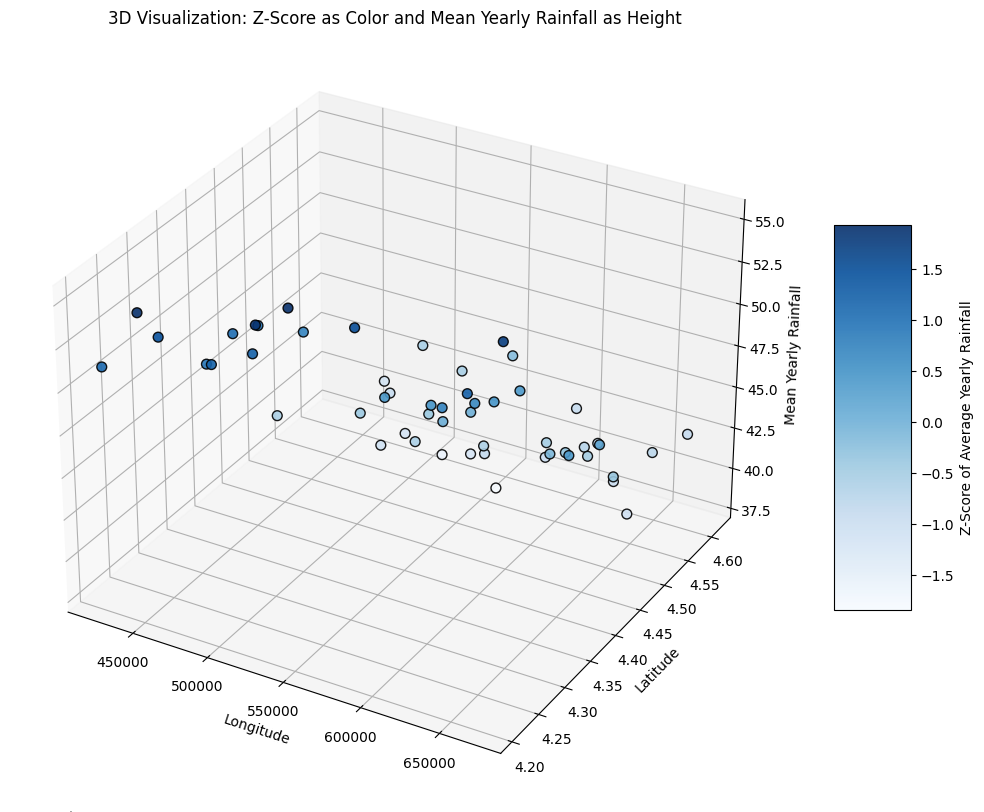

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Importing for 3D plotting
import numpy as np

# Ensure rainfall data and Z-scores are properly prepared in gdf_precip
# Assuming gdf_precip is already created with 'rainfall' and 'z_score'

# Load the shapefile and merge with your calculated Z-scores if not already done
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"
gdf = gpd.read_file(shapefile_path)
gdf['county'] = gdf['NAME_U'].str.upper()

# Merge with calculated Z-scores and mean yearly rainfall
gdf_precip = pd.merge(gdf, mean_yearly_precip, on='county', how='left')

# Prepare data for plotting
z_scores = gdf_precip['z_score']
mean_rainfall = gdf_precip['rainfall']
x = gdf_precip.centroid.x
y = gdf_precip.centroid.y

# Set up the figure and axis for 3D plotting
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Plotting
sc = ax.scatter(x, y, mean_rainfall, c=z_scores, cmap='Blues', s=50, edgecolor='k', alpha=0.9)

# Adding color bar
cbar = plt.colorbar(sc, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Z-Score of Average Yearly Rainfall')

# Labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Mean Yearly Rainfall')
plt.title('3D Visualization: Z-Score as Color and Mean Yearly Rainfall as Height')

plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

# Assuming df is your time series dataset with columns: 'county', 'year', 'rainfall', 'meantemp', 'yield'

# Step 1: Calculate mean annual temperature per county
mean_temp_per_county = df.groupby('county')['meantemp'].mean()

# Step 2: Calculate sum of yearly rainfall for all years per county and find the average
avg_rainfall_per_county = df.groupby('county').apply(lambda x: x.groupby('year')['rainfall'].sum().mean())

# Step 3: Get the yield per county (assuming there is one yield value per county in the dataset)
yield_per_county = df.groupby('county')['yield'].mean()

# Step 4: Combine the results into a single DataFrame
df_surface = pd.DataFrame({
    'mean_temp': mean_temp_per_county,
    'avg_rainfall': avg_rainfall_per_county,
    'yield': yield_per_county
}).reset_index()

# Step 5: Create a 3D surface plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Prepare data for plotting
X = df_surface['mean_temp']
Y = df_surface['avg_rainfall']
Z = df_surface['yield']

# Create a grid for X and Y values
X, Y = np.meshgrid(X, Y)

# Plot the surface
surf = ax.plot_trisurf(X.flatten(), Y.flatten(), Z.flatten(), cmap=cm.viridis)

# Add labels and title
ax.set_xlabel('Mean Annual Temperature (°C)')
ax.set_ylabel('Average Yearly Rainfall (mm)')
ax.set_zlabel('Yield')
plt.title('Surface Plot: Temperature, Rainfall, and Yield')

# Add color bar
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

# Show plot
plt.show()



In [ ]:
import plotly.io as pio

# Use the 'colab' renderer for Plotly
pio.renderers.default = 'colab'


In [ ]:
import geopandas as gpd
import pandas as pd
import plotly.graph_objects as go

# Load the county shapefile and merge with mean yearly precipitation and Z-scores if not already done
shapefile_path = "/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp"  # Update with correct path
gdf = gpd.read_file(shapefile_path)
gdf['county'] = gdf['NAME_U'].str.upper()

# Merge the GeoDataFrame with mean yearly precipitation and Z-scores
gdf_precip = pd.merge(gdf, mean_yearly_precip, on='county', how='left')

# Prepare data for 3D plotting
gdf_precip['lon'] = gdf_precip.geometry.centroid.x
gdf_precip['lat'] = gdf_precip.geometry.centroid.y

# Create 3D map with plotly
fig = go.Figure(go.Choroplethmapbox(
    geojson=gdf_precip.__geo_interface__,
    locations=gdf_precip.index,
    z=gdf_precip['z_score'],  # Use Z-scores for color
    colorscale='Blues',
    colorbar_title='Z-Score',
    marker_opacity=0.7,
    marker_line_width=0
))

# Update layout for map appearance
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=6,
    mapbox_center={"lat": gdf_precip['lat'].mean(), "lon": gdf_precip['lon'].mean()},
    title="3D Map of Indiana: Z-Score as Color and Mean Yearly Rainfall as Height",
)

# Show the figure
fig.show()
fig.savefig('3d_map.html')

In [ ]:
fig.save('3d_map.html')

AttributeError: 'Figure' object has no attribute 'save'

In [ ]:
# Extract coordinates and imputed data
coords = df[['lon', 'lat']].values  # Spatial coordinates
rainfall = df['data'].values  # Imputed precipitation data

# Define bins for the semivariogram
bins = np.linspace(0, 200000, 20)  # Adjust bins based on spatial extent

# Compute the empirical semivariogram
bin_center, gamma = gs.vario_estimate(coords, rainfall, bins=bins)

# Plot the semivariogram
plt.figure(figsize=(10, 6))
plt.plot(bin_center, gamma, marker='o', linestyle='-', color='blue')
plt.xlabel('Distance (meters)')
plt.ylabel('Semivariance')
plt.title('Empirical Semivariogram of Imputed Precipitation Data')
plt.grid(True)
plt.show()


In [ ]:
# Define bins for semivariogram based on the spatial extent and scale
bins = np.linspace(0, 200000, 20)  # Define bins up to 200 km, adjust as necessary

try:
    # Calculate the empirical semivariogram using gstools
    bin_center, gamma = gs.vario_estimate(coords, rainfall, bins=bins)

    # Plot the semivariogram
    plt.figure(figsize=(10, 6))
    plt.plot(bin_center, gamma, marker='o', linestyle='-', color='blue')
    plt.xlabel('Distance (meters)')
    plt.ylabel('Semivariance')
    plt.title('Empirical Semivariogram of Precipitation in Indiana')
    plt.grid(True)
    plt.show()

except ValueError as e:
    print(f"Error encountered: {e}")
    print("Please ensure that the coordinate and value arrays are correctly formatted and aligned.")


Error encountered: Formatting: position tuple doesn't match dimension.
Please ensure that the coordinate and value arrays are correctly formatted and aligned.


In [ ]:
import pandas as pd
import numpy as np

# Ensure df1_cleaned is the cleaned DataFrame without duplicates
# Pivot the DataFrame to create a matrix of rainfall for each date (rows) and county (columns)
spatial_df = df1_cleaned_whole.pivot(index='date', columns='county', values='rainfall')

# Calculate the correlation matrix for spatial correlation (across counties for each date)
spatial_correlation_matrix = spatial_df.corr(method='pearson')

# Get the average spatial correlation by taking the mean of the upper triangle of the correlation matrix
spatial_correlation = spatial_correlation_matrix.where(
    np.triu(np.ones(spatial_correlation_matrix.shape), k=1).astype(bool)
).mean().mean()

print(f"Average Spatial Correlation: {spatial_correlation:.3f}")

# Display the correlation matrix to understand the spatial relationships
print("Spatial Correlation Matrix:")
print(spatial_correlation_matrix)


Average Spatial Correlation: 0.528
Spatial Correlation Matrix:
county          ALLEN  BARTHOLOMEW  BLACKFORD     BOONE      CASS   CLINTON  \
county                                                                        
ALLEN        1.000000     0.411301   0.693660  0.584753  0.691278  0.557130   
BARTHOLOMEW  0.411301     1.000000   0.510652  0.608281  0.381935  0.427604   
BLACKFORD    0.693660     0.510652   1.000000  0.723775  0.669478  0.607790   
BOONE        0.584753     0.608281   0.723775  1.000000  0.654588  0.708161   
CASS         0.691278     0.381935   0.669478  0.654588  1.000000  0.681311   
CLINTON      0.557130     0.427604   0.607790  0.708161  0.681311  1.000000   
DAVIESS      0.319269     0.659342   0.443953  0.554313  0.351582  0.418742   
DECATUR      0.367443     0.753354   0.453006  0.544381  0.351345  0.473831   
DELAWARE     0.591535     0.590878   0.828364  0.729445  0.565446  0.581061   
DUBOIS       0.322059     0.650103   0.420715  0.494093  0.327003  0

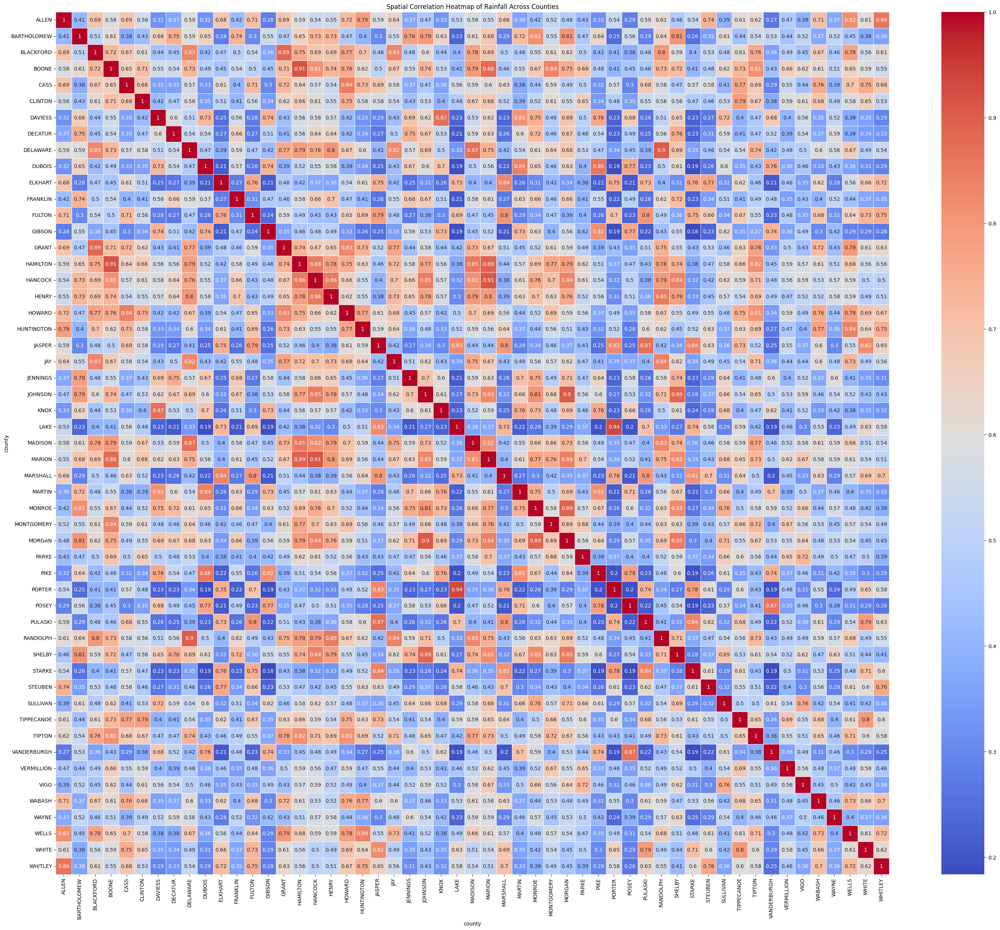

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure df1_cleaned is the cleaned DataFrame without duplicates
# Pivot the DataFrame to create a matrix of rainfall for each date (rows) and county (columns)
spatial_df = df1_cleaned_whole.pivot(index='date', columns='county', values='rainfall')

# Calculate the correlation matrix for spatial correlation (across counties for each date)
spatial_correlation_matrix = spatial_df.corr(method='pearson')

# Plotting the spatial correlation matrix as a heatmap
plt.figure(figsize=(36, 30))
sns.heatmap(spatial_correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Spatial Correlation Heatmap of Rainfall Across Counties')
plt.show()


In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import haversine_distances
from math import radians

# Assume gdf is the GeoDataFrame containing county geometries and 'NAME_U' is the county name column
gdf = gpd.GeoDataFrame({
    'county': df1_cleaned_whole['county'].unique()
}).merge(gdf, on='county', how='left')

# Calculate centroids for each county
gdf['centroid'] = gdf.geometry.centroid
gdf['centroid_x'] = gdf.centroid.x
gdf['centroid_y'] = gdf.centroid.y

# Convert centroids to radians for haversine distance calculation
gdf['centroid_x_rad'] = gdf['centroid_x'].apply(radians)
gdf['centroid_y_rad'] = gdf['centroid_y'].apply(radians)

# Get the county names
counties = gdf['county'].values

# Prepare to calculate pairwise distances
distances = []
county_pairs = []
for i, county1 in enumerate(counties):
    for j, county2 in enumerate(counties):
        if i < j:
            # Compute Haversine distance between the two centroids
            point1 = [gdf.loc[gdf['county'] == county1, 'centroid_y_rad'].values[0],
                      gdf.loc[gdf['county'] == county1, 'centroid_x_rad'].values[0]]
            point2 = [gdf.loc[gdf['county'] == county2, 'centroid_y_rad'].values[0],
                      gdf.loc[gdf['county'] == county2, 'centroid_x_rad'].values[0]]
            distance = haversine_distances([point1, point2])[0, 1] * 6371  # Convert to kilometers
            distances.append(distance)
            county_pairs.append((county1, county2))


KeyError: 'county'

In [ ]:
# Print column names for gdf to ensure 'county' exists
print("Columns in gdf:", gdf.columns)

# Print column names for df1_cleaned_whole to ensure 'county' exists
print("Columns in df1_cleaned_whole:", df1_cleaned_whole.columns)


Columns in gdf: Index(['AREA', 'PERIMETER', 'NAME_U', 'NAME_L', 'NCAPC', 'CNTY_FIPS', 'STFID',
       'POP2000', 'WHITE', 'BLACK', 'AMERI_ES', 'ASIAN', 'HAWN_PI', 'OTHER',
       'MULT_RACE', 'HISPANIC', 'MALES', 'FEMALES', 'AGE_UNDER5', 'AGE_5_17',
       'AGE_18_21', 'AGE_22_29', 'AGE_30_39', 'AGE_40_49', 'AGE_50_64',
       'AGE_65_UP', 'MED_AGE', 'MED_AGE_M', 'MED_AGE_F', 'HOUSEHOLDS',
       'AVE_HH_SZ', 'HSEHLD_1_M', 'HSEHLD_1_F', 'MARHH_CHD', 'MARHH_NO_C',
       'MHH_CHILD', 'FHH_CHILD', 'FAMILIES', 'AVE_FAM_SZ', 'HSE_UNITS',
       'VACANT', 'OWNER_OCC', 'RENTER_OCC', 'geometry'],
      dtype='object')
Columns in df1_cleaned_whole: Index(['date', 'county', 'rainfall'], dtype='object')


Average Temporal Correlation (Lag 1): 0.003


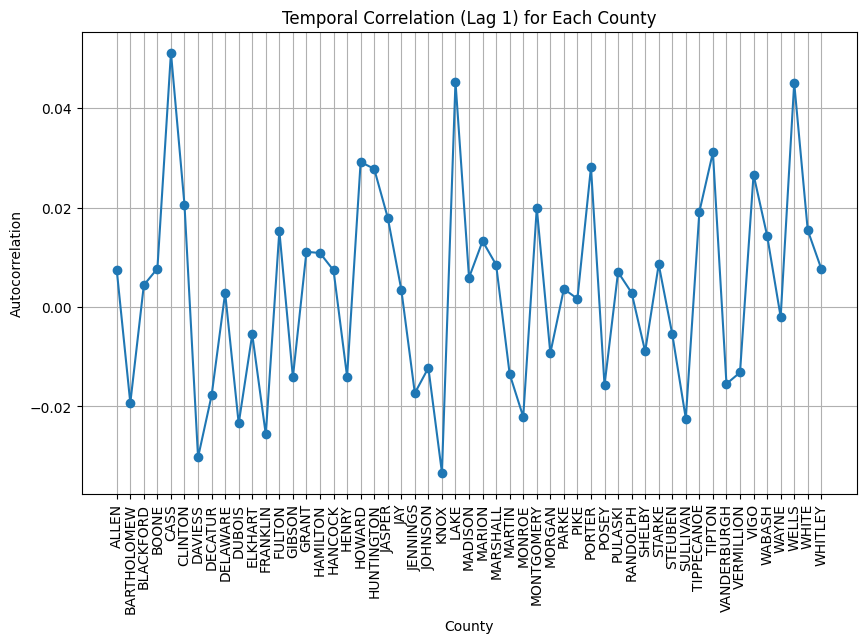

In [ ]:
import matplotlib.pyplot as plt

# Calculate the autocorrelation (temporal correlation) for each county
temporal_correlations = []

for county in df1_cleaned_whole['county'].unique():
    # Filter data for the current county
    county_data = df1_cleaned_whole[df1_cleaned_whole['county'] == county].set_index('date')['rainfall']

    # Calculate the autocorrelation for a lag of 1 (or more lags as needed)
    autocorr = county_data.autocorr(lag=365)
    temporal_correlations.append(autocorr)

# Get the average temporal correlation across all counties
average_temporal_correlation = np.nanmean(temporal_correlations)

print(f"Average Temporal Correlation (Lag 1): {average_temporal_correlation:.3f}")

# Plot temporal autocorrelations
plt.figure(figsize=(10, 6))
plt.plot(df1_cleaned_whole['county'].unique(), temporal_correlations, marker='o')
plt.title('Temporal Correlation (Lag 1) for Each County')
plt.xlabel('County')
plt.ylabel('Autocorrelation')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()


In [ ]:
df2 = pd.read_csv('/content/drive/MyDrive/yield_classification/yield_classified.csv')

In [ ]:
df2.columns

Index(['Unnamed: 0', 'Program', 'Year', 'Period', 'Week Ending', 'Geo Level',
       'State', 'State ANSI', 'Ag District', 'Ag District Code', 'County',
       'County ANSI', 'Zip Code', 'Region', 'watershed_code', 'Watershed',
       'Commodity', 'Data Item', 'Domain', 'Domain Category', 'Value',
       'CV (%)', 'classification'],
      dtype='object')

In [ ]:
df2 = df2[["Year","County","Value","classification"]]

In [ ]:
df2

,Year,County,Value,classification
0,2023,OTHER COUNTIES,202.5,G
1,2023,BARTHOLOMEW,195.0,N
2,2023,BOONE,207.2,G
3,2023,CLINTON,234.4,G
4,2023,DECATUR,221.9,G
...,...,...,...,...
652,2016,OTHER (COMBINED) COUNTIES,182.7,N
653,2016,OWEN,160.5,B
654,2016,PARKE,182.8,N
655,2016,VERMILLION,197.5,G


In [ ]:
# Step 1: Preparing the Data


df1['year'] = (df1.index.shift(-8, freq='M').year)

# Filter counties that are present in both df1 and df2
common_counties = set(df1['county']).intersection(set(df2['County']))

# Filter df1 and df2 to include only common counties
df1_filtered = df1[df1['county'].isin(common_counties)]
df2_filtered = df2[df2['County'].isin(common_counties)]

# Create a sequence of daily weather data for each county-year pair
county_years = df1_filtered.groupby(['county', 'year'])

X_list = []
y_list = []
valid_pairs = set(zip(df2_filtered['County'], df2_filtered['Year']))

for (county, year), group in county_years:
    # Ensure we are selecting full-year data (365 days)
    if len(group) == 365 and (county, year) in valid_pairs:
        X_list.append(group[['max', 'min', 'meantemp', 'rainfall']].values)
        y_value = df2_filtered[(df2_filtered['County'] == county) & (df2_filtered['Year'] == year)]['Value'].values
        if len(y_value) == 1:  # Ensure there is exactly one yield value
            y_list.append(y_value[0])

# Convert lists to numpy arrays
X = np.array(X_list)  # Shape: (n_samples, 365, 4)
y = np.array(y_list)  # Shape: (n_samples,)

# Check if X and y have data
print(f'Shape of X: {X.shape}')
print(f'Shape of y: {y.shape}')

Shape of X: (284, 365, 4)
Shape of y: (284,)


# Imputation https://www.sciencedirect.com/science/article/pii/S0169809517301254?casa_token=nzXnrszhztMAAAAA:2jWNd1yFtayS2ZRgYLlngJq_880cf0tmTPuxPFw3-hP-msh-RcoPBPCzrG-i1FPTFGLlj0joA9E

## Merge spatial-temporal **variables** **bold text**

In [ ]:
timeseries = pd.read_csv('/content/drive/MyDrive/yield_classification/all_reshaped/working_df_final.csv')

In [ ]:
df_weather = timeseries.drop(columns=['Unnamed: 0.1', 'Unnamed: 0', 'centroid', 'centroid_lon', 'centroid_lat'])

In [ ]:
# Drop unnecessary columns


# Convert the 'date' column to datetime format
df_weather['date'] = pd.to_datetime(df_weather['date'])

# Extract the year from the 'date' column and create a new 'year' column
df_weather['year'] = df_weather['date'].dt.year

# Display the first few rows to verify the changes (optional)
print(df_weather.head())


        date       county  rainfall   max   min  meantemp  \
0 2016-01-01        ALLEN       0.0  29.5  24.5     27.00   
1 2016-01-01  BARTHOLOMEW       0.0  32.0  27.0     29.50   
2 2016-01-01    BLACKFORD       0.0  32.0  24.0     28.00   
3 2016-01-01        BOONE       0.0  29.5  23.0     26.25   
4 2016-01-01         CASS       0.0  30.5  24.0     27.25   

                                            geometry  year  
0  POLYGON ((683957.193396785 4571167.61181203, 6...  2016  
1  POLYGON ((611712.610158792 4356425.76096347, 6...  2016  
2  POLYGON ((652152.259202325 4492278.29553506, 6...  2016  
3  POLYGON ((564505.712985303 4448101.92441256, 5...  2016  
4  POLYGON ((569986.858384202 4529037.85124856, 5...  2016  


In [ ]:
df_yield = pd.read_csv('/content/drive/MyDrive/yield_classification/yield_classified.csv')
df_yield

,Unnamed: 0,Program,Year,Period,Week Ending,Geo Level,State,State ANSI,Ag District,Ag District Code,...,Region,watershed_code,Watershed,Commodity,Data Item,Domain,Domain Category,Value,CV (%),classification
0,0,SURVEY,2023,YEAR,NaN,COUNTY,INDIANA,18,NaN,99,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,202.5,0.8,G
1,1,SURVEY,2023,YEAR,NaN,COUNTY,INDIANA,18,CENTRAL,50,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,195.0,3.9,N
2,2,SURVEY,2023,YEAR,NaN,COUNTY,INDIANA,18,CENTRAL,50,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,207.2,2.1,G
3,3,SURVEY,2023,YEAR,NaN,COUNTY,INDIANA,18,CENTRAL,50,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,234.4,2.8,G
4,4,SURVEY,2023,YEAR,NaN,COUNTY,INDIANA,18,CENTRAL,50,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,221.9,1.9,G
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
652,652,SURVEY,2016,YEAR,NaN,COUNTY,INDIANA,18,WEST CENTRAL,40,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,182.7,NaN,N
653,653,SURVEY,2016,YEAR,NaN,COUNTY,INDIANA,18,WEST CENTRAL,40,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,160.5,NaN,B
654,654,SURVEY,2016,YEAR,NaN,COUNTY,INDIANA,18,WEST CENTRAL,40,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,182.8,NaN,N
655,655,SURVEY,2016,YEAR,NaN,COUNTY,INDIANA,18,WEST CENTRAL,40,...,NaN,0,NaN,CORN,"CORN, GRAIN - YIELD, MEASURED IN BU / ACRE",TOTAL,NOT SPECIFIED,197.5,NaN,G


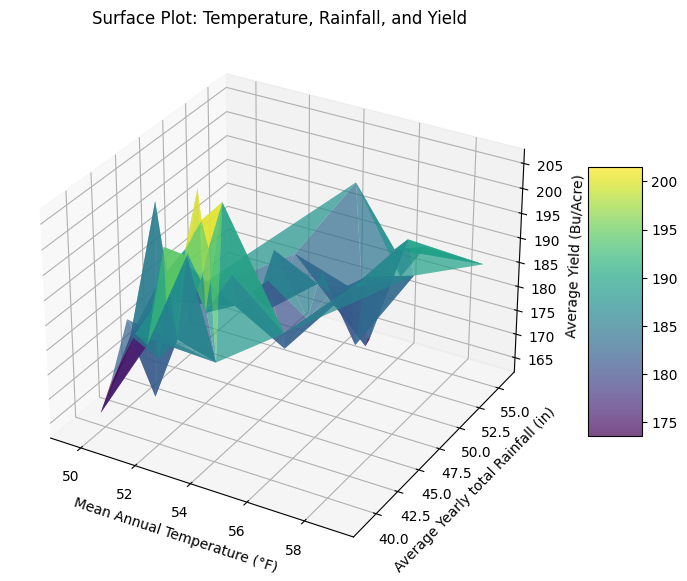

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

# Assuming df_weather is your weather DataFrame with 'county', 'year', 'rainfall', 'meantemp'
# Assuming df_yield is your yield DataFrame with the mentioned structure

# Step 1: Extract relevant columns from the yield data
df_yield_relevant = df_yield[['County', 'Year', 'Value']]

# Rename columns for consistency
df_yield_relevant = df_yield_relevant.rename(columns={'County': 'county', 'Year': 'year', 'Value': 'yield'})

# Ensure the county names and years match the weather data
df_yield_relevant['county'] = df_yield_relevant['county'].str.upper()

# Step 2: Merge the weather and yield datasets on 'county' and 'year'
df_merged = pd.merge(df_weather, df_yield_relevant, on=['county', 'year'])

# Step 3: Calculate mean annual temperature per county
mean_temp_per_county = df_merged.groupby('county')['meantemp'].mean()

# Step 4: Calculate sum of yearly rainfall for all years per county and find the average
avg_rainfall_per_county = df_merged.groupby('county').apply(lambda x: x.groupby('year')['rainfall'].sum().mean())

# Step 5: Calculate average yield per county
avg_yield_per_county = df_merged.groupby('county')['yield'].mean()

# Step 6: Combine the results into a single DataFrame
df_surface = pd.DataFrame({
    'mean_temp': mean_temp_per_county,
    'avg_rainfall': avg_rainfall_per_county,
    'avg_yield': avg_yield_per_county
}).reset_index()

# Step 7: Create a 3D surface plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Prepare data for plotting
X = df_surface['mean_temp']
Y = df_surface['avg_rainfall']
Z = df_surface['avg_yield']

# Create a 3D surface plot using trisurf with transparency
surf = ax.plot_trisurf(X, Y, Z, cmap=cm.viridis, alpha=0.7)  # alpha controls transparency

# Add labels and title
ax.set_xlabel('Mean Annual Temperature (°F)')
ax.set_ylabel('Average Yearly total Rainfall (in)')
ax.set_zlabel('Average Yield (Bu/Acre)')
plt.title('Surface Plot: Temperature, Rainfall, and Yield')

# Add color bar for the surface plot
fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)

# Show plot
plt.show()


# growing degree days

In [ ]:
# Assuming 'max' is the column for daily maximum temperature, and 'min' is the column for daily minimum temperature
# Base temperature for Indiana (commonly used for crops like corn) is 50°F, which is 10°C
base_temp = 50

# Step 1: Calculate GDD using the formula: (Tmax + Tmin) / 2 - Base Temperature
df_weather['gdd'] = ((df_weather['max'] + df_weather['min']) / 2) - base_temp

# Step 2: Set GDD values below zero to zero (as negative GDD is not valid)
df_weather['gdd'] = df_weather['gdd'].apply(lambda x: max(x, 0))

# Display the updated DataFrame
print(df_weather.head())


        date       county  rainfall   max   min  meantemp  \
0 2016-01-01        ALLEN       0.0  29.5  24.5     27.00   
1 2016-01-01  BARTHOLOMEW       0.0  32.0  27.0     29.50   
2 2016-01-01    BLACKFORD       0.0  32.0  24.0     28.00   
3 2016-01-01        BOONE       0.0  29.5  23.0     26.25   
4 2016-01-01         CASS       0.0  30.5  24.0     27.25   

                                            geometry  year  gdd  
0  POLYGON ((683957.193396785 4571167.61181203, 6...  2016  0.0  
1  POLYGON ((611712.610158792 4356425.76096347, 6...  2016  0.0  
2  POLYGON ((652152.259202325 4492278.29553506, 6...  2016  0.0  
3  POLYGON ((564505.712985303 4448101.92441256, 5...  2016  0.0  
4  POLYGON ((569986.858384202 4529037.85124856, 5...  2016  0.0  


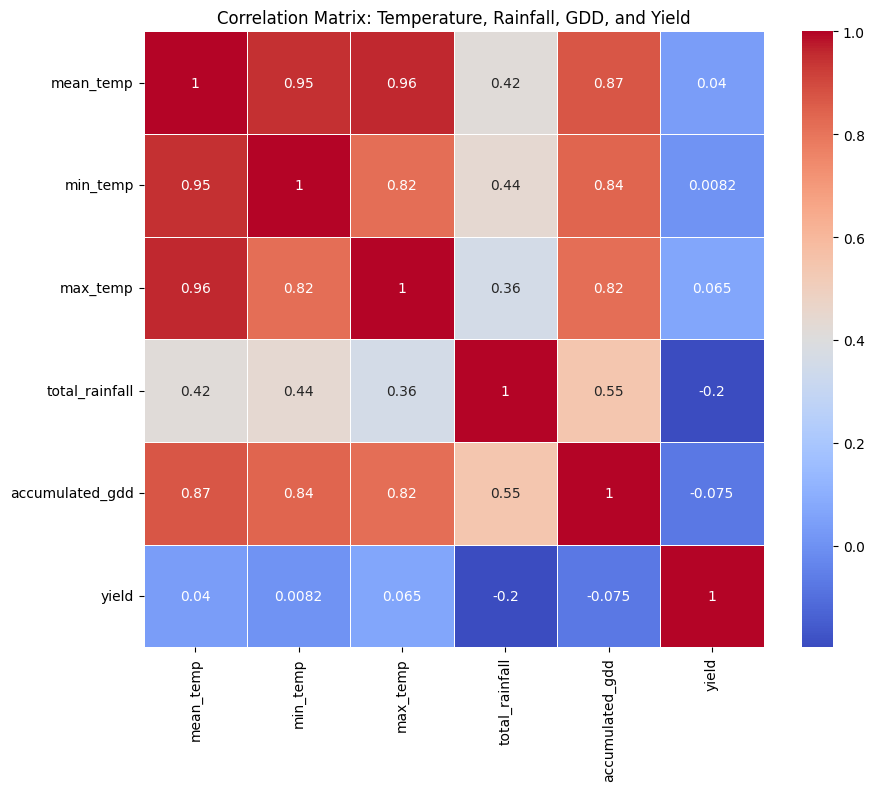

<ipython-input-8-323ee57a1005>:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='viridis')


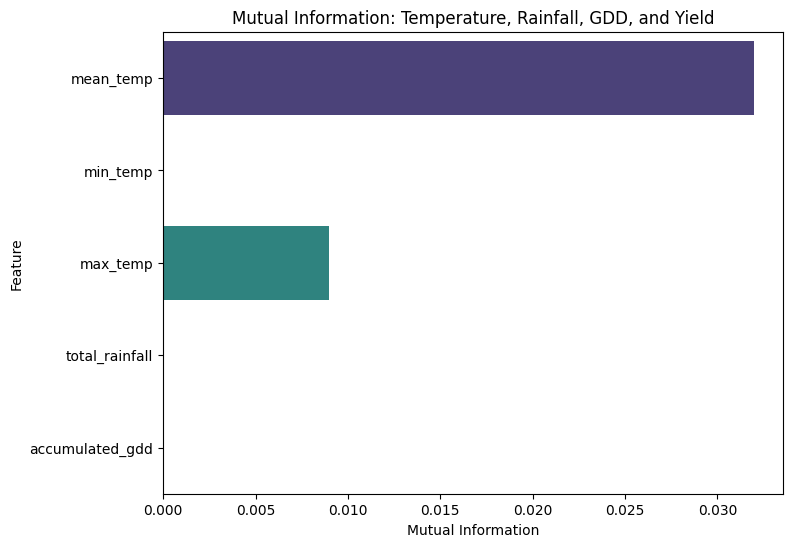

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import mutual_info_regression
weather_df = df_weather
# Step 1: Calculate accumulated GDD per county per year
accumulated_gdd = weather_df.groupby(['county', 'year'])['gdd'].sum().reset_index(name='accumulated_gdd')

# Step 2: Calculate mean of temperatures and total rainfall per year per county
weather_aggregated = weather_df.groupby(['county', 'year']).agg(
    mean_temp=('meantemp', 'mean'),
    min_temp=('min', 'mean'),
    max_temp=('max', 'mean'),
    total_rainfall=('rainfall', 'sum')
).reset_index()

# Step 3: Merge accumulated GDD with weather_aggregated and the yield data
df_merged = pd.merge(weather_aggregated, accumulated_gdd, on=['county', 'year'])
df_final = pd.merge(df_merged, df_yield_relevant, on=['county', 'year'])

# Step 4: Correlation matrix
# Compute the correlation matrix
correlation_matrix = df_final[['mean_temp', 'min_temp', 'max_temp', 'total_rainfall', 'accumulated_gdd', 'yield']].corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix: Temperature, Rainfall, GDD, and Yield')
plt.show()

# Step 5: Mutual Information Plot
# Mutual information can capture non-linear relationships
X = df_final[['mean_temp', 'min_temp', 'max_temp', 'total_rainfall', 'accumulated_gdd']]
y = df_final['yield']

# Calculate mutual information between features and yield
mutual_info = mutual_info_regression(X, y)

# Create a DataFrame for plotting
mutual_info_df = pd.DataFrame({
    'Feature': ['mean_temp', 'min_temp', 'max_temp', 'total_rainfall', 'accumulated_gdd'],
    'Mutual Information': mutual_info
})

# Plot the mutual information scores
plt.figure(figsize=(8, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='viridis')
plt.title('Mutual Information: Temperature, Rainfall, GDD, and Yield')
plt.show()


In [ ]:
import geopandas as gpd
import pandas as pd

# Step 1: Load the county shapefile (assuming it's a GeoDataFrame and the file is in your directory)
county_shapefile = gpd.read_file("/content/drive/MyDrive/yield_classification/Census_County_TIGER00_IN.shp")

# Check the first few rows of the shapefile to see the structure
print(county_shapefile.head())

# Step 2: Ensure that the 'county' column in df_weather and 'Name_U' in county_shapefile are in the same format
# We'll standardize both columns by converting them to uppercase and stripping any extra spaces

df_weather['county'] = df_weather['county'].str.upper().str.strip()
county_shapefile['Name_U'] = county_shapefile['NAME_U'].str.upper().str.strip()

# Step 4: Remove the old polygon column (if any) from df_weather
if 'geometry' in df_weather.columns:
    df_weather = df_weather.drop(columns=['geometry'])


# Step 3: Merge df_weather with county_shapefile on the county name
# Keep only the geometry (boundaries) from the shapefile that we want to add to df_weather
df_weather = pd.merge(df_weather, county_shapefile[['NAME_U', 'geometry']],
                      left_on='county', right_on='NAME_U', how='left')


# Step 5: Convert df_weather into a GeoDataFrame using the new geometry column (county boundaries)
df_weather = gpd.GeoDataFrame(df_weather, geometry='geometry')

# Step 6: Validate geometries and fix any invalid geometries if needed
df_weather['geometry'] = df_weather['geometry'].buffer(0)

# Step 7: Extract the centroid of each county for Moran's I analysis
df_weather['centroid'] = df_weather.geometry.centroid

# Now, set the geometry to the centroid for Moran's I calculation
df_weather = df_weather.set_geometry('centroid')

# Proceed with the rest of the analysis (like projection, Moran's I, etc.)
# Step 8: Project the centroids to Indiana State Plane (EPSG: 26916)
df_weather_projected = df_weather.to_crs(epsg=26916)



           AREA     PERIMETER     NAME_U     NAME_L  NCAPC CNTY_FIPS  STFID  \
0  8.352031e+08  116410.31836    STEUBEN    Steuben     76       151  18151   
1  1.001560e+09  129036.36824   LAGRANGE   Lagrange     44       087  18087   
2  1.211453e+09  139308.15005    ELKHART    Elkhart     20       039  18039   
3  1.194457e+09  155508.91992  ST JOSEPH  St Joseph     71       141  18141   
4  1.620569e+09  177807.09411       LAKE       Lake     45       089  18089   

   POP2000   WHITE   BLACK  ...  MARHH_NO_C  MHH_CHILD  FHH_CHILD  FAMILIES  \
0    33214   32281     123  ...        4208        375        715      8911   
1    34909   33770      66  ...        3777        249        434      8856   
2   182791  157931    9551  ...       19981       1839       4636     47659   
3   265559  218706   30422  ...       28122       2148       7865     66802   
4   484564  323290  122723  ...       49444       3671      16887    127036   

   AVE_FAM_SZ  HSE_UNITS  VACANT  OWNER_OCC  RENTE

In [ ]:
df_weather_projected

,date,county,rainfall,max,min,meantemp,year,gdd,NAME_U_x,centroid,NAME_U_y,geometry
0,2016-01-01,ALLEN,0.000000,29.500,24.500,27.000,2016,0.0,ALLEN,POINT (662385.477 4550643.224),ALLEN,"POLYGON ((683957.193 4571167.612, 684008.133 4..."
1,2016-01-01,BARTHOLOMEW,0.000000,32.000,27.000,29.500,2016,0.0,BARTHOLOMEW,POINT (595178.923 4340211.678),BARTHOLOMEW,"POLYGON ((611712.61 4356425.761, 613353.302 43..."
2,2016-01-01,BLACKFORD,0.000000,32.000,24.000,28.000,2016,0.0,BLACKFORD,POINT (642008.409 4481668.381),BLACKFORD,"POLYGON ((652152.259 4492278.296, 652282.387 4..."
3,2016-01-01,BOONE,0.000000,29.500,23.000,26.250,2016,0.0,BOONE,POINT (545320.723 4433531.988),BOONE,"POLYGON ((564505.713 4448101.924, 564520.789 4..."
4,2016-01-01,CASS,0.000000,30.500,24.000,27.250,2016,0.0,CASS,POINT (555216.513 4512474.729),CASS,"POLYGON ((569986.858 4529037.851, 570028.393 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...
154861,2023-12-31,WABASH,0.010000,36.500,31.000,33.750,2023,0.0,WABASH,POINT (601665.384 4522320.778),WABASH,"POLYGON ((610584.799 4544679.393, 610638.906 4..."
154862,2023-12-31,WAYNE,0.020000,37.000,26.000,31.500,2023,0.0,WAYNE,POINT (670221.542 4414607.66),WAYNE,"POLYGON ((685238.482 4430629.065, 686865.006 4..."
154863,2023-12-31,WELLS,0.003333,36.428,31.208,33.872,2023,0.0,WELLS,POINT (650208.834 4510205.105),WELLS,"POLYGON ((662154.482 4531421.789, 662194.512 4..."
154864,2023-12-31,WHITE,0.030000,37.000,33.000,35.000,2023,0.0,WHITE,POINT (511346.522 4510981.387),WHITE,"POLYGON ((518916.124 4529062.077, 520462.751 4..."


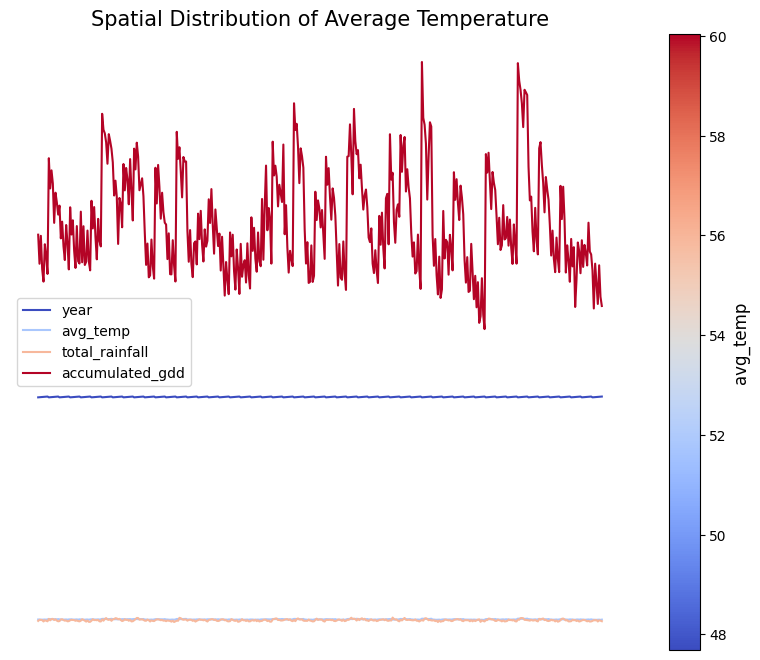

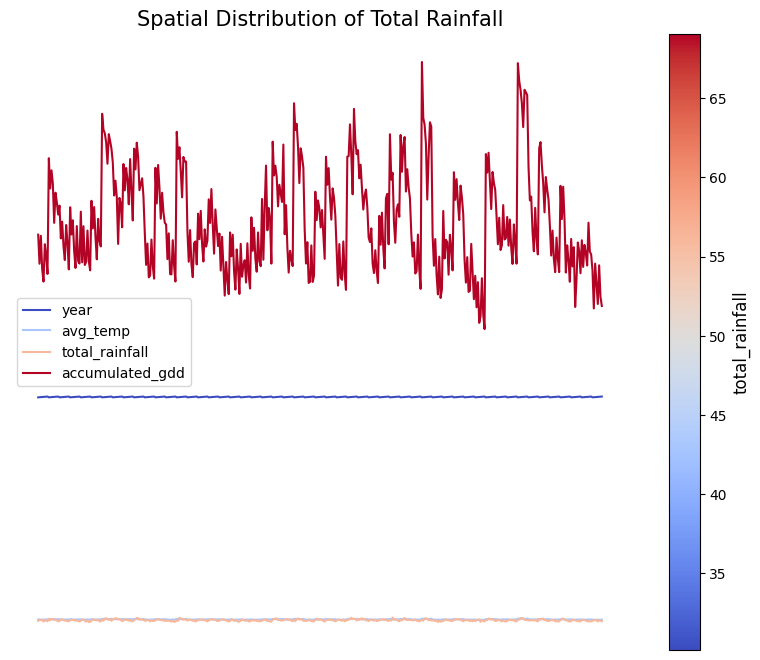

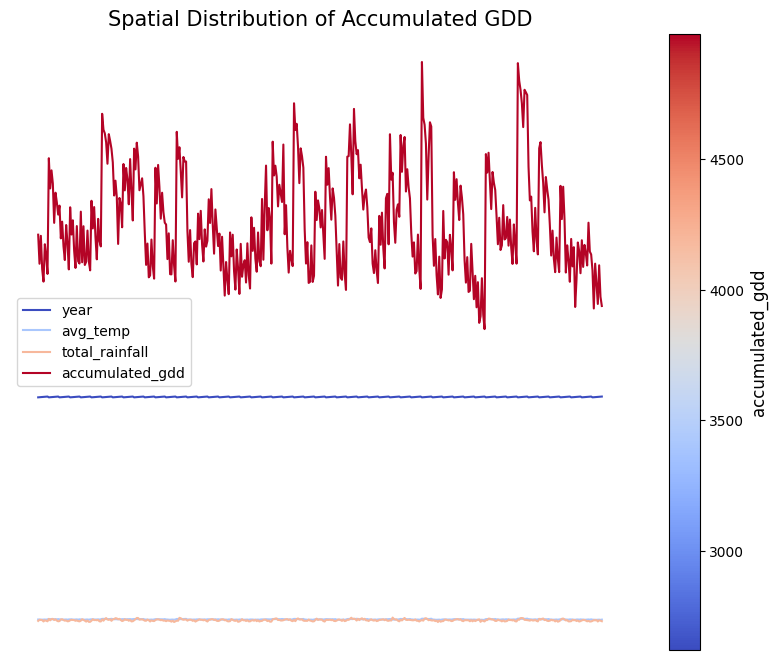

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Step 1: Aggregate daily data into yearly data for each county
df_weather_projected['date'] = pd.to_datetime(df_weather_projected['date'])  # Ensure 'date' is datetime

# Extract the year from 'date'
df_weather_projected['year'] = df_weather_projected['date'].dt.year

# Aggregate to get yearly total rainfall and mean temperature per county
yearly_aggregates = df_weather_projected.groupby(['county', 'year']).agg(
    avg_temp=('meantemp', 'mean'),
    total_rainfall=('rainfall', 'sum'),
    accumulated_gdd=('gdd', 'sum')
).reset_index()

# Step 2: Ensure df_weather_projected is a GeoDataFrame with valid geometry
df_weather_projected = gpd.GeoDataFrame(df_weather_projected, geometry='geometry')

# Merge the aggregated yearly data with county geometries (keeping only unique geometries per county)
county_geometries = df_weather_projected[['county', 'geometry']].drop_duplicates(subset=['county'])

# Merge yearly aggregates with county geometries
df_merged = pd.merge(yearly_aggregates, county_geometries, on='county', how='left')

# Step 3: Create choropleth maps to plot spatial distribution

def plot_choropleth(data, column, title, cmap='coolwarm'):
    # Plot the choropleth map
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    # Create the plot
    data.plot(column=column, cmap=cmap, ax=ax)

    # Customize the plot
    ax.set_title(title, fontsize=15)
    plt.axis('off')

    # Add the colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=data[column].min(), vmax=data[column].max()))
    sm.set_array([])  # Empty array for ScalarMappable
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(column, fontsize=12)

    plt.show()

# Step 4: Plot the spatial distribution maps

# Plot for Average Temperature
plot_choropleth(df_merged, 'avg_temp', 'Spatial Distribution of Average Temperature')

# Plot for Total Rainfall
plot_choropleth(df_merged, 'total_rainfall', 'Spatial Distribution of Total Rainfall')

# Plot for Accumulated GDD
plot_choropleth(df_merged, 'accumulated_gdd', 'Spatial Distribution of Accumulated GDD')


Shape of X_filtered: (284, 365, 4)
Shape of y_filtered: (284,)


In [ ]:
# Encode the Target Variable
print(type(X_filtered))  # Should be <class 'numpy.ndarray'>
print(type(y_filtered))  # Should be <class 'numpy.ndarray'>
print(X_filtered.shape)  # Should print (234, 365, 4)
print(y_filtered.shape)  # Should print (234,)



# Ensure X_remaining and y_remaining are correctly formatted numpy arrays
X_filtered = np.asarray(X_filtered)
y_filtered = np.asarray(y_filtered)

# Perform the train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_filtered, y_filtered, test_size=0.2, random_state=42
)

# Verify the shapes after splitting
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_test: {y_test.shape}")

try:
    X_train, X_test, y_train, y_test = train_test_split(
        X_filtered, y_filtered, test_size=0.2, random_state=42
    )
except Exception as e:
    print(f"Error during train_test_split: {e}")
    print(f"Type of X_filtered: {type(X_filtered)}, shape: {X_filtered.shape}")
    print(f"Type of y_filtered: {type(y_filtered)}, shape: {y_filtered.shape}")


<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(284, 365, 4)
(284,)
Shape of X_train: (227, 365, 4)
Shape of y_train: (227,)
Shape of X_test: (57, 365, 4)
Shape of y_test: (57,)


In [ ]:
print(f"Shape of X_filtered: {X_filtered.shape}")
print(f"Shape of y_filtered: {y_filtered.shape}")
#print(f"Shape of county_year_remaining: {county_year_filtered.shape}")

Shape of X_filtered: (284, 365, 4)
Shape of y_filtered: (284,)


In [ ]:
model = KNeighborsTimeSeriesClassifier(n_neighbors=5)
model.fit(X_train, y_train)

KNeighborsTimeSeriesClassifier(n_neighbors=5)

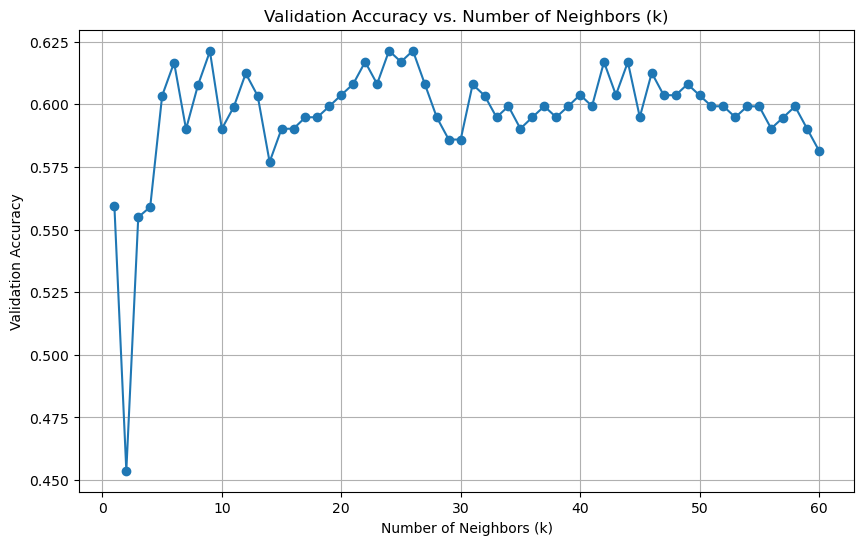

Best n_neighbors: 24
Best cross-validation accuracy: 0.621345029239766
Classification Report on Test Set:
              precision    recall  f1-score   support

           B       0.50      0.11      0.18         9
           G       0.40      0.25      0.31        16
           N       0.56      0.78      0.65        32

    accuracy                           0.53        57
   macro avg       0.49      0.38      0.38        57
weighted avg       0.50      0.53      0.48        57

Confusion Matrix on Test Set:
[[ 1  0  8]
 [ 0  4 12]
 [ 1  6 25]]


In [ ]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV
import matplotlib.pyplot as plt

# Encode the Target Variable
le_y = LabelEncoder()
y_encoded = le_y.fit_transform(y_filtered)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X_filtered, y_encoded, test_size=0.2, random_state=42
)

# Define the parameter grid for n_neighbors (from 1 to 60)
param_grid = {'n_neighbors': list(range(1, 61))}

# Set up the KNeighborsTimeSeriesClassifier
model = KNeighborsTimeSeriesClassifier()

# Use StratifiedKFold for cross-validation with reduced splits
stratified_kf = StratifiedKFold(n_splits=3)  # Adjust n_splits based on the smallest class size

# Set up GridSearchCV with StratifiedKFold
grid_search = GridSearchCV(model, param_grid, cv=stratified_kf, scoring='accuracy')

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Extract the validation accuracies for each n_neighbors value
validation_accuracies = grid_search.cv_results_['mean_test_score']
n_neighbors_range = list(range(1, 61))

# Plot the validation accuracies
plt.figure(figsize=(10, 6))
plt.plot(n_neighbors_range, validation_accuracies, marker='o')
plt.title('Validation Accuracy vs. Number of Neighbors (k)')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Validation Accuracy')
plt.grid(True)
plt.show()

# Print the best parameters and the best score
print("Best n_neighbors:", grid_search.best_params_['n_neighbors'])
print("Best cross-validation accuracy:", grid_search.best_score_)

# Use the best estimator to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Evaluate the model on the test set
print("Classification Report on Test Set:")
print(classification_report(y_test, y_pred, target_names=[str(cls) for cls in le_y.classes_]))

print("Confusion Matrix on Test Set:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
# Convert the classes to strings
target_names = [str(class_label) for class_label in le_y.classes_]

# Evaluate the Model on the Test Set
print("Classification Report on Test Set:")
print(classification_report(y_test, y_pred, target_names=target_names))

print("Confusion Matrix on Test Set:")
print(confusion_matrix(y_test, y_pred))

Classification Report on Test Set:
              precision    recall  f1-score   support

           B       0.50      0.11      0.18         9
           G       0.40      0.25      0.31        16
           N       0.56      0.78      0.65        32

    accuracy                           0.53        57
   macro avg       0.49      0.38      0.38        57
weighted avg       0.50      0.53      0.48        57

Confusion Matrix on Test Set:
[[ 1  0  8]
 [ 0  4 12]
 [ 1  6 25]]


## 2-D CNN model with categories

In [ ]:
# Reshape X to have a single channel (for grayscale image-like input)
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1)


In [ ]:
model_2d = Sequential()

# First 2D convolutional layer with padding to maintain dimensions
model_2d.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same', input_shape=(X_train_2d.shape[1], X_train_2d.shape[2], 1)))
model_2d.add(MaxPooling2D(pool_size=(2, 2)))
model_2d.add(Dropout(0.5))

# Second 2D convolutional layer with padding
model_2d.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'))
model_2d.add(MaxPooling2D(pool_size=(2, 2)))
model_2d.add(Dropout(0.5))

# Third 2D convolutional layer with padding (if needed)
model_2d.add(Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'))
#model_2d.add(MaxPooling2D(pool_size=(2, 2)))
model_2d.add(Dropout(0.5))

# Flatten the output and add Dense layers
model_2d.add(Flatten())
model_2d.add(Dense(100, activation='relu'))
model_2d.add(Dropout(0.5))
model_2d.add(Dense(len(le_y.classes_), activation='softmax'))

# Compile the model
model_2d.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Model summary to verify the layer dimensions
model_2d.summary()

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 365, 4, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 182, 2, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 182, 2, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 182, 2, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 91, 1, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 91, 1, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 91, 1, 128)     │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 91, 1, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 11648)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 100)            │     1,164,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,257,875 (4.80 MB)

 Trainable params: 1,257,875 (4.80 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history_2d = model_2d.fit(X_train_2d, y_train, epochs=50, batch_size=32, validation_data=(X_test_2d, y_test))


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - accuracy: 0.4900 - loss: 7.2326 - val_accuracy: 0.5319 - val_loss: 1.4732
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.3124 - loss: 7.7404 - val_accuracy: 0.5319 - val_loss: 0.9754
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.3967 - loss: 5.7065 - val_accuracy: 0.5319 - val_loss: 1.1391
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.4705 - loss: 4.3940 - val_accuracy: 0.5319 - val_loss: 0.9791
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.5734 - loss: 2.9963 - val_accuracy: 0.5106 - val_loss: 0.9499
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.4239 - loss: 2.8328 - val_accuracy: 0.4255 - val_loss: 0.9611
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.4260 - loss: 2.5105 - val_accuracy: 0.5319 - val_loss: 1.0382
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.3975 - loss: 1.8884 - val_accuracy: 0.5319 - val_loss: 1.0602

In [ ]:
# Make predictions on the test set
y_pred_prob = model_2d.predict(X_test_2d)  # Get the predicted probabilities
y_pred = np.argmax(y_pred_prob, axis=1)  # Convert probabilities to class labels


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step


In [ ]:
from sklearn.metrics import confusion_matrix

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

print("Confusion Matrix:")
print(conf_matrix)


Confusion Matrix:
[[ 0  0  5]
 [ 0  0 17]
 [ 0  0 25]]


In [ ]:
from sklearn.metrics import classification_report

# Generate the classification report
class_report = classification_report(y_test, y_pred, target_names=[str(cls) for cls in le_y.classes_])

print("Classification Report:")
print(class_report)


Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         5
           1       0.00      0.00      0.00        17
           2       0.53      1.00      0.69        25

    accuracy                           0.53        47
   macro avg       0.18      0.33      0.23        47
weighted avg       0.28      0.53      0.37        47



C:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


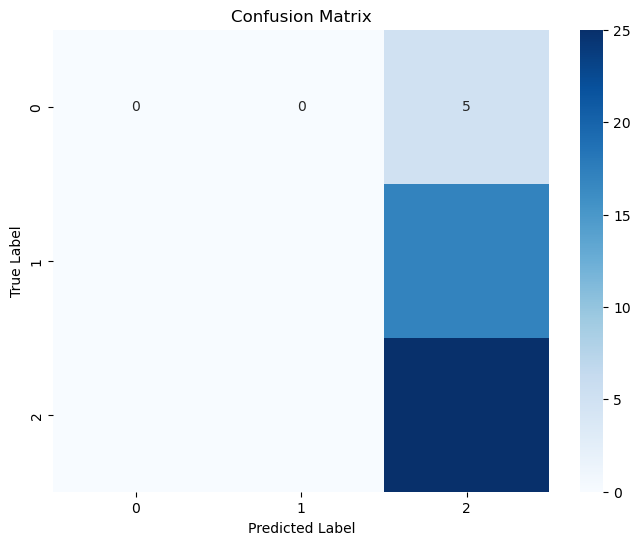

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=[str(cls) for cls in le_y.classes_], yticklabels=[str(cls) for cls in le_y.classes_])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


## CNN 1D for yield class

In [ ]:
model_1d = Sequential()

# First 1D convolutional layer with padding to maintain dimensions
model_1d.add(Conv1D(filters=256, kernel_size=3, activation='relu', padding='same', input_shape=(X_train.shape[1], X_train.shape[2])))
model_1d.add(MaxPooling1D(pool_size=2))
model_1d.add(Dropout(0.5))

# Second 1D convolutional layer with padding
model_1d.add(Conv1D(filters=128, kernel_size=3, activation='relu', padding='same'))
model_1d.add(MaxPooling1D(pool_size=2))
model_1d.add(Dropout(0.5))

# Third 1D convolutional layer with padding
model_1d.add(Conv1D(filters=64, kernel_size=3, activation='relu', padding='same'))
# No third pooling layer, as in the 2D version
model_1d.add(MaxPooling1D(pool_size=2))
model_1d.add(Dropout(0.2))

model_1d.add(Conv1D(filters=32, kernel_size=3, activation='relu', padding='same'))
model_1d.add(MaxPooling1D(pool_size=2))
model_1d.add(Dropout(0.2))

model_1d.add(Conv1D(filters=16, kernel_size=3, activation='relu', padding='same'))
# No third pooling layer, as in the 2D version
model_1d.add(MaxPooling1D(pool_size=2))
model_1d.add(Dropout(0.5))

# Flatten the output and add Dense layers
model_1d.add(Flatten())
model_1d.add(Dense(100, activation='relu'))
model_1d.add(Dropout(0.2))
model_1d.add(Dense(len(le_y.classes_), activation='softmax'))  # For classification, softmax activation

# Compile the model
model_1d.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Model summary to verify the layer dimensions
model_1d.summary()

C:\Users\ASUS\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_30 (Conv1D)              │ (None, 365, 256)       │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_22 (MaxPooling1D) │ (None, 182, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_68 (Dropout)            │ (None, 182, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_31 (Conv1D)              │ (None, 182, 128)       │        98,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_23 (MaxPooling1D) │ (None, 91, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_69 (Dropout)            │ (None, 91, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_32 (Conv1D)              │ (None, 91, 64)         │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_24 (MaxPooling1D) │ (None, 45, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_70 (Dropout)            │ (None, 45, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_33 (Conv1D)              │ (None, 45, 32)         │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_25 (MaxPooling1D) │ (None, 22, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_71 (Dropout)            │ (None, 22, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_34 (Conv1D)              │ (None, 22, 16)         │         1,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_26 (MaxPooling1D) │ (None, 11, 16)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_72 (Dropout)            │ (None, 11, 16)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 176)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 100)            │        17,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_73 (Dropout)            │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 3)              │           303 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 152,131 (594.26 KB)

 Trainable params: 152,131 (594.26 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Assuming y_train contains the class labels
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)

# Convert to a dictionary format required by Keras
class_weights = dict(enumerate(class_weights))

print("Class Weights:", class_weights)


Class Weights: {0: 1.9479166666666667, 1: 1.6846846846846846, 2: 0.5282485875706214}


In [ ]:
# Train the model
history_1d = model_1d.fit(
    X_train, y_train,
    epochs=100,
    batch_size=8,
    validation_data=(X_test, y_test)
    #class_weight=class_weights  # Apply the class weights here
)


Epoch 1/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 24s 122ms/step - accuracy: 0.2744 - loss: 13.4529 - val_accuracy: 0.5319 - val_loss: 1.1131
Epoch 2/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.5240 - loss: 6.2708 - val_accuracy: 0.5319 - val_loss: 1.0834
Epoch 3/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.4436 - loss: 5.6631 - val_accuracy: 0.5319 - val_loss: 1.0709
Epoch 4/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.4743 - loss: 5.4185 - val_accuracy: 0.5319 - val_loss: 1.0386
Epoch 5/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - accuracy: 0.4915 - loss: 3.7398 - val_accuracy: 0.5319 - val_loss: 1.0533
Epoch 6/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.3830 - loss: 4.6259 - val_accuracy: 0.5106 - val_loss: 1.0306
Epoch 7/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.4681 - loss: 3.7610 - val_accuracy: 0.4468 - val_loss: 1.0255
Epoch 8/100
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.4216 - loss: 3.7469 - val_accuracy:

## LSTM classification model

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder
le_y = LabelEncoder()

# Fit and transform y to encode the categorical labels as integers
y_encoded = le_y.fit_transform(y)

# Check the mapping
print("Label mapping:", dict(zip(le_y.classes_, le_y.transform(le_y.classes_))))


Label mapping: {'B': 0, 'G': 1, 'N': 2}


In [ ]:
# Assuming X_remaining is your data with shape (samples, days, features)
# y_remaining is your target yield data

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_encoded, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}")  # Should be (samples, 365, 4)
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")
y_train

Shape of X_train: (227, 365, 4)
Shape of X_test: (57, 365, 4)
Shape of y_train: (227,)
Shape of y_test: (57,)


array([2, 1, 0, 2, 2, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0,
       1, 2, 0, 1, 2, 2, 2, 2, 2, 1, 0, 1, 2, 2, 2, 0, 1, 1, 0, 1, 0, 1,
       0, 2, 1, 0, 0, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2,
       2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1,
       0, 1, 2, 2, 2, 2, 2, 0, 2, 2, 1, 2, 2, 1, 0, 2, 1, 2, 0, 2, 1, 2,
       2, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 1, 0, 2, 2, 2, 0, 2, 2, 2,
       2, 2, 2, 2, 0, 2, 2, 2, 1, 0, 2, 1, 2, 1, 1, 2, 2, 2, 0, 2, 2, 2,
       2, 2, 1, 2, 2, 0, 0, 1, 1, 2, 0, 2, 2, 2, 2, 0, 0, 2, 1, 2, 1, 1,
       2, 2, 2, 1, 2, 0, 1, 2, 1, 2, 2, 2, 2, 2, 2, 0, 2, 1, 2, 1, 2, 1,
       1, 2, 1, 0, 2, 0, 0, 0, 1, 1, 2, 1, 2, 2, 2, 1, 0, 2, 1, 2, 2, 2,
       2, 1, 2, 1, 1, 2, 2], dtype=int64)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

model_lstm = Sequential()

# First LSTM layer with Dropout regularization
model_lstm.add(LSTM(256, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
#model_lstm.add(Dropout(0.5))
model_lstm.add(LSTM(128, return_sequences=True))
# Second LSTM layer
model_lstm.add(LSTM(64, return_sequences=True))
#model_lstm.add(Dropout(0.5))
model_lstm.add(LSTM(32, return_sequences=False))
# Dense layer with softmax activation for classification
model_lstm.add(Dense(len(le_y.classes_), activation='softmax'))

# Compile the model
model_lstm.compile(optimizer =Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Model summary to verify the layer dimensions
model_lstm.summary()


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_16 (LSTM)                  │ (None, 365, 256)       │       267,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_17 (LSTM)                  │ (None, 365, 128)       │       197,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_18 (LSTM)                  │ (None, 365, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_19 (LSTM)                  │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 526,307 (2.01 MB)

 Trainable params: 526,307 (2.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the LSTM model
history_lstm = model_lstm.fit(
    X_train, y_train,
    epochs=100,
    batch_size=8,
    validation_data=(X_test, y_test)
    #class_weight=class_weights  # Apply class weights if necessary
)


Epoch 1/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 63s 2s/step - accuracy: 0.4751 - loss: 1.0181 - val_accuracy: 0.5614 - val_loss: 0.9799
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.5475 - loss: 1.0080 - val_accuracy: 0.5614 - val_loss: 0.9751
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.5935 - loss: 0.9597 - val_accuracy: 0.5614 - val_loss: 0.9758
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.5427 - loss: 1.0103 - val_accuracy: 0.5614 - val_loss: 0.9759
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.5835 - loss: 0.9628 - val_accuracy: 0.5614 - val_loss: 0.9752
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.5891 - loss: 0.9530 - val_accuracy: 0.5614 - val_loss: 0.9751
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.5672 - loss: 0.9731 - val_accuracy: 0.5614 - val_loss: 0.9742
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.6028 - loss: 0.9241 - val_accuracy: 0.5614 - v

KeyboardInterrupt: 

In [ ]:
# Predict on the test set
y_pred_lstm = model_lstm.predict(X_test)
y_pred_classes_lstm = np.argmax(y_pred_lstm, axis=1)

# Generate the classification report
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report for LSTM Model:")
print(classification_report(y_test, y_pred_classes_lstm, target_names=[str(cls) for cls in le_y.classes_]))

print("Confusion Matrix for LSTM Model:")
print(confusion_matrix(y_test, y_pred_classes_lstm))


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step
Classification Report for LSTM Model:
              precision    recall  f1-score   support

           B       0.00      0.00      0.00         9
           G       0.00      0.00      0.00        16
           N       0.56      1.00      0.72        32

    accuracy                           0.56        57
   macro avg       0.19      0.33      0.24        57
weighted avg       0.32      0.56      0.40        57

Confusion Matrix for LSTM Model:
[[ 0  0  9]
 [ 0  0 16]
 [ 0  0 32]]


C:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ASUS\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## LSTM Predictor yield

In [ ]:
# Preprocessing

# Step 1: Preparing the Data


df1['year'] = (df1.index.shift(-8, freq='M').year)

# Filter counties that are present in both df1 and df2
common_counties = set(df1['county']).intersection(set(df2['County']))

# Filter df1 and df2 to include only common counties
df1_filtered = df1[df1['county'].isin(common_counties)]
df2_filtered = df2[df2['County'].isin(common_counties)]

# Create a sequence of daily weather data for each county-year pair
county_years = df1_filtered.groupby(['county', 'year'])

X_list = []
y_list = []
valid_pairs = set(zip(df2_filtered['County'], df2_filtered['Year']))

for (county, year), group in county_years:
    # Ensure we are selecting full-year data (365 days)
    if len(group) == 365 and (county, year) in valid_pairs:
        X_list.append(group[['max', 'min', 'meantemp', 'rainfall']].values)
        y_value = df2_filtered[(df2_filtered['County'] == county) & (df2_filtered['Year'] == year)]['Value'].values
        if len(y_value) == 1:  # Ensure there is exactly one yield value
            y_list.append(y_value[0])

# Convert lists to numpy arrays
X = np.array(X_list)  # Shape: (n_samples, 365, 4)
y = np.array(y_list)  # Shape: (n_samples,)

# Check if X and y have data
print(f'Shape of X: {X.shape}')
print(f'Shape of y: {y.shape}')

Shape of X: (284, 365, 4)
Shape of y: (284,)


In [ ]:
# Impute NaN values for 'max', 'min', and 'meantemp' with the mean of each feature
for i, feature in enumerate(['max', 'min', 'meantemp']):
    X[:, :, i] = np.where(np.isnan(X[:, :, i]), np.nanmean(X[:, :, i], axis=0), X[:, :, i])

# Replace NaN values for 'rainfall' with zero
from sklearn.impute import KNNImputer

# Assuming rainfall is the 4th column in X (index 3)

# Step 1: Extract the rainfall data
rainfall_data = X[:, :, 3]

# Step 2: Reshape the data for KNN imputation (KNNImputer expects 2D array)
rainfall_data_reshaped = rainfall_data.reshape(-1, 1)

# Step 3: Apply KNN Imputer
imputer = KNNImputer(n_neighbors=5)  # You can adjust n_neighbors based on your preference
rainfall_imputed = imputer.fit_transform(rainfall_data_reshaped)

# Step 4: Reshape the imputed data back to the original shape
rainfall_imputed = rainfall_imputed.reshape(rainfall_data.shape)

# Step 5: Replace the rainfall column in X with the imputed data
X[:, :, 3] = rainfall_imputed

# Check if NaNs are removed from the rainfall data
print(f'NaN in rainfall after KNN imputation: {np.isnan(X[:, :, 3]).any()}')

# Check if NaNs are removed
print(f'NaN in X after imputation: {np.isnan(X).any()}')

NaN in rainfall after KNN imputation: False
NaN in X after imputation: False


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}")  # Should be (samples, 365, 4)
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")
X_train

Shape of X_train: (227, 365, 4)
Shape of X_test: (57, 365, 4)
Shape of y_train: (227,)
Shape of y_test: (57,)


array([[[7.30000000e+01, 5.10000000e+01, 6.20000000e+01, 0.00000000e+00],
        [6.40000000e+01, 5.20000000e+01, 5.80000000e+01, 0.00000000e+00],
        [6.90000000e+01, 5.40000000e+01, 6.15000000e+01, 1.00000000e-02],
        ...,
        [8.70000000e+01, 7.20000000e+01, 7.95000000e+01, 0.00000000e+00],
        [8.30000000e+01, 5.80000000e+01, 7.05000000e+01, 0.00000000e+00],
        [7.40000000e+01, 5.80000000e+01, 6.60000000e+01, 0.00000000e+00]],

       [[8.60000000e+01, 6.00000000e+01, 7.30000000e+01, 0.00000000e+00],
        [8.80000000e+01, 7.00000000e+01, 7.90000000e+01, 0.00000000e+00],
        [9.00000000e+01, 7.05000000e+01, 8.02500000e+01, 2.00000000e-02],
        ...,
        [7.55000000e+01, 5.40000000e+01, 6.47500000e+01, 4.00000000e-03],
        [8.15000000e+01, 5.70000000e+01, 6.92500000e+01, 0.00000000e+00],
        [7.70000000e+01, 5.70000000e+01, 6.70000000e+01, 0.00000000e+00]],

       [[7.70000000e+01, 5.60000000e+01, 6.65000000e+01, 0.00000000e+00],
        

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
# Initialize the scaler
scaler = MinMaxScaler()

# Reshape X_train and X_test to 2D to fit the scaler
n_samples, n_timesteps, n_features = X_train.shape
X_train_reshaped = X_train.reshape(-1, n_features)
X_test_reshaped = X_test.reshape(-1, n_features)

# Fit the scaler on the training data and transform both training and test data
X_train_scaled = scaler.fit_transform(X_train_reshaped)
X_test_scaled = scaler.transform(X_test_reshaped)

# Reshape back to the original 3D shape for LSTM
X_train_scaled = X_train_scaled.reshape(n_samples, n_timesteps, n_features)
X_test_scaled = X_test_scaled.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])


In [ ]:
!pip show tensorflow

# Upgrade TensorFlow to the latest version (if needed)
!pip install --upgrade tensorflow

Name: tensorflow
Version: 2.17.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, requests, setuptools, six, tensorboard, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tf_keras


In [ ]:
import tensorflow as tf

# Check if TensorFlow is running on the GPU
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("TensorFlow version:", tf.__version__)


Num GPUs Available:  1
TensorFlow version: 2.17.0


In [ ]:
!nvidia-smi

Tue Aug 20 23:30:25 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8               9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define the LSTM model
model_lstm_regression = Sequential()

# First LSTM layer with Dropout regularization
model_lstm_regression.add(LSTM(512, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2]), return_sequences=True))
model_lstm_regression.add(Dropout(0.2))
model_lstm_regression.add(LSTM(256, return_sequences=True))
model_lstm_regression.add(Dropout(0.2))
model_lstm_regression.add(LSTM(128, return_sequences=True))
model_lstm_regression.add(Dropout(0.2))
# Second LSTM layer
model_lstm_regression.add(LSTM(64, return_sequences=True))
model_lstm_regression.add(Dropout(0.2))
model_lstm_regression.add(LSTM(32, return_sequences=True))
model_lstm_regression.add(Dropout(0.2))
model_lstm_regression.add(LSTM(16, return_sequences=False))
model_lstm_regression.add(Dropout(0.2))
# Dense layer for regression (output layer with one neuron for continuous value)
model_lstm_regression.add(Dense(1, activation='linear'))

# Compile the model
model_lstm_regression.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error', metrics=['mae'])

# Print model summary to verify the architecture
model_lstm_regression.summary()


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_18 (LSTM)                       │ (None, 365, 512)            │       1,058,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 365, 512)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_19 (LSTM)                       │ (None, 365, 256)            │         787,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_18 (Dropout)                 │ (None, 365, 256)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_20 (LSTM)                       │ (None, 365, 128)            │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_19 (Dropout)                 │ (None, 365, 128)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_21 (LSTM)                       │ (None, 365, 64)             │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_20 (Dropout)                 │ (None, 365, 64)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_22 (LSTM)                       │ (None, 365, 32)             │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 365, 32)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_23 (LSTM)                       │ (None, 16)                  │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,108,369 (8.04 MB)

 Trainable params: 2,108,369 (8.04 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history_lstm_regression = model_lstm_regression.fit(
    X_train_scaled, y_train,
    epochs=700,
    batch_size=16,
    validation_data=(X_test_scaled, y_test)
)


Epoch 1/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - loss: 34325.7461 - mae: 184.5558 - val_loss: 33891.1328 - val_mae: 183.4767
Epoch 2/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step - loss: 34274.2891 - mae: 184.4342 - val_loss: 33680.7617 - val_mae: 182.9025
Epoch 3/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 33951.6289 - mae: 183.5859 - val_loss: 33549.2734 - val_mae: 182.5427
Epoch 4/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 33646.0234 - mae: 182.7821 - val_loss: 33448.3164 - val_mae: 182.2660
Epoch 5/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - loss: 34113.6602 - mae: 184.0139 - val_loss: 33369.8672 - val_mae: 182.0506
Epoch 6/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 33696.6719 - mae: 182.8463 - val_loss: 33306.2891 - val_mae: 181.8759
Epoch 7/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 33882.6641 - mae: 183.3938 - val_loss: 33247.0312 - val_mae: 181.7129
Epoch 8/700
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 33287.0938 - mae: 181.

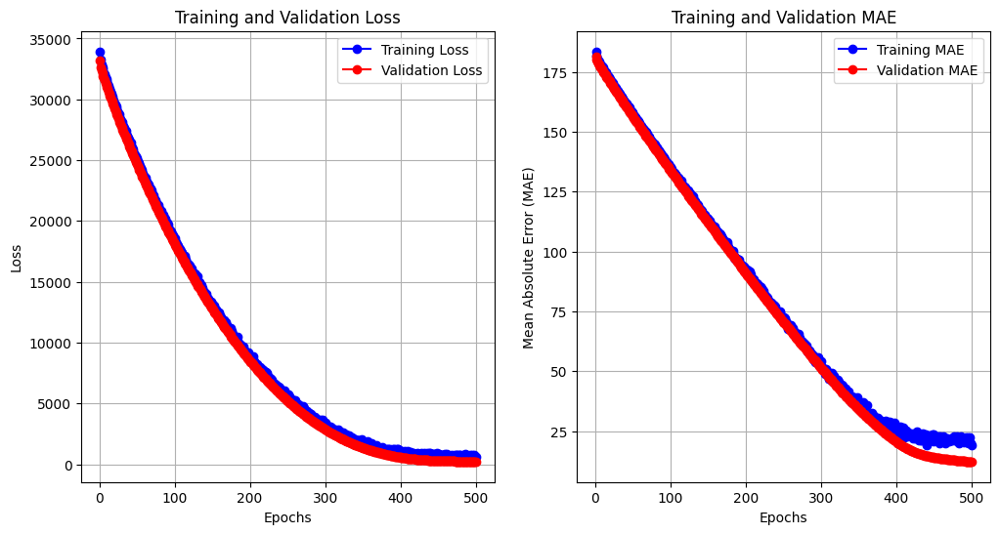

In [ ]:
import matplotlib.pyplot as plt

# Extract loss and metrics from the training history
loss = history_lstm_regression.history['loss']
val_loss = history_lstm_regression.history['val_loss']
mae = history_lstm_regression.history.get('mae', None)
val_mae = history_lstm_regression.history.get('val_mae', None)

epochs = range(1, len(loss) + 1)

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot training and validation MAE (if available)
if mae is not None and val_mae is not None:
    plt.subplot(1, 2, 2)
    plt.plot(epochs, mae, 'bo-', label='Training MAE')
    plt.plot(epochs, val_mae, 'ro-', label='Validation MAE')
    plt.title('Training and Validation MAE')
    plt.xlabel('Epochs')
    plt.ylabel('Mean Absolute Error (MAE)')
    plt.legend()
    plt.grid(True)

plt.show()
